<a href="https://colab.research.google.com/github/srinivasdasu24/Kaggle_Problems/blob/master/Santander_customer_satisfaction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Kaggle setup and dataset loading

In [ ]:
# Importing library to upload the files
from google.colab import files

In [ ]:
# Installing kaggle library
!pip install -q kaggle

In [ ]:
# Uploading the files
upload = files.upload()

Saving kaggle.json to kaggle.json


In [ ]:
# Make a directory named 'kaggle' in root folder. This will let you know if 
# any directory is already present
!mkdir ~/.kaggle 

In [ ]:
# Copy the jason file there. This should also give you an user access warning
!cp kaggle.json ~/.kaggle/

In [ ]:
# changing the directory permissions 
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
# lisitng the avilable files and folders in pwd
!ls

kaggle.json  sample_data


In [ ]:
# Lists the avilable datasets in kaggle
! kaggle datasets list

ref                                                         title                                             size  lastUpdated          downloadCount  
----------------------------------------------------------  -----------------------------------------------  -----  -------------------  -------------  
roche-data-science-coalition/uncover                        UNCOVER COVID-19 Challenge                       179MB  2020-05-21 18:57:53          16770  
rohanrao/chai-time-data-science                             Chai Time Data Science | CTDS.Show                 3MB  2020-07-23 17:23:46            493  
garystafford/environmental-sensor-data-132k                 Environmental Sensor Telemetry Data                7MB  2020-07-20 17:18:10            102  
tanmoyx/covid19-patient-precondition-dataset                COVID-19 patient pre-condition dataset             8MB  2020-07-22 16:37:50            462  
andrewmvd/data-analyst-jobs                                 Data Analyst Jobs     

In [ ]:
# list the avilable competitions list
!kaggle competitions list

ref                                            deadline             category            reward  teamCount  userHasEntered  
---------------------------------------------  -------------------  ---------------  ---------  ---------  --------------  
tpu-getting-started                            2030-06-03 23:59:00  Getting Started      Kudos        216           False  
digit-recognizer                               2030-01-01 00:00:00  Getting Started  Knowledge       2977           False  
titanic                                        2030-01-01 00:00:00  Getting Started  Knowledge      22240            True  
house-prices-advanced-regression-techniques    2030-01-01 00:00:00  Getting Started  Knowledge       5145           False  
connectx                                       2030-01-01 00:00:00  Getting Started  Knowledge        819           False  
nlp-getting-started                            2030-01-01 00:00:00  Getting Started      Kudos       1572           False  
competit

In [ ]:
# Lists the files for the given competition
! kaggle competitions files santander-customer-satisfaction

name                    size  creationDate         
---------------------  -----  -------------------  
test.csv                56MB  2019-12-11 03:51:43  
sample_submission.csv  612KB  2019-12-11 03:51:43  
train.csv               57MB  2019-12-11 03:51:43  


In [ ]:
!pwd

/content


In [ ]:
! mkdir santander_customer_satisfaction

In [ ]:
!cd santander_customer_satisfaction

In [ ]:
!pwd

/content


In [ ]:
# Downlaoding data set using competition name
! kaggle competitions download santander-customer-satisfaction -f test.csv

100% 4.02M/4.02M [00:00<00:00, 21.0MB/s]



In [ ]:
! kaggle competitions download santander-customer-satisfaction -f train.csv

100% 4.05M/4.05M [00:00<00:00, 11.3MB/s]



In [ ]:
!pwd
!ls

/content
kaggle.json  sample_data  test.csv.zip	train.csv.zip


In [ ]:
# unzipping the zip file
!unzip test.csv.zip

Archive:  test.csv.zip
  inflating: test.csv                


In [ ]:
!unzip train.csv.zip

Archive:  train.csv.zip
  inflating: train.csv               


## Importing required libraries

In [ ]:
# importing necessary modules for preprocessing and visualization
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


## Data Analysis
In Data analysis, we will explore below points

*   Dataset info , datatypes, etc.
*   Null value/Missing value check
*   Target value distribution
*   Finding constant features, duplicates features, and approx constant features
*   Removing above features from both train and test dataset
*   Visualize the features against target
*   Distribution of numerical variables
*   Feature correlation
*   Feature variance analysis
*   Outlier detection











In [ ]:
# creating train and test data from csv files
train_data = pd.read_csv('train.csv')
test_data = pd.read_csv('test.csv')

In [ ]:
# checking the shape of the train dataset
print(train_data.shape,test_data.shape)

(76020, 371) (75818, 370)


In [ ]:
# checking the 5 values from top in the dataset 
train_data.head()

,ID,var3,var15,imp_ent_var16_ult1,imp_op_var39_comer_ult1,imp_op_var39_comer_ult3,imp_op_var40_comer_ult1,imp_op_var40_comer_ult3,imp_op_var40_efect_ult1,imp_op_var40_efect_ult3,imp_op_var40_ult1,imp_op_var41_comer_ult1,imp_op_var41_comer_ult3,imp_op_var41_efect_ult1,imp_op_var41_efect_ult3,imp_op_var41_ult1,imp_op_var39_efect_ult1,imp_op_var39_efect_ult3,imp_op_var39_ult1,imp_sal_var16_ult1,ind_var1_0,ind_var1,ind_var2_0,ind_var2,ind_var5_0,ind_var5,ind_var6_0,ind_var6,ind_var8_0,ind_var8,ind_var12_0,ind_var12,ind_var13_0,ind_var13_corto_0,ind_var13_corto,ind_var13_largo_0,ind_var13_largo,ind_var13_medio_0,ind_var13_medio,ind_var13,...,saldo_medio_var5_ult1,saldo_medio_var5_ult3,saldo_medio_var8_hace2,saldo_medio_var8_hace3,saldo_medio_var8_ult1,saldo_medio_var8_ult3,saldo_medio_var12_hace2,saldo_medio_var12_hace3,saldo_medio_var12_ult1,saldo_medio_var12_ult3,saldo_medio_var13_corto_hace2,saldo_medio_var13_corto_hace3,saldo_medio_var13_corto_ult1,saldo_medio_var13_corto_ult3,saldo_medio_var13_largo_hace2,saldo_medio_var13_largo_hace3,saldo_medio_var13_largo_ult1,saldo_medio_var13_largo_ult3,saldo_medio_var13_medio_hace2,saldo_medio_var13_medio_hace3,saldo_medio_var13_medio_ult1,saldo_medio_var13_medio_ult3,saldo_medio_var17_hace2,saldo_medio_var17_hace3,saldo_medio_var17_ult1,saldo_medio_var17_ult3,saldo_medio_var29_hace2,saldo_medio_var29_hace3,saldo_medio_var29_ult1,saldo_medio_var29_ult3,saldo_medio_var33_hace2,saldo_medio_var33_hace3,saldo_medio_var33_ult1,saldo_medio_var33_ult3,saldo_medio_var44_hace2,saldo_medio_var44_hace3,saldo_medio_var44_ult1,saldo_medio_var44_ult3,var38,TARGET
0,1,2,23,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,39205.170000,0
1,3,2,34,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,1,0,0,0,0,0,0,0,1,1,1,0,0,0,0,1,...,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,300.0,122.22,300.0,240.75,0.0,0.0,0.0,0.0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,49278.030000,0
2,4,2,23,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,3.00,2.07,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,67333.770000,0
3,8,2,37,0.0,195.0,195.0,0.0,0.0,0.0,0.0,0.0,195.0,195.0,0.0,0.0,195.0,0.0,0.0,195.0,0.0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,91.56,138.84,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,64007.970000,0
4,10,2,39,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,...,40501.08,13501.47,0.0,0.0,0.0,0.0,0.0,0.0,85501.89,85501.89,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,117310.979016,0


In [ ]:
# It will describe the dataset by giving mean,standard deviation, min,max, top 25,50,75 percent values for each column
train_data.describe()

,ID,var3,var15,imp_ent_var16_ult1,imp_op_var39_comer_ult1,imp_op_var39_comer_ult3,imp_op_var40_comer_ult1,imp_op_var40_comer_ult3,imp_op_var40_efect_ult1,imp_op_var40_efect_ult3,imp_op_var40_ult1,imp_op_var41_comer_ult1,imp_op_var41_comer_ult3,imp_op_var41_efect_ult1,imp_op_var41_efect_ult3,imp_op_var41_ult1,imp_op_var39_efect_ult1,imp_op_var39_efect_ult3,imp_op_var39_ult1,imp_sal_var16_ult1,ind_var1_0,ind_var1,ind_var2_0,ind_var2,ind_var5_0,ind_var5,ind_var6_0,ind_var6,ind_var8_0,ind_var8,ind_var12_0,ind_var12,ind_var13_0,ind_var13_corto_0,ind_var13_corto,ind_var13_largo_0,ind_var13_largo,ind_var13_medio_0,ind_var13_medio,ind_var13,...,saldo_medio_var5_ult1,saldo_medio_var5_ult3,saldo_medio_var8_hace2,saldo_medio_var8_hace3,saldo_medio_var8_ult1,saldo_medio_var8_ult3,saldo_medio_var12_hace2,saldo_medio_var12_hace3,saldo_medio_var12_ult1,saldo_medio_var12_ult3,saldo_medio_var13_corto_hace2,saldo_medio_var13_corto_hace3,saldo_medio_var13_corto_ult1,saldo_medio_var13_corto_ult3,saldo_medio_var13_largo_hace2,saldo_medio_var13_largo_hace3,saldo_medio_var13_largo_ult1,saldo_medio_var13_largo_ult3,saldo_medio_var13_medio_hace2,saldo_medio_var13_medio_hace3,saldo_medio_var13_medio_ult1,saldo_medio_var13_medio_ult3,saldo_medio_var17_hace2,saldo_medio_var17_hace3,saldo_medio_var17_ult1,saldo_medio_var17_ult3,saldo_medio_var29_hace2,saldo_medio_var29_hace3,saldo_medio_var29_ult1,saldo_medio_var29_ult3,saldo_medio_var33_hace2,saldo_medio_var33_hace3,saldo_medio_var33_ult1,saldo_medio_var33_ult3,saldo_medio_var44_hace2,saldo_medio_var44_hace3,saldo_medio_var44_ult1,saldo_medio_var44_ult3,var38,TARGET
count,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.0,76020.0,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,...,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,7.602000e+04,76020.000000,7.602000e+04,7.602000e+04,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,7.602000e+04,7.602000e+04,76020.000000,76020.0,76020.000000,76020.000000,7.602000e+04,7.602000e+04,7.602000e+04,7.602000e+04,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,7.602000e+04,76020.000000
mean,75964.050723,-1523.199277,33.212865,86.208265,72.363067,119.529632,3.559130,6.472698,0.412946,0.567352,3.160715,68.803937,113.056934,68.205140,113.225058,137.242763,68.618087,113.792410,140.403479,5.477676,0.011458,0.003762,0.0,0.0,0.958024,0.663760,0.000105,0.000026,0.032833,0.028598,0.067522,0.045462,0.052249,0.042936,0.041476,0.010168,0.009997,0.000026,0.000026,0.050855,...,1077.256756,1048.856447,68.275452,9.505287,124.620962,110.026575,3.997023e+03,613.534443,5.703008e+03,4.401002e+03,3639.419939,556.184178,4852.261814,3857.848542,771.227449,162.170439,9.569502e+02,7.509563e+02,0.175324,0.0,0.513023,0.344174,9.117181e+01,3.646318e+01,1.310316e+02,1.092169e+02,0.213071,0.001910,0.253907,0.186630,7.935824,1.365146,12.215580,8.784074,31.505324,1.858575,76.026165,56.614351,1.172358e+05,0.039569
std,43781.947379,39033.462364,12.956486,1614.757313,339.315831,546.266294,93.155749,153.737066,30.604864,36.513513,95.268204,319.605516,512.154823,531.897917,950.086398,697.712596,535.473750,953.578624,712.767240,465.391149,0.106425,0.061221,0.0,0.0,0.200535,0.472425,0.010258,0.005129,0.178202,0.166674,0.250925,0.208316,0.222531,0.202714,0.199390,0.100325,0.099486,0.005129,0.005129,0.219703,...,9614.906985,8189.948852,1733.838226,519.389157,2205.249804,1935.305713,3.777314e+04,9292.752726,4.620254e+04,3.550718e+04,26359.174223,7182

In [ ]:
train_data.columns

Index(['ID', 'var3', 'var15', 'imp_ent_var16_ult1', 'imp_op_var39_comer_ult1',
       'imp_op_var39_comer_ult3', 'imp_op_var40_comer_ult1',
       'imp_op_var40_comer_ult3', 'imp_op_var40_efect_ult1',
       'imp_op_var40_efect_ult3',
       ...
       'saldo_medio_var33_hace2', 'saldo_medio_var33_hace3',
       'saldo_medio_var33_ult1', 'saldo_medio_var33_ult3',
       'saldo_medio_var44_hace2', 'saldo_medio_var44_hace3',
       'saldo_medio_var44_ult1', 'saldo_medio_var44_ult3', 'var38', 'TARGET'],
      dtype='object', length=371)

If we observe the above descriptive statistics, we can take few insights from it, standard deviation is 0 for columns ind_var2_0, ind_var2,saldo_meido_var13_medio_hace3,etc. column var3 has value -999999.000000 which seems to be a garbage value not a real value. We can see most of the columns have 75% as zeros and maximum value is 1 

In [ ]:
# It will get column and its data type
train_data.dtypes   

ID                           int64
var3                         int64
var15                        int64
imp_ent_var16_ult1         float64
imp_op_var39_comer_ult1    float64
                            ...   
saldo_medio_var44_hace3    float64
saldo_medio_var44_ult1     float64
saldo_medio_var44_ult3     float64
var38                      float64
TARGET                       int64
Length: 371, dtype: object

From the above **output** we can say all columns are **continous** columns and there are **no** **categorical** columns in the dataset

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


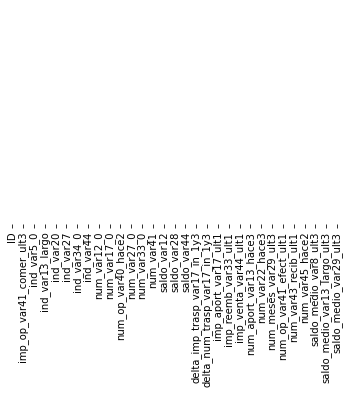

In [ ]:
# importing seaborn module to visulaize 
import seaborn as sns
sns.heatmap(train_data.isnull(), yticklabels=False, cbar=False, cmap='icefire_r')

In [ ]:
# checking columns whether they have null value are not
for feature in train_data.columns:
    print('Missing values in feature ' + str(feature) + ' : ' + str(len(train_data[train_data[feature].isnull() == True])))


Missing values in feature ID : 0
Missing values in feature var3 : 0
Missing values in feature var15 : 0
Missing values in feature imp_ent_var16_ult1 : 0
Missing values in feature imp_op_var39_comer_ult1 : 0
Missing values in feature imp_op_var39_comer_ult3 : 0
Missing values in feature imp_op_var40_comer_ult1 : 0
Missing values in feature imp_op_var40_comer_ult3 : 0
Missing values in feature imp_op_var40_efect_ult1 : 0
Missing values in feature imp_op_var40_efect_ult3 : 0
Missing values in feature imp_op_var40_ult1 : 0
Missing values in feature imp_op_var41_comer_ult1 : 0
Missing values in feature imp_op_var41_comer_ult3 : 0
Missing values in feature imp_op_var41_efect_ult1 : 0
Missing values in feature imp_op_var41_efect_ult3 : 0
Missing values in feature imp_op_var41_ult1 : 0
Missing values in feature imp_op_var39_efect_ult1 : 0
Missing values in feature imp_op_var39_efect_ult3 : 0
Missing values in feature imp_op_var39_ult1 : 0
Missing values in feature imp_sal_var16_ult1 : 0
Missin


we don't have null values in the features as we can see same from the output as above

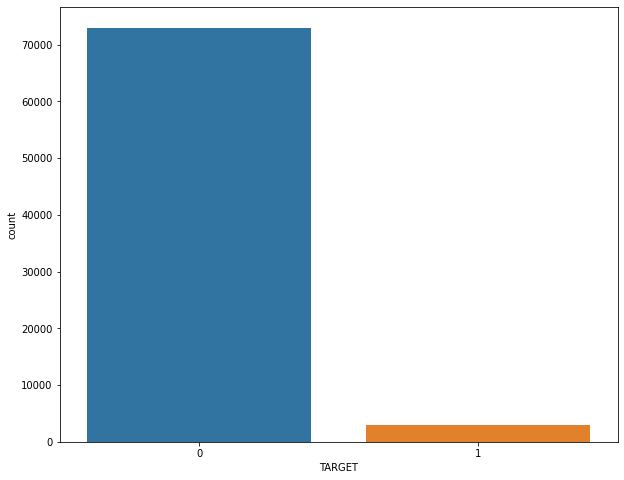

In [ ]:
# To check the distribution of data in the dataset
plt.figure(figsize = (10, 8))
sns.countplot(x = 'TARGET', data = train_data) # from the ouput we can say that it is an unbalanced data 

## Constant and Duplicate feature removal

In [ ]:
# Removing the data with constant features (i.e zero variance where std=0)
constant_features = [
    features for features in train_data.columns if train_data[features].std() == 0
]
len(constant_features)
train_data[constant_features]

,ind_var2_0,ind_var2,ind_var27_0,ind_var28_0,ind_var28,ind_var27,ind_var41,ind_var46_0,ind_var46,num_var27_0,num_var28_0,num_var28,num_var27,num_var41,num_var46_0,num_var46,saldo_var28,saldo_var27,saldo_var41,saldo_var46,imp_amort_var18_hace3,imp_amort_var34_hace3,imp_reemb_var13_hace3,imp_reemb_var33_hace3,imp_trasp_var17_out_hace3,imp_trasp_var33_out_hace3,num_var2_0_ult1,num_var2_ult1,num_reemb_var13_hace3,num_reemb_var33_hace3,num_trasp_var17_out_hace3,num_trasp_var33_out_hace3,saldo_var2_ult1,saldo_medio_var13_medio_hace3
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
76015,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
76016,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
76017,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
76018,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


From the above output we can see the columns having standard devitation as zero, We can remove these columns as features with zero standard deviation(variance is zero) will have no impact on the probability of the outcome(Target) 

In [ ]:
# Drop the constant features from traina and test dataset
train_data.drop(labels = constant_features, axis = 1, inplace=True)
test_data.drop(labels = constant_features, axis = 1, inplace = True)

In [ ]:
# checking the shape of the dataset after dropping the constant features
train_data.shape

(76020, 337)

In [ ]:
test_data.shape

(75818, 336)

After observing the above shapes of test and train data, we are clear that test data has no TARGET feature column 

In [ ]:
# Find the columns where most of the values are equal( approx to 99.9% )
approx_constants = []
for feature in train_data.columns:
    approx_value = (train_data[feature].value_counts()/ np.float(
        len(train_data))).sort_values(ascending=False).values[0]
    if approx_value > 0.999:
      approx_constants.append(feature)
len(approx_constants)
train_data[approx_constants]

,imp_op_var40_efect_ult1,imp_op_var40_efect_ult3,ind_var6_0,ind_var6,ind_var13_medio_0,ind_var13_medio,ind_var18_0,ind_var18,ind_var29_0,ind_var29,ind_var33_0,ind_var33,ind_var34_0,ind_var34,num_var6_0,num_var6,num_var13_medio_0,num_var13_medio,num_var18_0,num_var18,num_op_var40_hace3,num_var29_0,num_var29,num_var33_0,num_var33,num_var34_0,num_var34,saldo_var6,saldo_var13_medio,saldo_var18,saldo_var29,saldo_var33,saldo_var34,delta_imp_amort_var18_1y3,delta_imp_amort_var34_1y3,delta_imp_aport_var17_1y3,delta_imp_aport_var33_1y3,delta_imp_reemb_var13_1y3,delta_imp_reemb_var17_1y3,delta_imp_reemb_var33_1y3,...,imp_trasp_var33_out_ult1,imp_venta_var44_hace3,imp_venta_var44_ult1,ind_var7_emit_ult1,num_aport_var17_hace3,num_aport_var17_ult1,num_aport_var33_hace3,num_aport_var33_ult1,num_var7_emit_ult1,num_compra_var44_hace3,num_meses_var13_medio_ult3,num_meses_var29_ult3,num_meses_var33_ult3,num_op_var40_efect_ult1,num_op_var40_efect_ult3,num_reemb_var13_ult1,num_reemb_var17_hace3,num_reemb_var17_ult1,num_reemb_var33_ult1,num_trasp_var17_in_hace3,num_trasp_var17_in_ult1,num_trasp_var17_out_ult1,num_trasp_var33_in_hace3,num_trasp_var33_in_ult1,num_trasp_var33_out_ult1,num_venta_var44_hace3,num_venta_var44_ult1,saldo_medio_var13_medio_hace2,saldo_medio_var13_medio_ult1,saldo_medio_var13_medio_ult3,saldo_medio_var17_hace3,saldo_medio_var29_hace2,saldo_medio_var29_hace3,saldo_medio_var29_ult1,saldo_medio_var29_ult3,saldo_medio_var33_hace2,saldo_medio_var33_hace3,saldo_medio_var33_ult1,saldo_medio_var33_ult3,saldo_medio_var44_hace3
0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0,0,0.0,0.0,0,0,0,0.0,0.0,0,0,0,...,0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0,0,0.0,0.0,0,0,0,0.0,0.0,0,0,0,...,0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0,0,0.0,0.0,0,0,0,0.0,0.0,0,0,0,...,0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0,0,0.0,0.0,0,0,0,0.0,0.0,0,0,0,...,0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0,0,0.0,0.0,0,0,0,0.0,0.0,0,0,0,...,0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
76015,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0,0,0.0,0.0,0,0,0,0.0,0.0,0,0,0,...,0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
76016,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0,0,0.0,0.0,0,0,0,0.0,0.0,0,0,0,...,0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
76017,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0,0,0.0,0.0,0,0,0,0.0,0.0,0,0,0,...,0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
76018,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0,0,0.0,0.0,0,0,0,0.0,0.0,0,0,0,...,0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


From the above output, we can see that almost most of the columns(99.9%) have values "0" only , Their will be no impact on the "Target varibale" prediction probability  by these column features. So we can remove these columns from our dataset

In [ ]:
# Temporary dataframe for approx_constants
train_data_ac=train_data.copy()
test_data_ac=test_data.copy()

In [ ]:
# Drop the approximate constant features from traina and test dataset
train_data_ac.drop(labels = approx_constants, axis = 1, inplace=True)
test_data_ac.drop(labels = approx_constants, axis = 1, inplace = True)

In [ ]:
print(train_data.shape,train_data_ac.shape,test_data.shape,test_data_ac.shape)

(76020, 337) (76020, 225) (75818, 336) (75818, 224)


In [ ]:
# Remove duplicate data, columns having same values
duplicate_features=[]
# Applying modified sort algorithm , instead of sorting we are creating a features list which mets condition, ignoring other columns
for i in range(0, len(train_data.columns)):
    col_1 = train_data.columns[i]
    for col_2 in train_data.columns[i + 1:]:
        if train_data[col_1].equals(train_data[col_2]):
            duplicate_features.append(col_2)
len(duplicate_features)
train_data[duplicate_features]

,ind_var29_0,ind_var29,ind_var13_medio,ind_var18,ind_var26,ind_var25,ind_var32,ind_var34,ind_var37,ind_var39,num_var29_0,num_var29,num_var13_medio,num_var18,num_var26,num_var25,num_var32,num_var34,num_var37,num_var39,saldo_var29,saldo_medio_var13_medio_ult1,delta_num_reemb_var13_1y3,delta_num_reemb_var17_1y3,delta_num_reemb_var33_1y3,delta_num_trasp_var17_in_1y3,delta_num_trasp_var17_out_1y3,delta_num_trasp_var33_in_1y3,delta_num_trasp_var33_out_1y3
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,6,0,0.0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
76015,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0
76016,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0
76017,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0
76018,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0


In [ ]:
# Dropping the duplicate features from the dataset as their contribute towards prediction of target is neligible 
train_data.drop(labels = duplicate_features, axis = 1, inplace=True)
test_data.drop(labels = duplicate_features, axis = 1, inplace = True)

In [ ]:
# Dropping the duplicate features from the dataset as their contribute towards prediction of target is neligible 
for feature in duplicate_features:
  if feature in train_data_ac and feature in test_data_ac:
    train_data_ac.drop(labels = feature, axis = 1, inplace=True)
    test_data_ac.drop(labels = feature, axis = 1, inplace = True)

In [ ]:

print(train_data.shape,test_data.shape,train_data_ac.shape,test_data_ac.shape)

(76020, 308) (75818, 307) (76020, 215) (75818, 214)


In [ ]:
df = pd.DataFrame(train_data.TARGET.value_counts())
df['Percentage'] = 100*df['TARGET']/train_data.shape[0]
df

,TARGET,Percentage
0,73012,96.043147
1,3008,3.956853


From the above percentage data it is clear that dataset in unbalanced dataset

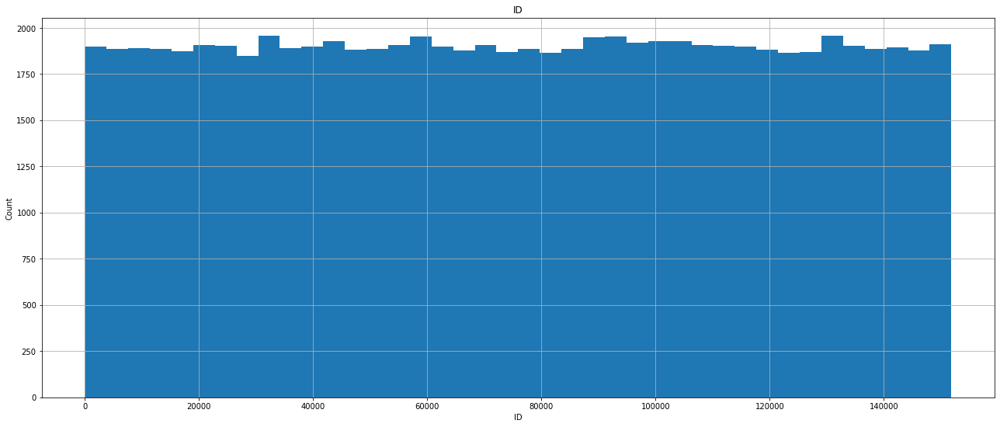

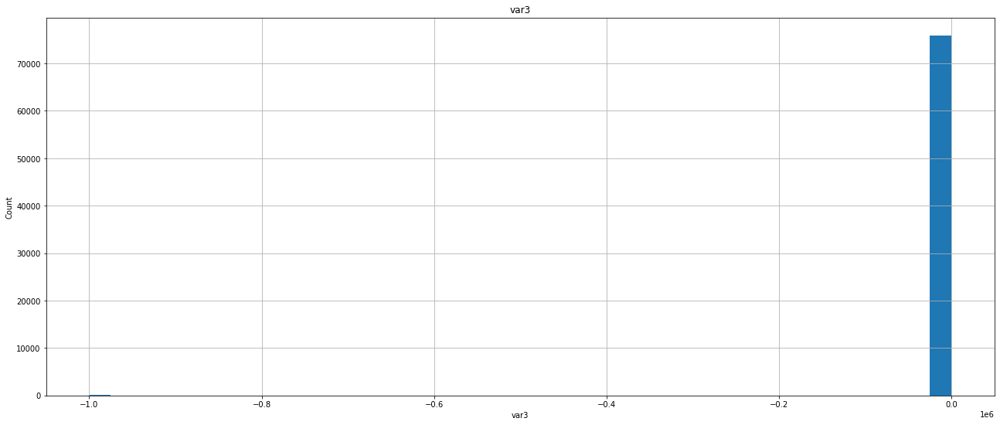

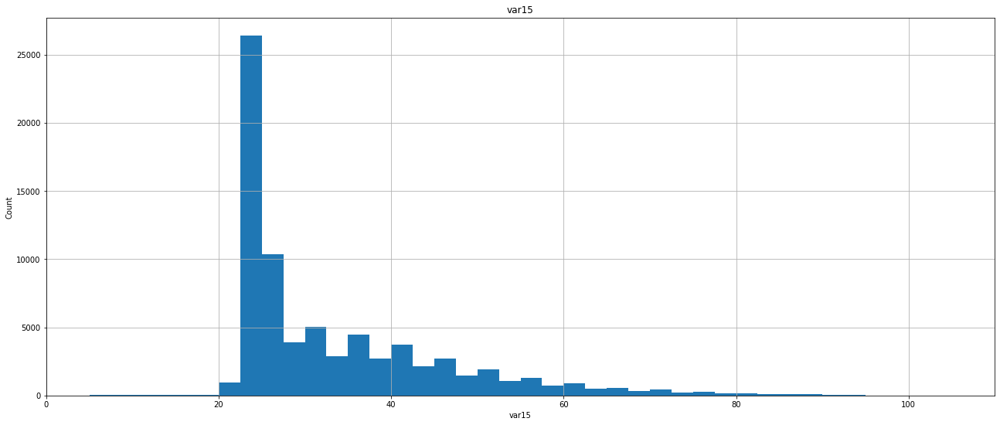

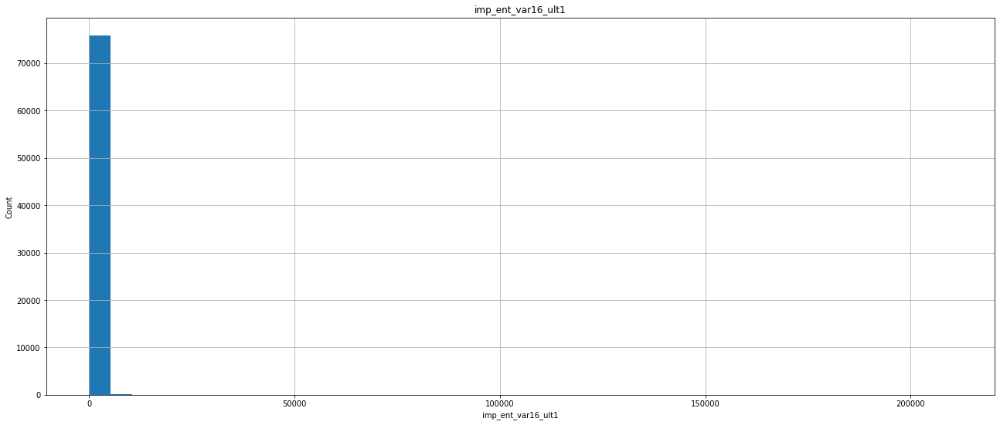

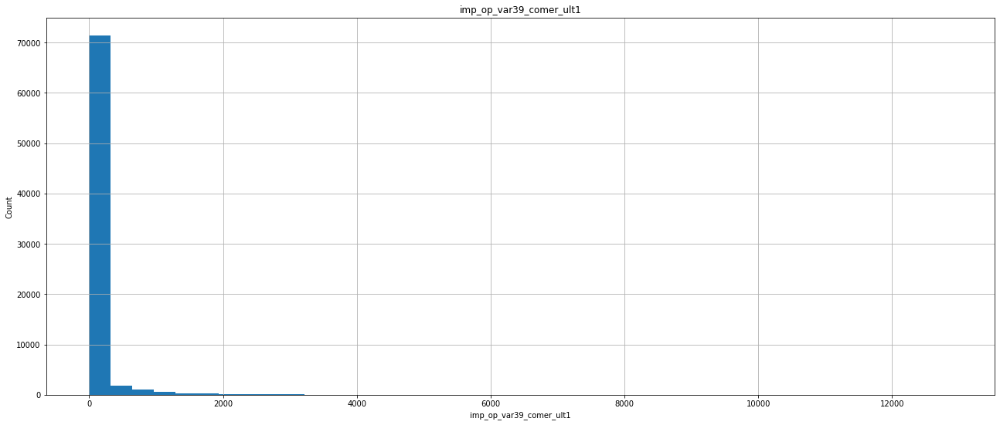

...

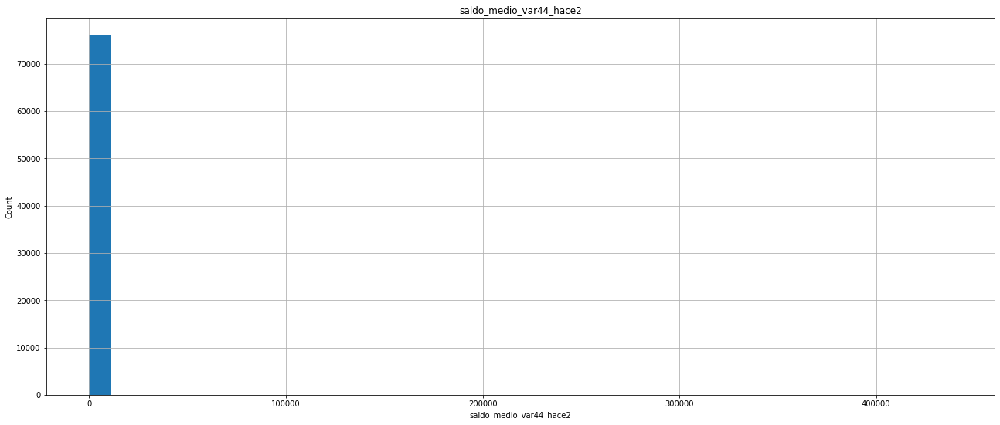

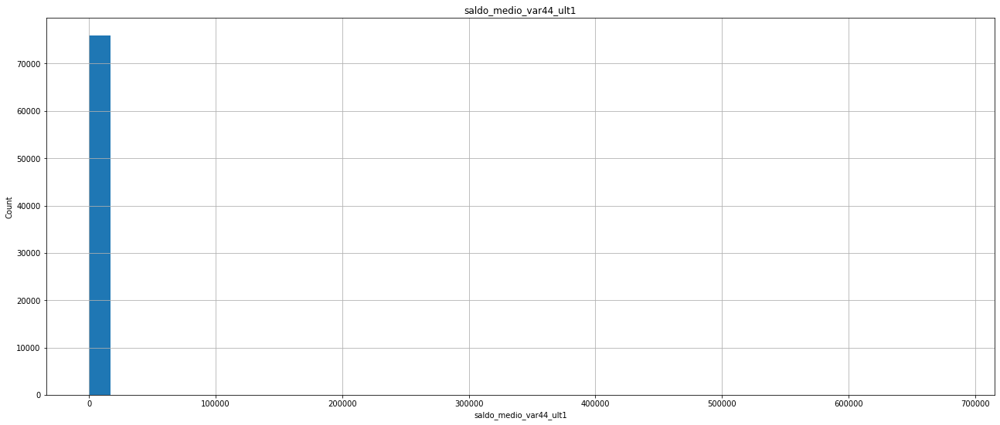

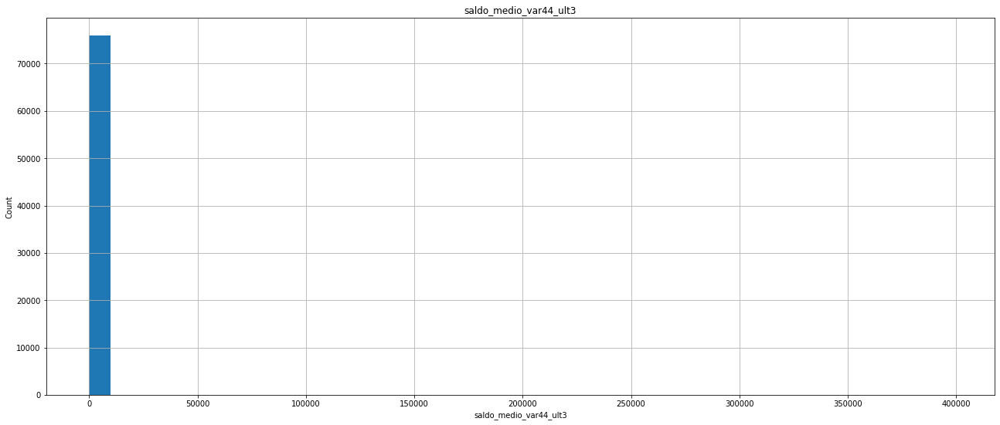

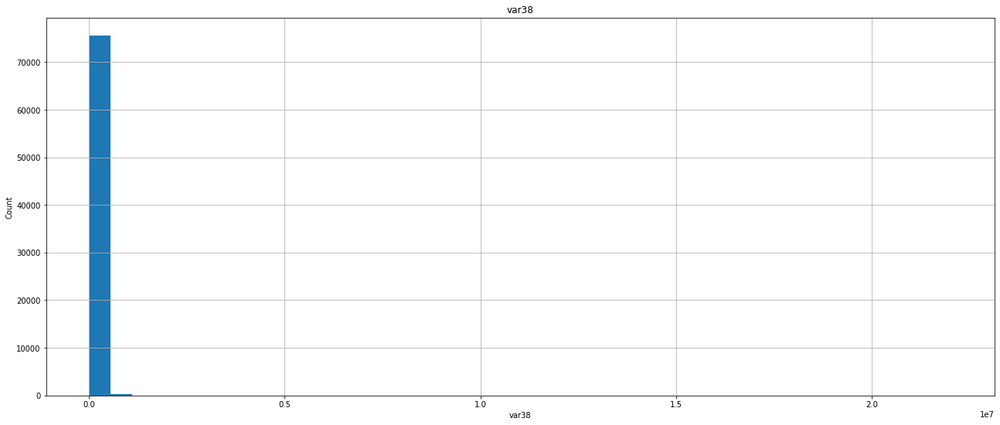

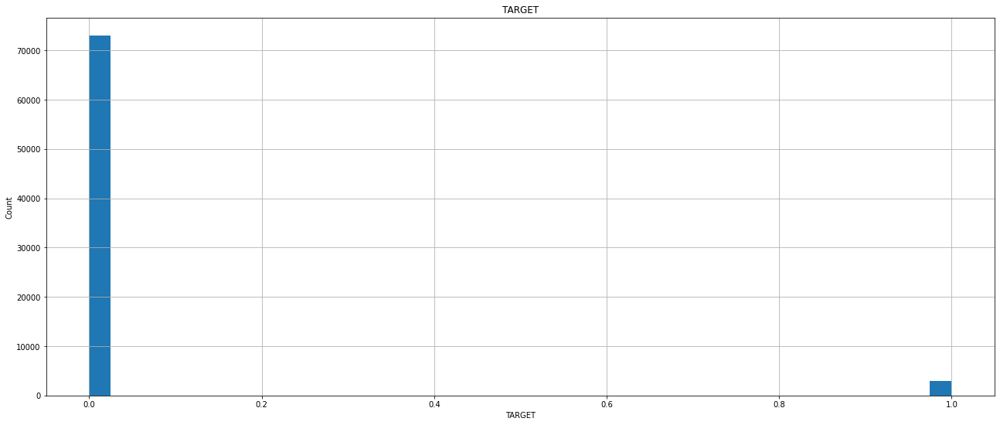

In [ ]:
for feature in train_data.columns:
    plt.figure(figsize = (22, 9))
    data=train_data.copy()
    data[feature].dropna().hist(bins = 40)
    plt.xlabel(feature)
    plt.ylabel('Count')
    plt.title(feature)
    plt.show()

From the above visualization output, We can assume var_15 feature represents **age** as it has values ranging from above 0 and below 100, most of the features have values only 0 and 1

/usr/local/lib/python3.6/dist-packages/seaborn/axisgrid.py:243: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


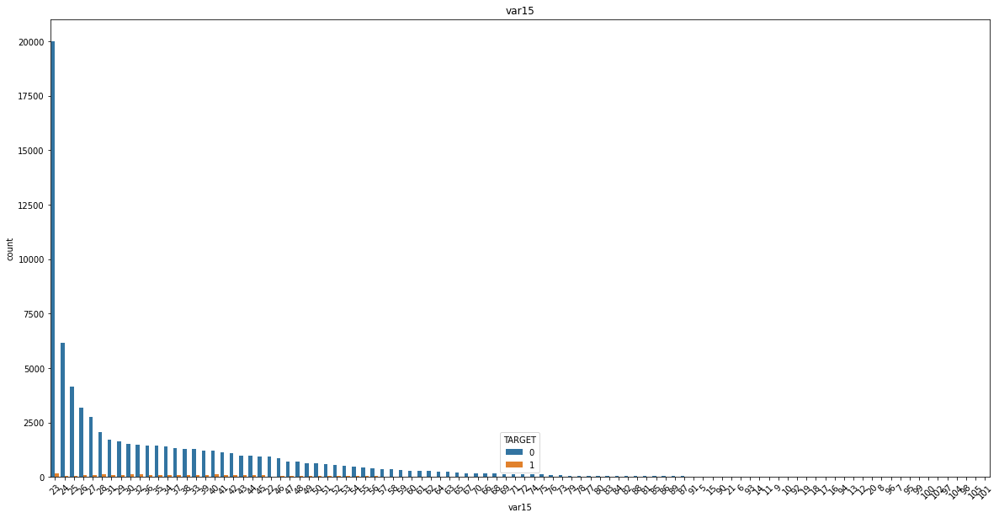

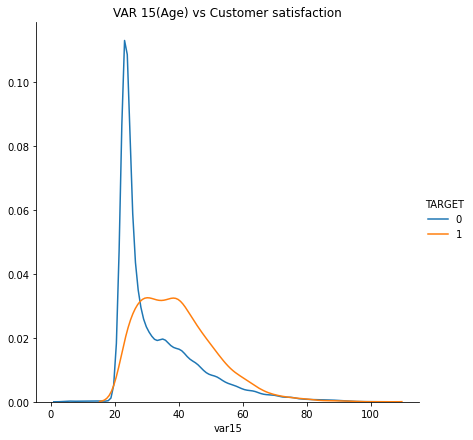

In [ ]:
plt.figure(figsize = (20, 10))
sns.countplot(x = "var15", hue = 'TARGET', data = train_data, order = train_data["var15"].value_counts().index)
plt.title("var15")
plt.xticks(rotation = 45)


sns.FacetGrid(train_data, hue="TARGET", size=6) \
   .map(sns.kdeplot, "var15") \
   .add_legend()
plt.title("VAR 15(Age) vs Customer satisfaction");


From the above visualization, we can say that customers who are aged more than 30 are not satisfied with bank services, customers who are aged between 20 to 24 are mostly satisified customers

In [ ]:
for feature in train_data.columns:
    print("Feature count of ", feature," :",train_data[feature].value_counts())

Feature count of  ID  : 2047      1
17117     1
21215     1
109280    1
111331    1
         ..
5416      1
138537    1
1322      1
3371      1
131072    1
Name: ID, Length: 76020, dtype: int64
Feature count of  var3  :  2         74165
 8           138
-999999      116
 9           110
 3           108
           ...  
 177           1
 87            1
 151           1
 215           1
 191           1
Name: var3, Length: 208, dtype: int64
Feature count of  var15  : 23     20170
24      6232
25      4217
26      3270
27      2861
       ...  
97         3
104        2
98         1
105        1
101        1
Name: var15, Length: 100, dtype: int64
Feature count of  imp_ent_var16_ult1  : 0.00        72301
300.00        221
150.00        217
600.00        172
900.00        164
            ...  
17595.15        1
84.00           1
168.75          1
139.68          1
540.66          1
Name: imp_ent_var16_ult1, Length: 596, dtype: int64
Feature count of  imp_op_var39_comer_ult1  : 0.00      6

## Feature variance analysis

In [ ]:
var_high = train_data.var().sort_values(ascending=False).index[0:25]

In [ ]:
var_high

Index(['delta_num_aport_var13_1y3', 'delta_imp_aport_var13_1y3',
       'delta_imp_compra_var44_1y3', 'delta_num_compra_var44_1y3', 'var38',
       'saldo_var30', 'saldo_var42', 'saldo_var12', 'saldo_var24',
       'saldo_medio_var12_ult1', 'ID', 'var3', 'saldo_var13',
       'saldo_medio_var12_hace2', 'saldo_medio_var12_ult3',
       'saldo_var13_corto', 'saldo_medio_var13_corto_ult1',
       'saldo_medio_var13_corto_hace2', 'saldo_medio_var13_corto_ult3',
       'imp_trans_var37_ult1', 'imp_aport_var13_hace3', 'saldo_var31',
       'saldo_var17', 'saldo_var13_largo', 'saldo_medio_var13_largo_ult1'],
      dtype='object')

In [ ]:
from sklearn.feature_selection import VarianceThreshold
def features_wo_low_variance(data):
  threshold_n=0.98  
  sel = VarianceThreshold(threshold=(threshold_n* (1 - threshold_n) ))
  sel_var=sel.fit_transform(data)
  return data.columns[sel.get_support(indices=True)] 

In [ ]:
 train_data[features_wo_low_variance(train_data)]

,ID,var3,var15,imp_ent_var16_ult1,imp_op_var39_comer_ult1,imp_op_var39_comer_ult3,imp_op_var40_comer_ult1,imp_op_var40_comer_ult3,imp_op_var40_efect_ult1,imp_op_var40_efect_ult3,imp_op_var40_ult1,imp_op_var41_comer_ult1,imp_op_var41_comer_ult3,imp_op_var41_efect_ult1,imp_op_var41_efect_ult3,imp_op_var41_ult1,imp_op_var39_efect_ult1,imp_op_var39_efect_ult3,imp_op_var39_ult1,imp_sal_var16_ult1,ind_var5_0,ind_var5,ind_var8_0,ind_var8,ind_var12_0,ind_var12,ind_var13_0,ind_var13_corto_0,ind_var13_corto,ind_var13,ind_var14_0,ind_var24_0,ind_var24,ind_var25_cte,ind_var26_0,ind_var26_cte,ind_var25_0,ind_var30,ind_var37_cte,ind_var37_0,...,saldo_medio_var5_hace2,saldo_medio_var5_hace3,saldo_medio_var5_ult1,saldo_medio_var5_ult3,saldo_medio_var8_hace2,saldo_medio_var8_hace3,saldo_medio_var8_ult1,saldo_medio_var8_ult3,saldo_medio_var12_hace2,saldo_medio_var12_hace3,saldo_medio_var12_ult1,saldo_medio_var12_ult3,saldo_medio_var13_corto_hace2,saldo_medio_var13_corto_hace3,saldo_medio_var13_corto_ult1,saldo_medio_var13_corto_ult3,saldo_medio_var13_largo_hace2,saldo_medio_var13_largo_hace3,saldo_medio_var13_largo_ult1,saldo_medio_var13_largo_ult3,saldo_medio_var13_medio_hace2,saldo_medio_var13_medio_ult3,saldo_medio_var17_hace2,saldo_medio_var17_hace3,saldo_medio_var17_ult1,saldo_medio_var17_ult3,saldo_medio_var29_hace2,saldo_medio_var29_hace3,saldo_medio_var29_ult1,saldo_medio_var29_ult3,saldo_medio_var33_hace2,saldo_medio_var33_hace3,saldo_medio_var33_ult1,saldo_medio_var33_ult3,saldo_medio_var44_hace2,saldo_medio_var44_hace3,saldo_medio_var44_ult1,saldo_medio_var44_ult3,var38,TARGET
0,1,2,23,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,39205.170000,0
1,3,2,34,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,1,1,1,0,0,0,0,0,0,0,1,0,0,...,0.00,88.89,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.0,0.00,0.00,300.0,122.22,300.0,240.75,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,49278.030000,0
2,4,2,23,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,...,3.00,0.18,3.00,2.07,0.0,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,67333.770000,0
3,8,2,37,0.0,195.0,195.0,0.0,0.0,0.0,0.0,0.0,195.0,195.0,0.0,0.0,195.0,0.0,0.0,195.0,0.0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,...,186.09,0.00,91.56,138.84,0.0,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,64007.970000,0
4,10,2,39,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,1,1,0,0,0,0,0,1,1,0,0,0,0,1,0,0,...,3.00,0.30,40501.08,13501.47,0.0,0.0,0.0,0.0,0.00,0.0,85501.89,85501.89,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,117310.979016,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
76015,151829,2,48,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,60926.490000,0
76016,151830,2,39,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,1,1,0,0,0,0,0,1,1,0,0,0,0,1,0,0,...,130.65,0.00,0.00,0.00,0.0,0.0,0.0,0.0,15498.42,0.0,48175.62,31837.02,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0

In [ ]:
train_data_ac[features_wo_low_variance(train_data_ac)]

,ID,var3,var15,imp_ent_var16_ult1,imp_op_var39_comer_ult1,imp_op_var39_comer_ult3,imp_op_var40_comer_ult1,imp_op_var40_comer_ult3,imp_op_var40_ult1,imp_op_var41_comer_ult1,imp_op_var41_comer_ult3,imp_op_var41_efect_ult1,imp_op_var41_efect_ult3,imp_op_var41_ult1,imp_op_var39_efect_ult1,imp_op_var39_efect_ult3,imp_op_var39_ult1,imp_sal_var16_ult1,ind_var5_0,ind_var5,ind_var8_0,ind_var8,ind_var12_0,ind_var12,ind_var13_0,ind_var13_corto_0,ind_var13_corto,ind_var13,ind_var14_0,ind_var24_0,ind_var24,ind_var25_cte,ind_var26_0,ind_var26_cte,ind_var25_0,ind_var30,ind_var37_cte,ind_var37_0,ind_var39_0,ind_var41_0,...,num_op_var41_efect_ult1,num_op_var41_efect_ult3,num_op_var39_efect_ult1,num_op_var39_efect_ult3,num_sal_var16_ult1,num_var43_emit_ult1,num_var43_recib_ult1,num_trasp_var11_ult1,num_var45_hace2,num_var45_hace3,num_var45_ult1,num_var45_ult3,saldo_medio_var5_hace2,saldo_medio_var5_hace3,saldo_medio_var5_ult1,saldo_medio_var5_ult3,saldo_medio_var8_hace2,saldo_medio_var8_hace3,saldo_medio_var8_ult1,saldo_medio_var8_ult3,saldo_medio_var12_hace2,saldo_medio_var12_hace3,saldo_medio_var12_ult1,saldo_medio_var12_ult3,saldo_medio_var13_corto_hace2,saldo_medio_var13_corto_hace3,saldo_medio_var13_corto_ult1,saldo_medio_var13_corto_ult3,saldo_medio_var13_largo_hace2,saldo_medio_var13_largo_hace3,saldo_medio_var13_largo_ult1,saldo_medio_var13_largo_ult3,saldo_medio_var17_hace2,saldo_medio_var17_ult1,saldo_medio_var17_ult3,saldo_medio_var44_hace2,saldo_medio_var44_ult1,saldo_medio_var44_ult3,var38,TARGET
0,1,2,23,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,...,0,0,0,0,0,0,0,0,0,0,0,0,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,39205.170000,0
1,3,2,34,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,1,1,1,0,0,0,0,0,0,0,1,0,0,1,1,...,0,0,0,0,0,0,0,0,0,0,0,0,0.00,88.89,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.0,0.00,0.00,300.0,122.22,300.0,240.75,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,49278.030000,0
2,4,2,23,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,1,...,0,0,0,0,0,0,0,0,0,0,0,0,3.00,0.18,3.00,2.07,0.0,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,67333.770000,0
3,8,2,37,0.0,195.0,195.0,0.0,0.0,0.0,195.0,195.0,0.0,0.0,195.0,0.0,0.0,195.0,0.0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,...,0,0,0,0,0,0,0,0,27,3,18,48,186.09,0.00,91.56,138.84,0.0,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,64007.970000,0
4,10,2,39,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,1,1,0,0,0,0,0,1,1,0,0,0,0,1,0,0,1,1,...,0,0,0,0,0,3,6,3,0,0,0,0,3.00,0.30,40501.08,13501.47,0.0,0.0,0.0,0.0,0.00,0.0,85501.89,85501.89,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,117310.979016,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
76015,151829,2,48,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,...,0,0,0,0,0,0,0,0,0,0,0,0,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,60926.490000,0
76016,151830,2,39,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,1,1,0,0,0,0,0,1,1,0,0,0,0,1,0,0,1,1,...,0,0,0,0,0,0,0,0,36,3,9,48,130.65,0.00,0.00,0.00,0.0,0.0,0.0,0.0,15498.42,0.0,48175.62,31837.02,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,118634.520000,0
76017,151835,2,23,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,1,...,0,0,0,0,0,0,0,0,0,0,0,0,3.00,0.00,3.00,3.00,0.0,0.0,0.0,0.0,0.00

In [ ]:
(train_data.var() < 0.02).value_counts()

False    190
True      25
dtype: int64

We can remove features which are having variance 0.02 as they might have no impact on target value

In [ ]:
var_low = train_data.var().sort_values(ascending=True).index[0:25]

In [ ]:
var_low

Index(['ind_var32_0', 'ind_var32_cte', 'ind_var17', 'ind_var44', 'ind_var17_0',
       'ind_var44_0', 'ind_var7_recib_ult1', 'ind_var20', 'ind_var20_0',
       'ind_var31', 'ind_var40', 'ind_var1', 'ind_var19', 'ind_var31_0',
       'ind_var30_0', 'ind_var14', 'num_meses_var17_ult3',
       'num_meses_var44_ult3', 'ind_var13_largo', 'ind_var13_largo_0',
       'ind_var40_0', 'ind_var1_0', 'num_var44', 'num_var44_0', 'num_var32_0'],
      dtype='object')

In [ ]:
train_data.corr()

,ID,var3,var15,imp_ent_var16_ult1,imp_op_var39_comer_ult1,imp_op_var39_comer_ult3,imp_op_var40_comer_ult1,imp_op_var40_comer_ult3,imp_op_var40_ult1,imp_op_var41_comer_ult1,imp_op_var41_comer_ult3,imp_op_var41_efect_ult1,imp_op_var41_efect_ult3,imp_op_var41_ult1,imp_op_var39_efect_ult1,imp_op_var39_efect_ult3,imp_op_var39_ult1,imp_sal_var16_ult1,ind_var1_0,ind_var1,ind_var5_0,ind_var5,ind_var8_0,ind_var8,ind_var12_0,ind_var12,ind_var13_0,ind_var13_corto_0,ind_var13_corto,ind_var13_largo_0,ind_var13_largo,ind_var13,ind_var14_0,ind_var14,ind_var17_0,ind_var17,ind_var19,ind_var20_0,ind_var20,ind_var24_0,...,num_op_var41_efect_ult1,num_op_var41_efect_ult3,num_op_var39_efect_ult1,num_op_var39_efect_ult3,num_sal_var16_ult1,num_var43_emit_ult1,num_var43_recib_ult1,num_trasp_var11_ult1,num_var45_hace2,num_var45_hace3,num_var45_ult1,num_var45_ult3,saldo_medio_var5_hace2,saldo_medio_var5_hace3,saldo_medio_var5_ult1,saldo_medio_var5_ult3,saldo_medio_var8_hace2,saldo_medio_var8_hace3,saldo_medio_var8_ult1,saldo_medio_var8_ult3,saldo_medio_var12_hace2,saldo_medio_var12_hace3,saldo_medio_var12_ult1,saldo_medio_var12_ult3,saldo_medio_var13_corto_hace2,saldo_medio_var13_corto_hace3,saldo_medio_var13_corto_ult1,saldo_medio_var13_corto_ult3,saldo_medio_var13_largo_hace2,saldo_medio_var13_largo_hace3,saldo_medio_var13_largo_ult1,saldo_medio_var13_largo_ult3,saldo_medio_var17_hace2,saldo_medio_var17_ult1,saldo_medio_var17_ult3,saldo_medio_var44_hace2,saldo_medio_var44_ult1,saldo_medio_var44_ult3,var38,TARGET
ID,1.000000,-0.001025,-0.002135,-0.003111,-0.001436,-0.004131,-0.007277,-0.006302,-0.008326,0.000596,-0.002515,-0.001869,-0.002927,-0.000303,-0.002239,-0.003173,-0.001409,-0.006793,-0.001022,-0.007269,0.002002,0.003493,-0.003050,-0.003880,-0.002967,-0.006262,0.000466,0.000439,-0.000157,0.000632,0.000228,-0.000055,0.001872,0.000518,0.002947,0.000663,-0.001234,0.003170,0.002177,-0.005585,...,-0.001168,-0.003291,-0.001498,-0.003533,-0.002509,0.002359,0.001890,0.001339,-0.001458,0.000559,-0.001574,-0.001141,-0.000931,-0.006771,-0.002364,-0.001904,0.000839,-0.006679,-0.001095,-0.001325,-0.006825,-0.006099,-0.005683,-0.005480,-0.002670,0.000061,-0.001763,-0.001883,0.003373,0.000935,0.002975,0.003911,-0.003024,-0.002258,-0.002629,-0.003772,-0.000856,0.000297,-0.005687,0.003148
var3,-0.001025,1.000000,-0.004452,0.001868,0.005989,0.006817,0.001518,0.001690,0.001311,0.005916,0.006764,0.001676,0.002459,0.003993,0.001695,0.002474,0.004084,0.000460,0.001069,0.002424,-0.008234,0.038505,0.007205,0.006711,0.010520,0.008533,0.009187,0.008278,0.008129,0.003986,0.003952,0.009058,0.006084,0.002857,0.001676,0.001503,0.002537,0.002358,0.002032,0.008223,...,0.005935,0.006848,0.005937,0.006849,0.001244,-0.002181,0.006400,0.001452,0.005626,0.006187,0.008693,0.008144,0.004366,0.003332,0.003423,0.004099,0.001541,0.000716,0.002211,0.002225,0.004144,0.002590,0.004831,0.004851,0.005397,0.003027,0.005948,0.005896,0.002324,0.001381,0.002353,0.002381,0.000234,0.000347,0.000331,0.000617,0.000738,0.000778,0.000071,0.004475
var15,-0.002135,-0.004452,1.000000,0.043722,0.094762,0.101177,0.042754,0.048512,0.035884,0.088145,0.093354,0.085281,0.074686,0.104643,0.085215,0.074783,0.107229,0.013525,0.106042,0.054182,-0.112228,-0.098936,0.111776,0.101437,0.262891,0.219815,0.300081,0.243894,0.241273,0.186658,0.186964,0.298543,0.153101,0.058124,0.062210,0.053141,0.065198,-0.093919,-0.082063,0.251312,...,0.068364,0.069907,0.068509,0.070052,0.029061,0.113005,0.116925,0.076026,0.205384,0.230265,0.154831,0.228395,0.181542,0.131156,0.132090,0.167988,0.042061,0.018036,0.054037,0.057478,0.163108,0.109747,0.185961,0.186720,0.188661,0.106964,0.210294,0.207802,0.122017,0.072549,0.121317,0.122041,0.015796,0.020383,0.019886,0.029180,0.032833,0.033597,0.006497,0.101322
imp_ent_var16_ult1,-0.003111,0.001868,0.043722,1.000000,0.041221,0.034879,0.009896,0.009377,0.011502,0.040879,0.034387,0.020975,0.015883,0.035100,0.020869,0.015921,0.035896,-0.000053,0.017957,0.014019,-0.002517,0.017098,0.004617,0.006285

From the above result, we can say that for most of the features covraiance is very low , we can fix a threshold and remove the features which are having higher covariance then the threshold. We know that if covariance is negative, it means if one feature increases other decrease and vice versa, if covariance is positive, both will beahve in similar way


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


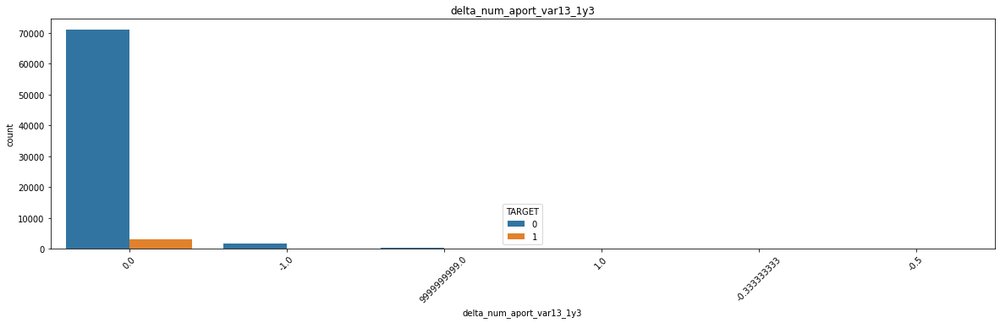

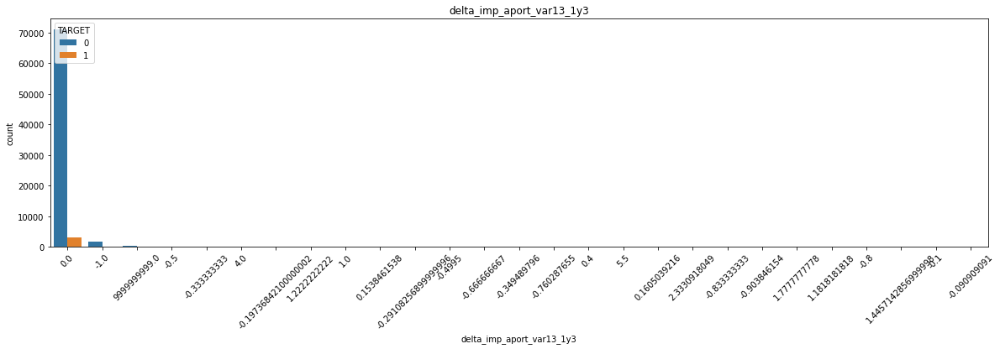

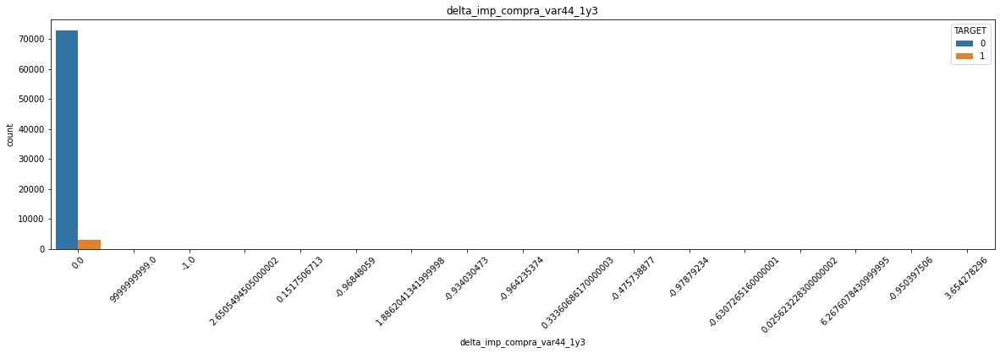

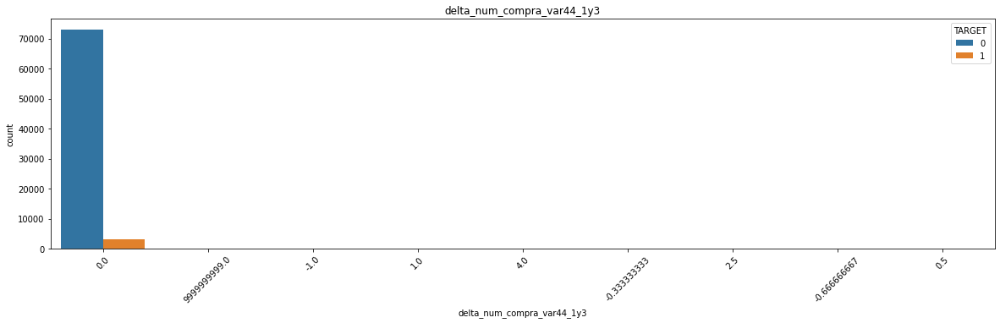

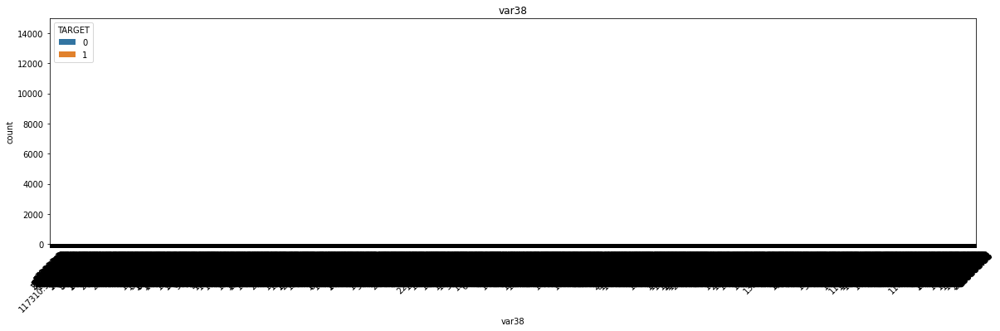

...

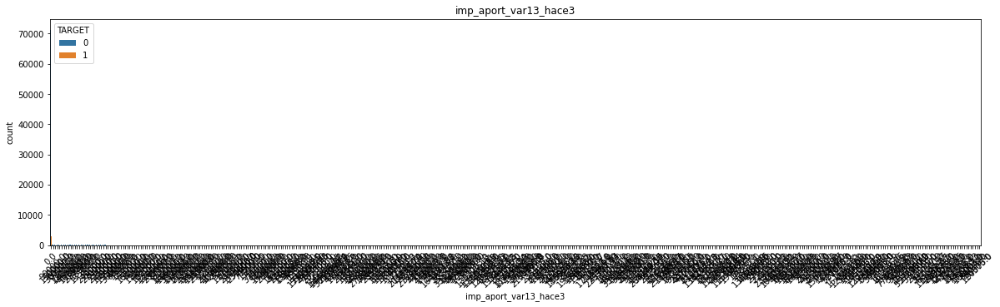

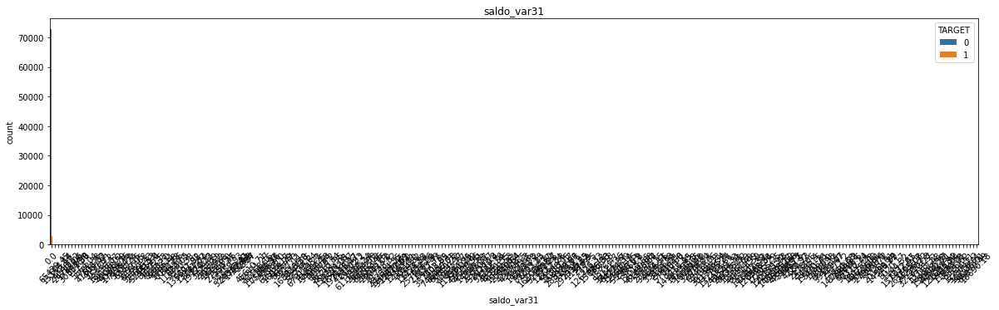

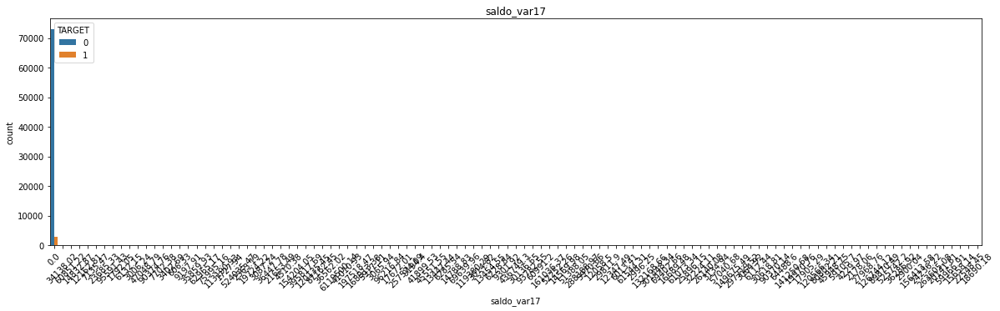

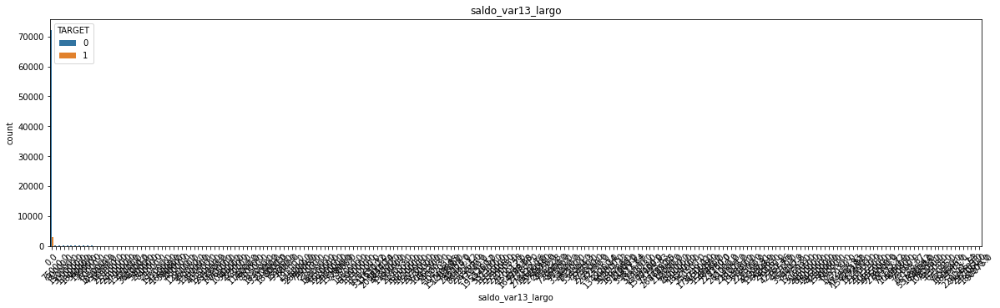

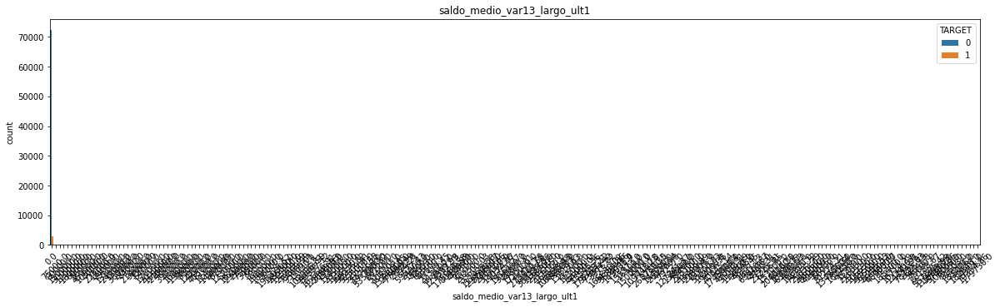

In [ ]:
# Invetigate continuous feature columns behaviour against target varaible
for feature in train_data[var_high]:
  plt.figure(figsize = (20, 5))
  sns.countplot(x = feature, hue = 'TARGET', data = train_data, order = train_data[feature].value_counts().index)
  plt.title(feature)
  plt.xticks(rotation = 45)

After observing above visualization, we can say that even high variance features also have no impact on target variable, We need to check with combination of any other feature this might have impact on target variable or not and take action based on the result

In [ ]:
train_data[var_high]

,delta_num_aport_var13_1y3,delta_imp_aport_var13_1y3,delta_imp_compra_var44_1y3,delta_num_compra_var44_1y3,var38,saldo_var30,saldo_var42,saldo_var12,saldo_var24,saldo_medio_var12_ult1,ID,var3,saldo_var13,saldo_medio_var12_hace2,saldo_medio_var12_ult3,saldo_var13_corto,saldo_medio_var13_corto_ult1,saldo_medio_var13_corto_hace2,saldo_medio_var13_corto_ult3,imp_trans_var37_ult1,imp_aport_var13_hace3,saldo_var31,saldo_var17,saldo_var13_largo,saldo_medio_var13_largo_ult1
0,0.0,0.0,0.0,0.0,39205.170000,0.00,0.00,0.00,0.00,0.00,1,2,0.0,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0
1,-1.0,-1.0,0.0,0.0,49278.030000,300.00,0.00,0.00,0.00,0.00,3,2,300.0,0.00,0.00,300.0,300.0,300.0,240.75,0.0,300.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,67333.770000,3.00,3.00,0.00,0.00,0.00,4,2,0.0,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,64007.970000,70.62,70.62,0.00,0.00,0.00,8,2,0.0,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,117310.979016,135003.00,135003.00,135003.00,135003.00,85501.89,10,2,0.0,0.00,85501.89,0.0,0.0,0.0,0.00,270003.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
76015,0.0,0.0,0.0,0.0,60926.490000,0.00,0.00,0.00,0.00,0.00,151829,2,0.0,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0
76016,0.0,0.0,0.0,0.0,118634.520000,48191.22,48191.22,48191.22,48191.22,48175.62,151830,2,0.0,15498.42,31837.02,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0
76017,0.0,0.0,0.0,0.0,74028.150000,3.00,3.00,0.00,0.00,0.00,151835,2,0.0,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0
76018,0.0,0.0,0.0,0.0,84278.160000,3.00,3.00,0.00,0.00,0.00,151836,2,0.0,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0


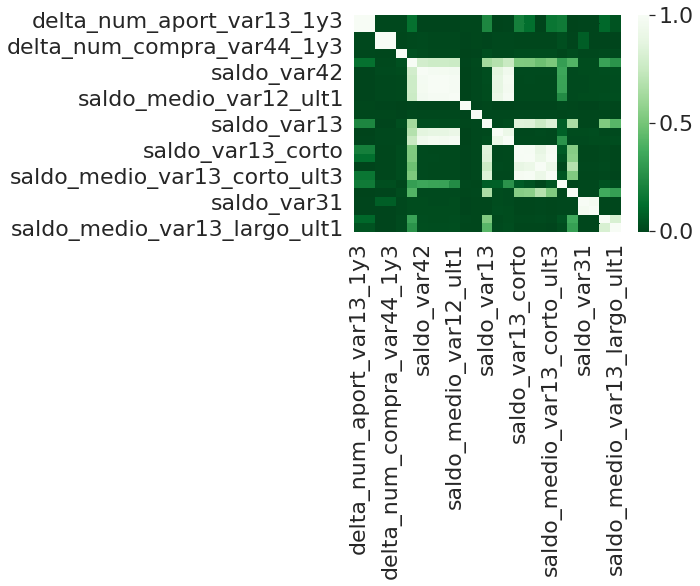

In [ ]:
train_data[var_high]
sns.heatmap(train_data[var_high].corr(),cmap='Greens_r')

In [ ]:
train_data

,ID,var3,var15,imp_ent_var16_ult1,imp_op_var39_comer_ult1,imp_op_var39_comer_ult3,imp_op_var40_comer_ult1,imp_op_var40_comer_ult3,imp_op_var40_ult1,imp_op_var41_comer_ult1,imp_op_var41_comer_ult3,imp_op_var41_efect_ult1,imp_op_var41_efect_ult3,imp_op_var41_ult1,imp_op_var39_efect_ult1,imp_op_var39_efect_ult3,imp_op_var39_ult1,imp_sal_var16_ult1,ind_var1_0,ind_var1,ind_var5_0,ind_var5,ind_var8_0,ind_var8,ind_var12_0,ind_var12,ind_var13_0,ind_var13_corto_0,ind_var13_corto,ind_var13_largo_0,ind_var13_largo,ind_var13,ind_var14_0,ind_var14,ind_var17_0,ind_var17,ind_var19,ind_var20_0,ind_var20,ind_var24_0,...,num_op_var41_efect_ult1,num_op_var41_efect_ult3,num_op_var39_efect_ult1,num_op_var39_efect_ult3,num_sal_var16_ult1,num_var43_emit_ult1,num_var43_recib_ult1,num_trasp_var11_ult1,num_var45_hace2,num_var45_hace3,num_var45_ult1,num_var45_ult3,saldo_medio_var5_hace2,saldo_medio_var5_hace3,saldo_medio_var5_ult1,saldo_medio_var5_ult3,saldo_medio_var8_hace2,saldo_medio_var8_hace3,saldo_medio_var8_ult1,saldo_medio_var8_ult3,saldo_medio_var12_hace2,saldo_medio_var12_hace3,saldo_medio_var12_ult1,saldo_medio_var12_ult3,saldo_medio_var13_corto_hace2,saldo_medio_var13_corto_hace3,saldo_medio_var13_corto_ult1,saldo_medio_var13_corto_ult3,saldo_medio_var13_largo_hace2,saldo_medio_var13_largo_hace3,saldo_medio_var13_largo_ult1,saldo_medio_var13_largo_ult3,saldo_medio_var17_hace2,saldo_medio_var17_ult1,saldo_medio_var17_ult3,saldo_medio_var44_hace2,saldo_medio_var44_ult1,saldo_medio_var44_ult3,var38,TARGET
0,1,2,23,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,39205.170000,0
1,3,2,34,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,1,0,0,0,0,0,1,1,1,0,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0.00,88.89,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.0,0.00,0.00,300.0,122.22,300.0,240.75,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,49278.030000,0
2,4,2,23,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,3.00,0.18,3.00,2.07,0.0,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,67333.770000,0
3,8,2,37,0.0,195.0,195.0,0.0,0.0,0.0,195.0,195.0,0.0,0.0,195.0,0.0,0.0,195.0,0.0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,27,3,18,48,186.09,0.00,91.56,138.84,0.0,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,64007.970000,0
4,10,2,39,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,3,6,3,0,0,0,0,3.00,0.30,40501.08,13501.47,0.0,0.0,0.0,0.0,0.00,0.0,85501.89,85501.89,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,117310.979016,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
76015,151829,2,48,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,60926.490000,0
76016,151830,2,39,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,36,3,9,48,130.65,0.00,0.00,0.00,0.0,0.0,0.0,0.0,15498.42,0.0,48175.62,31837.02,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,118634.520000,0
76017,151835,2,23,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,3.00,0.00,3.00,3.00,0.0,0.0,0.0,0.0,0.00,0.0

From the above data, We may assume **var38** is value of the **realtionship of customer with the bank.**, **var3** may be the **nationality or country** of the customer as most of them have same value

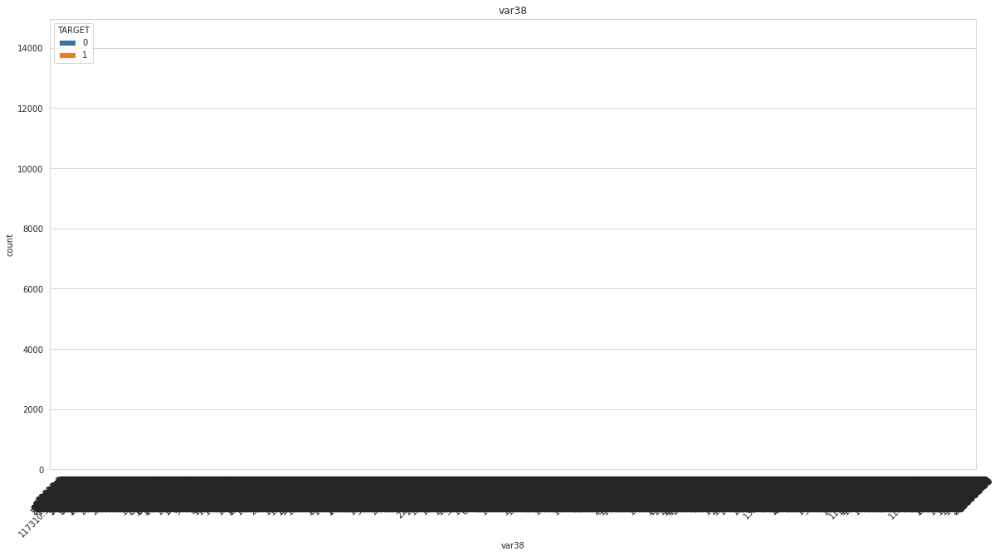

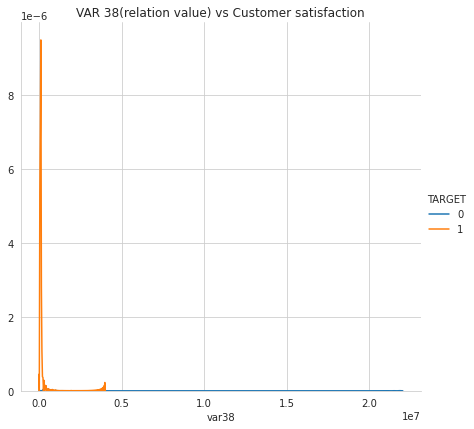

In [ ]:
plt.figure(figsize = (20, 10))
sns.countplot(x = "var38", hue = 'TARGET', data = train_data, order = train_data["var38"].value_counts().index)
plt.title("var38")
plt.xticks(rotation = 45)


sns.FacetGrid(train_data, hue="TARGET", height=6) \
   .map(sns.kdeplot, "var38") \
   .add_legend()
plt.title("VAR 38(relation value) vs Customer satisfaction");

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


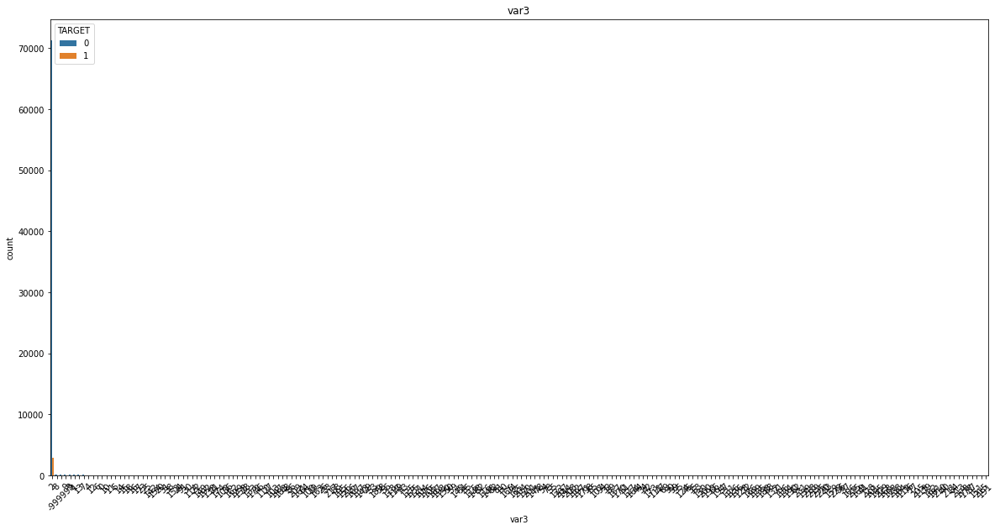

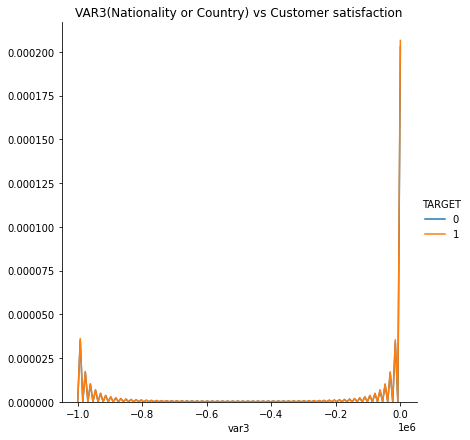

In [ ]:
import seaborn as sns
plt.figure(figsize = (20, 10))
sns.countplot(x = "var3", hue = 'TARGET', data = train_data, order = train_data["var3"].value_counts().index)
plt.title("var3")
plt.xticks(rotation = 45)


sns.FacetGrid(train_data, hue="TARGET", height=6) \
   .map(sns.kdeplot, "var3") \
   .add_legend()
plt.title("VAR3(Nationality or Country) vs Customer satisfaction");

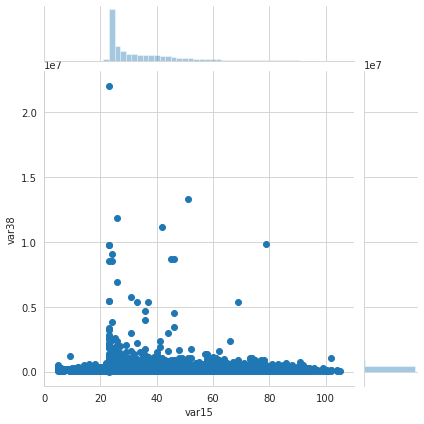

In [ ]:
# trying to get the trend between age and realtionship value with bank
sns.set_style('whitegrid')
sns.jointplot(x="var15", y="var38", data=train_data)

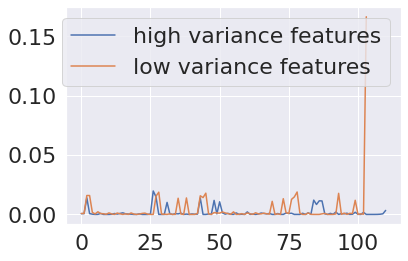

In [ ]:
from sklearn.feature_selection import mutual_info_classif, VarianceThreshold
mi = mutual_info_classif(train_data.values, train_data["TARGET"], discrete_features=False)

feature_stds = train_data.std().values

plt.plot(mi[feature_stds>1.5], label='high variance features')
plt.plot(mi[feature_stds<1.5], label='low variance features')
plt.legend()

##OUTLIER DETECTION

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

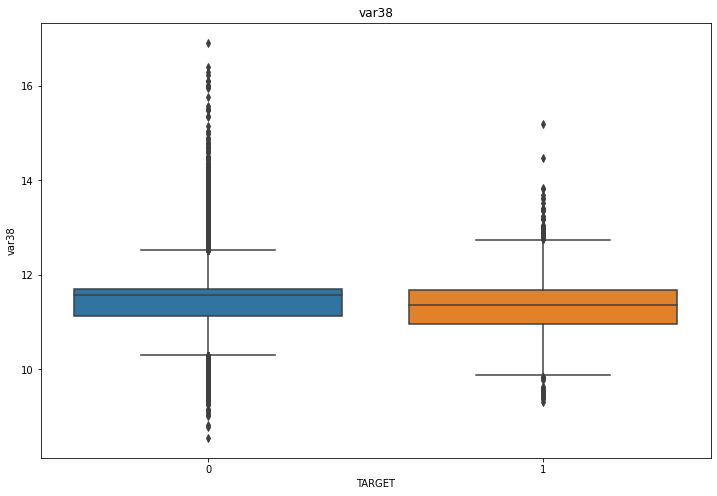

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

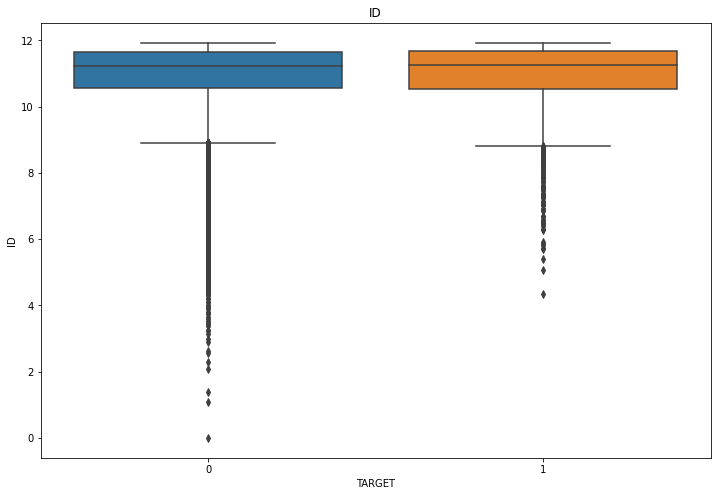

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

In [ ]:
for feature in train_data[var_high]:
  plt.figure(figsize = (12, 8))
  data = train_data.copy()
  if 0 in data[feature].unique():
    pass
  else:
    data[feature]=np.log(data[feature])
    sns.boxplot(y = feature, x = 'TARGET', data = data)
    plt.ylabel(feature)
    plt.title(feature)
    plt.yticks()
    plt.show()

From the above outlier output we can say that from top 25 variance features except 2 remaining all have values 0 in the columns

In [ ]:
for feature in train_data[train_data.var().sort_values().index[0:]]:
  plt.figure(figsize = (12, 8))
  data = train_data.copy()
  if 0 in data[feature].unique():
    pass
  else:
    data[feature]=np.log(data[feature])
    sns.boxplot(y = feature, x = 'TARGET', data = data)
    plt.ylabel(feature)
    plt.title(feature)
    plt.yticks()
    plt.show()

From the above outlier output we can say that only 3 features have values , remaining all have features have values 0 in them, var38,ID have more outliers except var15 which has less outliers 

## Label encoding

In [ ]:
from sklearn.preprocessing import LabelEncoder


In [ ]:
le_inc = LabelEncoder()
le_inc.fit(train_data['TARGET'])
train_dummy=train_data.copy()
train_dummy['Encoded_Income'] = le_inc.transform(train_data['TARGET'])

In [ ]:
le_inc.classes_

array([0, 1])

In [ ]:
train_dummy.head(10)

,ID,var3,var15,imp_ent_var16_ult1,imp_op_var39_comer_ult1,imp_op_var39_comer_ult3,imp_op_var40_comer_ult1,imp_op_var40_comer_ult3,imp_op_var40_ult1,imp_op_var41_comer_ult1,imp_op_var41_comer_ult3,imp_op_var41_efect_ult1,imp_op_var41_efect_ult3,imp_op_var41_ult1,imp_op_var39_efect_ult1,imp_op_var39_efect_ult3,imp_op_var39_ult1,imp_sal_var16_ult1,ind_var1_0,ind_var1,ind_var5_0,ind_var5,ind_var8_0,ind_var8,ind_var12_0,ind_var12,ind_var13_0,ind_var13_corto_0,ind_var13_corto,ind_var13_largo_0,ind_var13_largo,ind_var13,ind_var14_0,ind_var14,ind_var17_0,ind_var17,ind_var19,ind_var20_0,ind_var20,ind_var24_0,...,num_op_var41_efect_ult3,num_op_var39_efect_ult1,num_op_var39_efect_ult3,num_sal_var16_ult1,num_var43_emit_ult1,num_var43_recib_ult1,num_trasp_var11_ult1,num_var45_hace2,num_var45_hace3,num_var45_ult1,num_var45_ult3,saldo_medio_var5_hace2,saldo_medio_var5_hace3,saldo_medio_var5_ult1,saldo_medio_var5_ult3,saldo_medio_var8_hace2,saldo_medio_var8_hace3,saldo_medio_var8_ult1,saldo_medio_var8_ult3,saldo_medio_var12_hace2,saldo_medio_var12_hace3,saldo_medio_var12_ult1,saldo_medio_var12_ult3,saldo_medio_var13_corto_hace2,saldo_medio_var13_corto_hace3,saldo_medio_var13_corto_ult1,saldo_medio_var13_corto_ult3,saldo_medio_var13_largo_hace2,saldo_medio_var13_largo_hace3,saldo_medio_var13_largo_ult1,saldo_medio_var13_largo_ult3,saldo_medio_var17_hace2,saldo_medio_var17_ult1,saldo_medio_var17_ult3,saldo_medio_var44_hace2,saldo_medio_var44_ult1,saldo_medio_var44_ult3,var38,TARGET,Encoded_Income
0,1,2,23,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,39205.170000,0,0
1,3,2,34,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,1,0,0,0,0,0,1,1,1,0,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0.00,88.89,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,300.0,122.22,300.0,240.75,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,49278.030000,0,0
2,4,2,23,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,3.00,0.18,3.00,2.07,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,67333.770000,0,0
3,8,2,37,0.0,195.0,195.0,0.0,0.0,0.0,195.0,195.0,0.0,0.0,195.0,0.0,0.0,195.0,0.0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,27,3,18,48,186.09,0.00,91.56,138.84,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,64007.970000,0,0
4,10,2,39,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,3,6,3,0,0,0,0,3.00,0.30,40501.08,13501.47,0.0,0.0,0.0,0.0,0.0,0.0,85501.89,85501.89,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,117310.979016,0,0
5,13,2,23,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,87975.750000,0,0
6,14,2,27,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,3.00,0.42,3.00,2.13,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,94956.660000,0,0
7,18,2,26,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,2.88,0.00,3.00,2.94,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,251638.950000,0,0
8,20,2,45,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,101962.020000,0,0
9,23,2,25,0.0,0.0,0.0,0.0,0.0,0

From the above data as we don;t have any categorical features(strings) we don;t need to do variable encoding

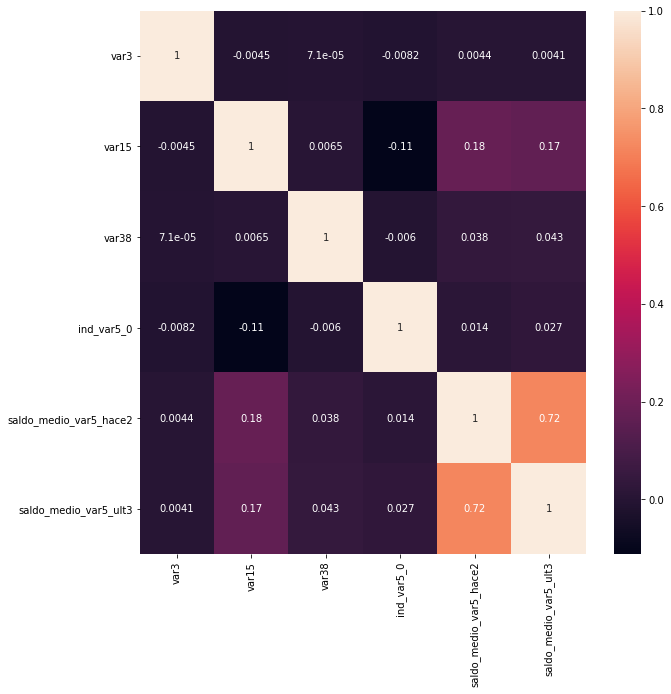

In [ ]:
plt.figure(figsize = (10, 10))
corr_mat = train_dummy[["var3","var15","var38","ind_var5_0","saldo_medio_var5_hace2","saldo_medio_var5_ult3"]].corr()
sns.heatmap(corr_mat, xticklabels = corr_mat.columns, yticklabels = corr_mat.columns, annot=True)

In [ ]:
train_wo_zeros=train_dummy.loc[:, (train_dummy != 0.0).any(axis=0)]

In [ ]:
train_wo_zeros.shape

(76020, 216)

When i try to remove columns having zeros, one columns also not removed, it means it has values but majority of the values are zero

In [ ]:
train_zero=train_dummy[(train_dummy==0.0).sum(axis=1)/len(train_dummy.columns) <= 0.75]

In [ ]:
train_zero.shape

(11734, 216)

## Visualization

In [ ]:
import plotly.express as px
from matplotlib import rcParams
import plotly.figure_factory as ff
from plotly import tools
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

In [ ]:
fig = px.density_contour(data_frame=train_data,x = "TARGET",y="var38", color="TARGET",range_y=(0,300000))
fig.show()

From the above plot, we can determine that customers having relationship values greater than **1.75m are mostly satisfied** and less than are having **most disatisfied** customers

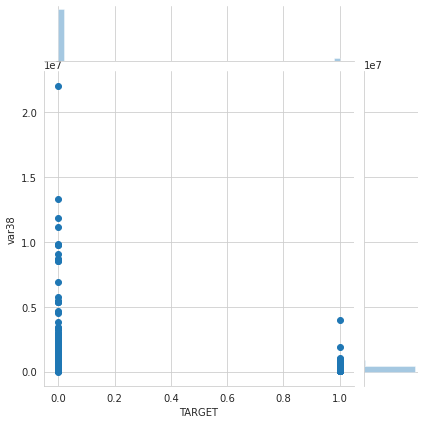

In [ ]:
sns.set_style('whitegrid')
sns.jointplot(x="TARGET", y="var38", data=train_data)

In [ ]:
sns.pairplot(train_data[['var15','var38','TARGET']])

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


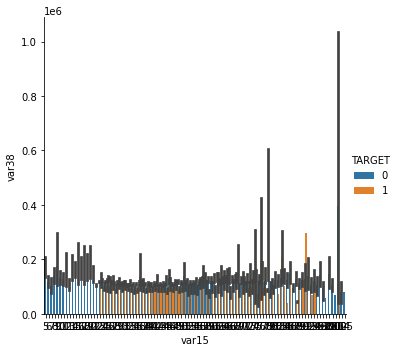

In [ ]:
import seaborn as sns
sns.catplot(data=train_data, x='var15', y='var38', hue='TARGET', kind='bar')

In [ ]:
fig = px.scatter(train_data, x="var15", y="var38", color="TARGET", marginal_y="violin",
           marginal_x="box", trendline="ols", template="simple_white")
fig.show()

In [ ]:
fig = px.bar(train_data, x="var15", y="var38", color="TARGET", barmode="group",labels={0,1},log_y=True,color_discrete_sequence=["green","red"])
fig.show()

In [ ]:
fig = px.density_contour(data_frame=train_data,x = "var15",y="var38",range_y=(0,300000))
fig.show()

From the above visualization we can say that 
1.   people who are aged between **20 to 40** only have realtionship value with bank.
2.   People who doesn't have any relationship value (**above 40 aged**) with bank are mostly unsatisfied customers



In [ ]:
fig = px.density_contour(data_frame=train_data,x = "var15",y="TARGET", color="TARGET")
fig.show()

In [ ]:
sns.catplot(x="TARGET", y="var15", data=train_data)

In [ ]:
sns.catplot(x="var15", y="var38", hue="TARGET", kind="swarm", data=train_data);

In [ ]:
sns.catplot(x="TARGET", y="var3", data=train_data)

In [ ]:
train_data.groupby(['var15','TARGET']).size().unstack().plot(kind='bar',stacked=True)
plt.show()

In [ ]:
train_data.groupby(['var38','TARGET']).size().unstack().plot(kind='bar',stacked=True)
plt.show()

In [ ]:
sns.regplot(x="var15", y="var38", data=train_data);

## Missing value treatment

In [ ]:
# Replacing value "-999999" in var3 column with most occuring value(75%) 2
train_data.var3 = train_data.var3.replace(-999999,2)

In [ ]:
test_data.var3 = test_data.var3.replace(-999999,2)

In [ ]:
test_data_ac.var3 = test_data_ac.var3.replace(-999999,2)
train_data_ac.var3 = train_data_ac.var3.replace(-999999,2)

In [ ]:
print(train_data.shape,test_data.shape, train_data_ac.shape,test_data_ac.shape)

(76020, 308) (75818, 307) (76020, 215) (75818, 214)


## Removing low variance features

In [ ]:
train_data_hv = train_data[features_wo_low_variance(train_data)].copy()

In [ ]:
test_data_hv = test_data[features_wo_low_variance(train_data)[:-1]].copy()

In [ ]:
print(train_data_hv.shape,test_data_hv.shape)

(76020, 249) (75818, 248)


In [ ]:
train_data_ac_hv = train_data_ac[features_wo_low_variance(train_data_ac)].copy()
test_data_ac_hv = test_data_ac[features_wo_low_variance(train_data_ac)[:-1]].copy()

In [ ]:
print(train_data_ac_hv.shape,test_data_ac_hv.shape)

(76020, 190) (75818, 189)


## Feature correlation analysis

In [ ]:
def find_correlated_features(data):
  # Create correlation matrix
  corr_matrix = data.corr().abs()

  # Select upper triangle of correlation matrix
  upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))

  # Find features with correlation greater than 0.95
  to_drop = [column for column in upper.columns if any(upper[column] > 0.95)]

  print(len(to_drop))
  return to_drop



*   As correlation matrix is symmetric, it is reduandant to consider the whole matrix.
* Instead we can consider either upper or lower triangle of the correaltion matrix. 
*   Now, we won't drop the features with high correlation as we might loose information






In [ ]:
# Drop features having correlation greater than 0.95
train_data_hv_co= train_data_hv.drop(find_correlated_features(train_data_hv), axis=1)
test_data_hv_co= test_data_hv.drop(find_correlated_features(train_data_hv), axis=1)

70
70


In [ ]:
# shape of the train_data after dropping high correlated features
print(train_data_hv_co.shape,test_data_hv_co.shape)

(76020, 179) (75818, 178)


In [ ]:
# Drop features having correlation greater than 0.95
train_data_ac_hv_co= train_data_ac_hv.drop(find_correlated_features(train_data_ac_hv), axis=1)
test_data_ac_hv_co= test_data_ac_hv.drop(find_correlated_features(train_data_ac_hv), axis=1)

55
55


In [ ]:
# shape of the train_data after dropping high correlated features
print(train_data_ac_hv_co.shape,test_data_ac_hv_co.shape)

(76020, 135) (75818, 134)


In [ ]:
# No. of rows after dropping missing values
train_data.dropna(how = 'any').shape[0]

76020

## Outlier analysis

In [ ]:
train = train_data.copy()
for col in train.drop(['ID','TARGET'],axis=1).columns:
  temp=train.loc[(train[col]>(train[col].quantile(0.75)+1.5*(train[col].quantile(0.75)-train[col].quantile(0.25))))|(train[col]<(train[col].quantile(0.25)-1.5*(train[col].quantile(0.75)-train[col].quantile(0.25))))][[col,'TARGET']]
  print('Number of outliers in {0} columns is {1} and number of unhappy customers in outliers is {2} '.format(col,temp.count()[0],temp.loc[temp['TARGET']==1].count()[0]))
  #print('percentage of fraud transactions in outliers in {} with respect to entire data set is {:.9f}'.format(temp.loc[temp['Class']==1].count()[0]/train.count()[0]))
  print('percentage of unhappy customers in outliers is {0}'.format(temp.loc[temp['TARGET']==1].count()[0]/temp['TARGET'].count()* 100))
  print('unhappy customers percentage in outlier in {0} is greater than entire dataset by {1} percent %'.format (col,(temp.loc[temp['TARGET']==1].count()[0]/temp['TARGET'].count()* 100-0.1727485630620034)/0.1727485630620034*100))

Number of outliers in var3 columns is 1739 and number of unhappy customers in outliers is 55 
percentage of unhappy customers in outliers is 3.1627372052903966
unhappy customers percentage in outlier in var3 is greater than entire dataset by 1730.8327138763048 percent %
Number of outliers in var15 columns is 2354 and number of unhappy customers in outliers is 96 
percentage of unhappy customers in outliers is 4.078164825828377
unhappy customers percentage in outlier in var15 is greater than entire dataset by 2260.7518080278505 percent %
Number of outliers in imp_ent_var16_ult1 columns is 3719 and number of unhappy customers in outliers is 163 
percentage of unhappy customers in outliers is 4.38289862866362
unhappy customers percentage in outlier in imp_ent_var16_ult1 is greater than entire dataset by 2437.1548978329256 percent %
Number of outliers in imp_op_var39_comer_ult1 columns is 9945 and number of unhappy customers in outliers is 362 
percentage of unhappy customers in outliers i

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in long_scalars
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in long_scalars
  import sys


unhappy customers percentage in outlier in ind_var12 is greater than entire dataset by 419.24642662225233 percent %
Number of outliers in ind_var13_0 columns is 3972 and number of unhappy customers in outliers is 27 
percentage of unhappy customers in outliers is 0.6797583081570997
unhappy customers percentage in outlier in ind_var13_0 is greater than entire dataset by 293.4957814457299 percent %
Number of outliers in ind_var13_corto_0 columns is 3264 and number of unhappy customers in outliers is 26 
percentage of unhappy customers in outliers is 0.7965686274509803
unhappy customers percentage in outlier in ind_var13_corto_0 is greater than entire dataset by 361.1144737366491 percent %
Number of outliers in ind_var13_corto columns is 3153 and number of unhappy customers in outliers is 23 
percentage of unhappy customers in outliers is 0.7294640025372662
unhappy customers percentage in outlier in ind_var13_corto is greater than entire dataset by 322.2692157939658 percent %
Number of ou

In [ ]:
# Calculating IQR
Q1 = train_data_up.quantile(0.25)
Q3 = train_data_up.quantile(0.75)
IQR = Q3 - Q1
print(IQR)

ID                              75644.00
var3                                0.00
var15                              17.00
imp_ent_var16_ult1                  0.00
imp_op_var39_comer_ult1             0.00
                                  ...   
saldo_medio_var13_largo_ult1        0.00
saldo_medio_var44_hace2             0.00
saldo_medio_var44_ult1              0.00
var38                           50885.64
TARGET                              0.00
Length: 135, dtype: float64




* We got IQR value for each column as above.



In [ ]:
# Finding outliers in the dataset
print(train_data_up < (Q1 - 1.5 * IQR)) or (train_data_up > (Q3 + 1.5 * IQR))

          ID   var3  var15  ...  saldo_medio_var44_ult1  var38  TARGET
0      False  False  False  ...                   False  False   False
1      False  False  False  ...                   False  False   False
2      False  False  False  ...                   False  False   False
3      False  False  False  ...                   False  False   False
4      False  False  False  ...                   False  False   False
...      ...    ...    ...  ...                     ...    ...     ...
76015  False  False  False  ...                   False  False   False
76016  False  False  False  ...                   False  False   False
76017  False  False  False  ...                   False  False   False
76018  False  False  False  ...                   False  False   False
76019  False  False  False  ...                   False  False   False

[76020 rows x 135 columns]


,ID,var3,var15,imp_ent_var16_ult1,imp_op_var39_comer_ult1,imp_op_var39_comer_ult3,imp_op_var40_comer_ult1,imp_op_var40_comer_ult3,imp_op_var40_ult1,imp_op_var41_efect_ult1,imp_op_var41_efect_ult3,imp_op_var41_ult1,imp_sal_var16_ult1,ind_var5_0,ind_var5,ind_var8_0,ind_var8,ind_var12_0,ind_var12,ind_var13_0,ind_var13_corto_0,ind_var14_0,ind_var24_0,ind_var24,ind_var25_cte,ind_var26_0,ind_var30,ind_var37_cte,ind_var37_0,ind_var39_0,num_var1_0,num_var1,num_var4,num_var5_0,num_var12_0,num_var13_largo_0,num_var14_0,num_var14,num_var17_0,num_var17,...,num_var22_ult1,num_var22_ult3,num_med_var22_ult3,num_med_var45_ult3,num_meses_var5_ult3,num_meses_var8_ult3,num_meses_var13_largo_ult3,num_meses_var39_vig_ult3,num_op_var39_comer_ult1,num_op_var39_comer_ult3,num_op_var40_comer_ult1,num_op_var40_comer_ult3,num_op_var41_efect_ult1,num_op_var41_efect_ult3,num_sal_var16_ult1,num_var43_emit_ult1,num_var43_recib_ult1,num_trasp_var11_ult1,num_var45_hace2,num_var45_hace3,num_var45_ult1,saldo_medio_var5_hace2,saldo_medio_var5_hace3,saldo_medio_var5_ult1,saldo_medio_var5_ult3,saldo_medio_var8_hace2,saldo_medio_var8_hace3,saldo_medio_var8_ult1,saldo_medio_var8_ult3,saldo_medio_var12_hace2,saldo_medio_var12_hace3,saldo_medio_var13_corto_hace2,saldo_medio_var13_corto_hace3,saldo_medio_var13_largo_hace2,saldo_medio_var13_largo_hace3,saldo_medio_var13_largo_ult1,saldo_medio_var44_hace2,saldo_medio_var44_ult1,var38,TARGET
0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,True,True,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,True,True,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,True,False,False,False,True,False,False,False,False,False,False,False,...,False,False,False,True,False,False,False,False,True,True,False,False,False,False,False,False,False,False,True,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,True,False,False,False,True,True,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,...,True,True,True,False,False,False,False,False,False,False,False,False,False,False,False,True,True,True,False,False,False,False,False,True,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...



*  In the above output, False means value is not an outlier.
* True means, it is an outlier.



In [ ]:
# Removing the outliers
train_data_ol=train_data_up.copy()
train_data_out = train_data_ol[((train_data_ol >= (Q1 - 1.5 * IQR)) & (train_data_ol <= (Q3 + 1.5 * IQR))).all(axis=1)]

In [ ]:
# Function for removing outliers
def remove_outlier(df):
	    low = .05
	    high = .95
	    quant_df = df.quantile([low, high])
	    for name in list(df.columns):
	      if is_numeric_dtype(df[name]):
	       df = df[(df[name] > quant_df.loc[low, name]) 
               & (df[name] < quant_df.loc[high, name])]
	    return df

In [ ]:
# Data without the outliers
train_data_out

,ID,var3,var15,imp_ent_var16_ult1,imp_op_var39_comer_ult1,imp_op_var39_comer_ult3,imp_op_var40_comer_ult1,imp_op_var40_comer_ult3,imp_op_var40_ult1,imp_op_var41_efect_ult1,imp_op_var41_efect_ult3,imp_op_var41_ult1,imp_sal_var16_ult1,ind_var5_0,ind_var5,ind_var8_0,ind_var8,ind_var12_0,ind_var12,ind_var13_0,ind_var13_corto_0,ind_var14_0,ind_var24_0,ind_var24,ind_var25_cte,ind_var26_0,ind_var30,ind_var37_cte,ind_var37_0,ind_var39_0,num_var1_0,num_var1,num_var4,num_var5_0,num_var12_0,num_var13_largo_0,num_var14_0,num_var14,num_var17_0,num_var17,...,num_var22_ult1,num_var22_ult3,num_med_var22_ult3,num_med_var45_ult3,num_meses_var5_ult3,num_meses_var8_ult3,num_meses_var13_largo_ult3,num_meses_var39_vig_ult3,num_op_var39_comer_ult1,num_op_var39_comer_ult3,num_op_var40_comer_ult1,num_op_var40_comer_ult3,num_op_var41_efect_ult1,num_op_var41_efect_ult3,num_sal_var16_ult1,num_var43_emit_ult1,num_var43_recib_ult1,num_trasp_var11_ult1,num_var45_hace2,num_var45_hace3,num_var45_ult1,saldo_medio_var5_hace2,saldo_medio_var5_hace3,saldo_medio_var5_ult1,saldo_medio_var5_ult3,saldo_medio_var8_hace2,saldo_medio_var8_hace3,saldo_medio_var8_ult1,saldo_medio_var8_ult3,saldo_medio_var12_hace2,saldo_medio_var12_hace3,saldo_medio_var13_corto_hace2,saldo_medio_var13_corto_hace3,saldo_medio_var13_largo_hace2,saldo_medio_var13_largo_hace3,saldo_medio_var13_largo_ult1,saldo_medio_var44_hace2,saldo_medio_var44_ult1,var38,TARGET
0,1,2,23,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,3,0,0,0,0,0,0,...,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,39205.170000,0
2,4,2,23,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,3,0,0,0,0,0,0,...,0,0,0,0,3,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,3.0,0.18,3.0,2.07,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,67333.770000,0
5,13,2,23,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,3,0,0,0,0,0,0,...,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,87975.750000,0
6,14,2,27,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,3,0,0,0,0,0,0,...,0,0,0,0,3,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,3.0,0.42,3.0,2.13,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,94956.660000,0
8,20,2,45,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,3,0,0,0,0,0,0,...,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,101962.020000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
76010,151816,2,25,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,3,0,0,0,0,0,0,...,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,165616.320000,0
76015,151829,2,48,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,3,0,0,0,0,0,0,...,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,60926.490000,0
76017,151835,2,23,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,3,0,0,0,0,0,0,...,0,0,0,0,2,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,3.0,0.00,3.0,3.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,74028.150000,0
76018,151836,2,25,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,3,0,0,0,0,0,0,...,0,0,0,0,3,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,3.0,1.74,3.0,2.58,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,84278.160000,0


In [ ]:
train_data_out["TARGET"].value_counts()

0    27154
Name: TARGET, dtype: int64

We are not considering to remove outliers now as it is removing target values with 1, means we are loosing valuable info

In [ ]:
train_data_norm2= train_data_hv_co.drop(["ID","TARGET"],axis=1)
train_data_norm1= train_data_ac_hv_co.drop(["ID","TARGET"],axis=1)
train_data_norm= train_data_ac.drop(["ID","TARGET"],axis=1)

In [ ]:
print(train_data_norm.shape,train_data_norm1.shape,train_data_norm2.shape)

(76020, 213) (76020, 133) (76020, 177)


In [ ]:
# normalize the data 
from sklearn.preprocessing import normalize
train_data_normalized = normalize(train_data_norm,axis=0)

In [ ]:
train_data_normalized

array([[0.00073787, 0.0023399 , 0.        , ..., 0.        , 0.        ,
        0.00065512],
       [0.00073787, 0.00345898, 0.        , ..., 0.        , 0.        ,
        0.00082344],
       [0.00073787, 0.0023399 , 0.        , ..., 0.        , 0.        ,
        0.00112515],
       ...,
       [0.00073787, 0.0023399 , 0.        , ..., 0.        , 0.        ,
        0.00123702],
       [0.00073787, 0.00254337, 0.        , ..., 0.        , 0.        ,
        0.0014083 ],
       [0.00073787, 0.0046798 , 0.        , ..., 0.        , 0.        ,
        0.00196028]])

In [ ]:
# Scaling the data
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
data_rescaled = scaler.fit_transform(train_data_normalized)

## Upsampling the dataset

In [ ]:
from sklearn.utils import resample
def upsampling_dataset(data):
  data_majority=data[data.TARGET==0] 
  data_minority=data[data.TARGET==1]  

  data_minority_upsampled=resample(data_minority,replace=True,n_samples=73012)
  data_upsampled=pd.concat([data_minority_upsampled,data_majority])

  data_upsampled.info()
  print(data_upsampled['TARGET'].value_counts())
  return data_upsampled

In [ ]:
datasets = [train_data_ac,train_data_ac_hv_co,train_data_hv_co]

In [ ]:
#test_dataset = [test_data_ac,test_data_ac_hv_co,test_data_hv_co]

In [ ]:
upsampled_data = []
for data in datasets:
  upsampled_data.append(upsampling_dataset(data))

<class 'pandas.core.frame.DataFrame'>
Int64Index: 146024 entries, 51893 to 76019
Columns: 215 entries, ID to TARGET
dtypes: float64(72), int64(143)
memory usage: 240.6 MB
1    73012
0    73012
Name: TARGET, dtype: int64
<class 'pandas.core.frame.DataFrame'>
Int64Index: 146024 entries, 35335 to 76019
Columns: 135 entries, ID to TARGET
dtypes: float64(52), int64(83)
memory usage: 151.5 MB
1    73012
0    73012
Name: TARGET, dtype: int64
<class 'pandas.core.frame.DataFrame'>
Int64Index: 146024 entries, 23690 to 76019
Columns: 179 entries, ID to TARGET
dtypes: float64(78), int64(101)
memory usage: 200.5 MB
1    73012
0    73012
Name: TARGET, dtype: int64


In [ ]:
'''upsampled_testdata = []
for data in test_dataset:
  upsampled_testdata.append(upsampling_dataset(data))'''

AttributeError: ignored

## PCA Analysis

In [ ]:
#Applying PCA  to reduce dimensionality of the dataaset
from sklearn.decomposition import PCA

pca = PCA(n_components=0.98)
data_transformed = pca.fit_transform(train_data_normalized) # using normal data

In [ ]:
from sklearn.preprocessing import StandardScaler
def pca_analysis_components(X_train):
  scaler = StandardScaler()
  X_train_scaled = scaler.fit_transform(X_train)

  # Find the optimal number of PCA 
  pca = PCA(n_components=X_train_scaled.shape[1])
  pca.fit(X_train_scaled)
  ratios = pca.explained_variance_ratio_

  # Plot the explained variance ratios
  x = np.arange(X_train_scaled.shape[1])
  plt.plot(x, np.cumsum(ratios), '-o')
  plt.xlabel("Number of PCA's")
  plt.ylabel("Cumulated Sum of Explained Variance")
  plt.title("Variance Explained by PCA's")

  # Find the optimal number of PCA's
  for i in range(np.cumsum(ratios).shape[0]):
    if np.cumsum(ratios)[i] >= 0.99:
      num_pca = i + 1
      print("The optimal number of PCA's is: {}".format(num_pca))
      break
    else:
      continue

In [ ]:
def find_pca_components(data):
  pca = PCA().fit(data)
  plt.rcParams["figure.figsize"] = (12,6)

  fig, ax = plt.subplots()
  xi = np.arange(1, data.shape[1]+1, step=1)
  y = np.cumsum(pca.explained_variance_ratio_)

  plt.ylim(0.0,1.1)
  plt.plot(xi/2, y, marker='o', linestyle='--', color='b')

  plt.xlabel('Number of Components')
  plt.xticks(np.arange(0, 80, step=2)) #change from 0-based array index to 1-based human-readable label
  plt.ylabel('Cumulative variance (%)')
  plt.title('The number of components needed to explain variance')
  plt.axhline(y=0.98, color='r', linestyle='-')
  plt.text(0.7, 0.85, '98% cut-off threshold', color = 'red', fontsize=16)
  print("Pca component prediciton:")
  ax.grid(axis='x')
  plt.show()

Pca component prediciton:


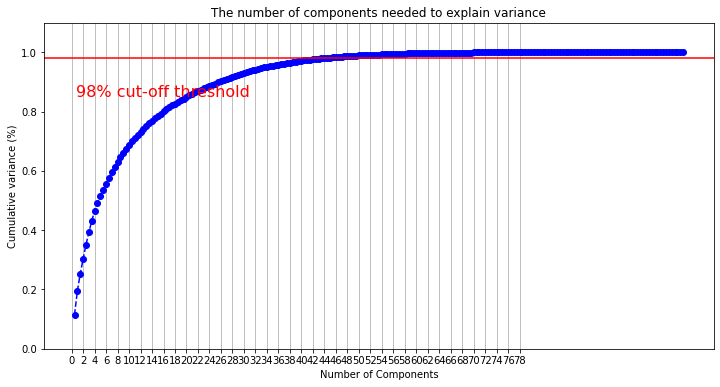

Pca component prediciton:


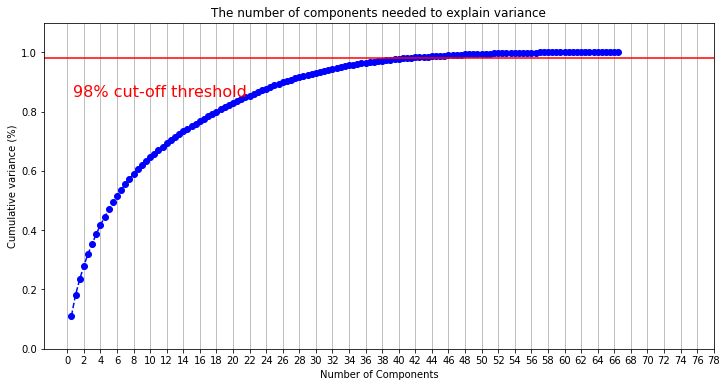

Pca component prediciton:


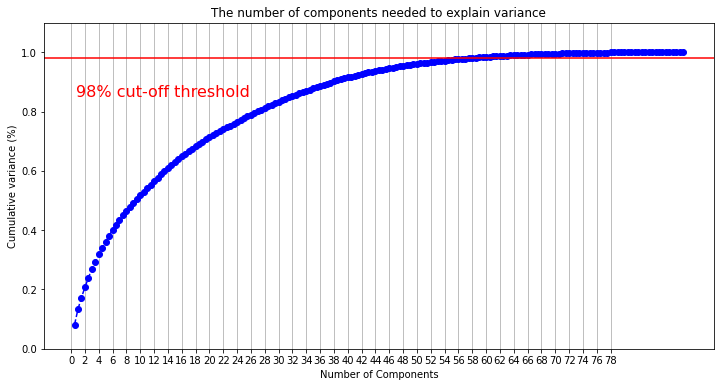

In [ ]:
for data in [train_data_norm,train_data_norm1,train_data_norm2]:
  find_pca_components(normalize(data,axis=0))

From the above graph, we can see that in-order to achieve 98% threshold we need to have 2 pca components.

In [ ]:
def pca_analysis(n_co,data):
  pca = PCA(n_components=n_co)
  data_transformed = pca.fit_transform(data)
  print("PCA Analysis for %s pca components"%(n_co))
  print("Eigen vector for each principal component : ",pca.components_)
  print("Amount of variance by each PCA : ", pca.explained_variance_)
  print("Percentage of variance by each PCA : ", pca.explained_variance_ratio_)
  print("number of features in training data : ", pca.n_features_)
  print("number of samples in training data: ", pca.n_samples_)
  print("noise variance of the data : ",pca.noise_variance_)
  return pd.DataFrame(data_transformed)

In [ ]:
data_transformed=[]
for no, data in [(48,train_data_norm),(44,train_data_norm1),(60,train_data_norm2)]:
  data_transformed.append(pca_analysis(no,normalize(data,axis=0)))

PCA Analysis for 48 pca components
Eigen vector for each principal component :  [[ 2.09353449e-02  1.88213868e-02  1.33538535e-02 ...  1.11803620e-02
   1.11659347e-02  1.26193811e-03]
 [ 8.02458054e-03  3.32000658e-02  1.11340786e-02 ...  7.40624636e-03
   7.99884291e-03  5.42276297e-03]
 [-2.99455483e-03  4.39498100e-03  4.85535078e-03 ...  1.73003766e-02
   1.80926705e-02  3.76975912e-04]
 ...
 [-3.72147452e-02  1.32162586e-04 -8.07138894e-02 ...  4.54460518e-03
  -1.33526490e-03 -4.24086650e-03]
 [ 3.57483249e-01  2.82262561e-02  7.69803354e-03 ... -2.14103183e-02
  -7.29215507e-03 -8.58355592e-02]
 [-1.30963921e-01  3.52611069e-04 -1.77209372e-01 ... -1.81105196e-02
   8.01962025e-03  8.97836266e-02]]
Amount of variance by each PCA :  [2.90358713e-04 2.02857571e-04 1.46286044e-04 1.26338580e-04
 1.21060771e-04 1.05898509e-04 9.78853938e-05 8.38290547e-05
 6.63641619e-05 5.91655207e-05 5.47056235e-05 5.28408041e-05
 4.91844485e-05 4.72333793e-05 4.55938717e-05 4.36047024e-05
 4.013

In [ ]:
data_concat = pd.concat([pd.DataFrame(train_data_normalized), data_transformed], axis = 1)

In [ ]:
data_concat

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,PCA1,PCA2,PCA3,PCA4,PCA5,PCA6,PCA7,PCA8
0,6.885512e-08,0.006035,0.004927,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.006035,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.006035,0.000000,0.0,0.0,0.0,0.006035,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.006035,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.006509,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.002321,0.0,-0.007196,-0.004177,0.006420,0.000574,0.000622,-0.005126,0.000608,-0.003661
1,2.754205e-07,0.006035,0.004927,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.006035,0.007586,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.006035,0.007586,0.0,0.0,0.0,0.006035,0.0,0.007586,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.006035,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.003254,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000698,0.000222,0.000661,0.000601,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.003987,0.0,-0.003079,-0.000307,-0.003737,0.001481,-0.001295,-0.005325,-0.005550,-0.001405
2,8.951165e-07,0.006035,0.004927,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.006035,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.006035,0.000000,0.0,0.0,0.0,0.006035,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.006035,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.006509,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.005209,0.0,-0.007199,-0.004240,0.006529,0.000573,0.000666,-0.005159,0.000655,-0.000780
3,9.639717e-07,0.006035,0.005783,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.006035,0.007586,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.006035,0.007586,0.0,0.0,0.0,0.006035,0.0,0.007586,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.006035,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.006509,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000698,0.000519,0.000661,0.000618,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.005623,0.0,-0.002662,0.001095,-0.006751,0.001460,-0.001511,-0.005314,0.001740,0.000204
4,1.377102e-06,0.006035,0.009639,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.006035,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.006035,0.000000,0.0,0.0,0.0,0.006035,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.006035,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.006509,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.006037,0.0,-0.007225,-0.004256,0.006799,0.000507,0.000672,-0.005165,0.000926,-0.000153
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27452,1.045331e-02,0.006035,0.005355,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.006035,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.006035,0.000000,0.0,0.0,0.0,0.006035,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.006035,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.006509,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.009806,0.0,-0.007244,-0.004272,0.006634,0.000571,0.000647,0.005238,0.000648,0.003917
27453,1.045420e-02,0.006035,0.010282,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.006035,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.006035,0.000000,0.0,0.0,0.0,0.006035,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.006035,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.006509,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.003608,0.0,-0.007265,-0.004136,0.006650,0.000504,0.000545,0.005313,0.000818,-0.002477
27454,1.045462e-02,0.006035,0.004927,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.006035,0.007586,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.006035,0.007586,0.0,0.0,0.0,0.006035,0.0,0.007586,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.006035,...,0.0,0.0,0.0

Doubt -- Resolved
 My rows are increased after doing PCA and rows are introduced with NaN values in them, need to know why it happened like this

## Factor Analysis

In [ ]:
!pip install factor_analyzer
from factor_analyzer import FactorAnalyzer

     |████████████████████████████████| 40kB 1.8MB/s 
  Created wheel for factor-analyzer: filename=factor_analyzer-0.3.2-cp36-none-any.whl size=40380 sha256=3bda92f35776af5e43e15e536ddbd14a54d093036b632977ffb5ed74129a696a
  Stored in directory: /root/.cache/pip/wheels/4a/d0/57/f1330cb9c80e82d8d05391c74c94ed61ce3f03bf6157f3d6db
Successfully built factor-analyzer


In [ ]:
# Create factor analysis object and perform factor analysis
fa = FactorAnalyzer()
fa.fit(train_data_up.drop("TARGET",axis=1))
eigen_values, vectors = fa.get_eigenvalues()
fa.loadings_

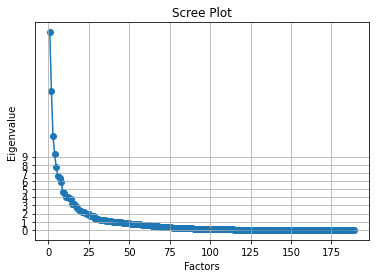

In [ ]:
# Create scree plot using matplotlib
plt.scatter(range(1,train_data_up.drop("TARGET",axis=1).shape[1]+1),eigen_values)
plt.plot(range(1,train_data_up.drop("TARGET",axis=1).shape[1]+1),eigen_values)
plt.title('Scree Plot')
plt.yticks(np.arange(0, 10, step=1))
plt.xlabel('Factors')
plt.ylabel('Eigenvalue')
plt.grid()
plt.show()

From the above plot, we can see that eigen values greater than 1 are almost 50 features. So we are considering 50 as no of factors

In [ ]:
fa = FactorAnalyzer(n_factors=50,rotation="varimax")
fa.fit(train_data_up.drop("TARGET",axis=1))

/usr/local/lib/python3.6/dist-packages/factor_analyzer/factor_analyzer.py:536: UserWarning: Failed to converge: b'STOP: TOTAL NO. of f AND g EVALUATIONS EXCEEDS LIMIT'
  warnings.warn('Failed to converge: {}'.format(res.message))


FactorAnalyzer(bounds=(0.005, 1), impute='median', is_corr_matrix=False,
               method='minres', n_factors=50, rotation='varimax',
               rotation_kwargs={}, use_smc=True)

In [ ]:
fa.get_factor_variance()

(array([13.0866243 , 12.81174131, 11.42083656,  8.72942491,  6.8169304 ,
         6.68747658,  6.59237164,  6.49906809,  5.84370038,  5.35313202,
         5.25029131,  4.39358082,  4.03058118,  3.62921085,  3.48273745,
         3.43033694,  3.4204262 ,  2.91022428,  2.89814598,  2.76968605,
         2.74167119,  2.54613612,  2.24829573,  2.08180781,  2.07403892,
         2.02182534,  1.90127867,  1.87276563,  1.67491507,  1.63778515,
         1.60135188,  1.5117567 ,  1.34614368,  1.28258719,  1.2505335 ,
         1.22336474,  1.05021377,  1.04813836,  1.03647591,  0.91718601,
         0.91576968,  0.89086707,  0.87759155,  0.87554029,  0.82672892,
         0.81232137,  0.71300986,  0.52360828,  0.49793985,  0.40956738]),
 array([0.0692414 , 0.06778699, 0.06042771, 0.04618743, 0.03606841,
        0.03538347, 0.03488027, 0.0343866 , 0.03091905, 0.02832345,
        0.02777932, 0.02324646, 0.02132583, 0.01920217, 0.01842718,
        0.01814993, 0.01809749, 0.01539801, 0.01533411, 0.014654

In [ ]:
x=train_data_up.drop("TARGET",axis=1)

In [ ]:
x.shape

(76020, 134)

In [ ]:
pca = PCA(n_components=8).fit(x)
print("Explained variance by component: %s" %pca.explained_variance_ratio_)
pca_data=pd.DataFrame(pca.components_,columns=train_data_up.drop("TARGET",axis=1).columns)
print(pca_data)

Explained variance by component: [8.40382153e-01 1.59617761e-01 5.79031096e-08 1.27863946e-08
 5.74521336e-09 3.32576972e-09 1.61582364e-09 1.36557177e-09]
             ID          var3  ...  saldo_medio_var44_ult1     var38
0  1.768442e-07 -3.476941e-11  ...           -4.896558e-09  0.000002
1 -3.197517e-07  5.023218e-11  ...            3.572753e-06  0.000002
2 -1.455338e-03  7.004435e-07  ...            5.725594e-05  0.999862
3 -2.898447e-03  4.149560e-06  ...            1.338170e-04 -0.015278
4 -5.780575e-03 -1.241667e-06  ...           -1.099063e-04  0.004577
5  9.999194e-01 -3.812424e-07  ...            5.231796e-06  0.001434
6 -8.522495e-03  2.217445e-05  ...            2.206323e-04 -0.001189
7 -5.560079e-03 -8.028118e-06  ...            1.508151e-03 -0.000214

[8 rows x 134 columns]


From the above variance by component values, we can fix the number of components to 2 , as it covers almost 0.84038+0.159 ~= 0.99938  

In [ ]:
pca = PCA(n_components=2)
pca_transformed=pca.fit_transform(x)
pca_transformed

array([[-48691637.77581811,  -9100495.31473084],
       [-48691638.75058431,  -9100495.29571873],
       [-48691637.73300433,  -9100495.26921701],
       ...,
       [-48691637.69597334,  -9100495.30693595],
       [-48691637.68038838,  -9100495.29035672],
       [-48691637.63021416,  -9100495.23694253]])

In [ ]:
pca_transformed = pd.DataFrame(pca_transformed,columns=["PCA_1","PCA_2"])

In [ ]:
pca_transformed

,PCA_1,PCA_2
0,-4.869164e+07,-9.100495e+06
1,-4.869164e+07,-9.100495e+06
2,-4.869164e+07,-9.100495e+06
3,-4.869164e+07,-9.100495e+06
4,-4.869163e+07,-9.100494e+06
...,...,...
76015,-4.869164e+07,-9.100495e+06
76016,-4.869164e+07,-9.100495e+06
76017,-4.869164e+07,-9.100495e+06
76018,-4.869164e+07,-9.100495e+06


In [ ]:
# Applying LDA to reduce dimenionality
np.seterr(divide='ignore', invalid='ignore')
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

lda = LinearDiscriminantAnalysis()
data_lda = lda.fit_transform(train_data_out.drop("TARGET",axis=1), train_data_out["TARGET"])

In [ ]:
data_lda

array([], shape=(27457, 0), dtype=float64)

In [ ]:
np.isfinite(train_data_out).all()

ID                               True
var3                             True
var15                            True
imp_ent_var16_ult1               True
imp_op_var39_comer_ult1          True
                                 ... 
saldo_medio_var13_largo_hace2    True
saldo_medio_var13_largo_hace3    True
saldo_medio_var44_hace2          True
var38                            True
TARGET                           True
Length: 98, dtype: bool

In [ ]:
# Implementing train and test split on the train data
from sklearn.model_selection import train_test_split

In [ ]:
train_data_up["TARGET"].value_counts()

0    73012
1     3008
Name: TARGET, dtype: int64

In [ ]:
y= train_data_up["TARGET"]

In [ ]:
y.value_counts()

0    73012
1     3008
Name: TARGET, dtype: int64

In [ ]:
#x= train_data.drop(["TARGET","ID"],axis=1)
x= data_transformed_pca
x

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45
0,-0.006832,-0.002920,0.001155,0.000744,0.001536,-4.773539e-05,0.000034,0.001502,0.000118,-0.000167,0.000276,-0.000249,0.000674,0.000394,-0.001471,0.001782,-0.001128,-0.000585,-0.004908,0.002681,-0.000518,0.000114,-0.000089,0.000633,-0.000577,0.000265,0.000676,-0.000295,0.000529,-0.000369,-0.000451,-0.000080,0.000215,-0.000874,0.000470,-0.000449,-0.000213,0.000056,-0.000054,0.000203,-0.000144,0.000391,-0.000583,-0.000290,0.000144,-0.000842
1,-0.003953,0.009022,0.001359,0.009049,-0.000335,-4.170819e-03,-0.005173,0.000486,-0.002734,0.000181,-0.000846,-0.000513,0.000557,0.000192,-0.000486,0.000896,0.000576,-0.000110,0.000285,0.000559,-0.001329,0.001329,-0.000810,0.001142,0.001310,0.000134,-0.000297,0.000632,-0.002912,0.000108,0.002751,-0.001178,-0.003564,0.001685,-0.000242,0.000720,-0.005029,0.005388,-0.003889,0.003739,-0.004965,0.000857,0.005915,0.003682,-0.003676,-0.014292
2,-0.005862,-0.002273,0.000718,0.000268,0.000575,-1.448206e-07,0.000100,0.000444,0.000137,0.000045,0.000141,0.000234,0.000340,0.000166,-0.000347,0.000484,0.000652,0.000036,0.001561,-0.001251,0.000276,-0.000144,-0.000118,-0.000182,0.000213,0.000027,-0.000396,-0.000140,-0.000088,0.000134,-0.000227,0.000039,-0.000009,0.000659,-0.000092,-0.000110,-0.000305,-0.000174,0.000128,-0.000333,0.000827,-0.000188,-0.000540,0.000060,0.000204,0.000041
3,0.012081,-0.006236,-0.004458,0.000943,-0.003774,4.785543e-04,0.000541,-0.020463,-0.003263,-0.000533,0.008633,0.004438,0.008122,-0.000213,0.000236,0.002109,0.001233,0.001058,0.000089,0.001349,-0.001170,-0.000273,0.000692,-0.001079,0.002842,0.000735,-0.000611,-0.002854,0.000252,-0.000939,0.001846,-0.000416,0.001364,0.000476,-0.000309,-0.005089,0.001755,0.000039,-0.002394,-0.000224,0.002878,-0.001183,-0.001351,0.000519,0.000837,-0.000815
4,0.011833,0.026032,-0.004523,-0.033244,0.006106,4.683292e-03,0.012130,0.002840,0.014698,0.002032,-0.006519,-0.002422,-0.003787,0.006945,-0.013481,0.016616,-0.012942,-0.021944,0.012021,0.005878,-0.004141,0.007289,-0.001299,-0.003206,0.013805,0.011366,0.013611,0.000170,-0.003441,0.006379,0.005467,-0.001075,-0.000622,-0.000392,0.001595,-0.001259,0.000406,0.000797,-0.000840,0.000620,0.000996,-0.000933,0.000170,-0.002583,0.000561,-0.002949
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
76015,-0.006758,-0.002812,0.001149,0.000749,0.001539,-2.196399e-05,0.000040,0.001479,0.000137,-0.000174,0.000308,-0.000254,0.000642,0.000349,-0.001457,0.001784,-0.001097,-0.000588,-0.004993,0.002768,-0.000556,0.000132,-0.000089,0.000672,-0.000593,0.000269,0.000657,-0.000299,0.000478,-0.000350,-0.000422,-0.000070,0.000247,-0.000883,0.000501,-0.000440,-0.000176,0.000088,-0.000094,0.000220,-0.000314,0.000433,-0.000414,-0.000269,0.000105,-0.000738
76016,0.008098,0.018479,-0.003317,-0.022102,0.005224,-1.110821e-03,0.007829,0.001208,-0.006554,0.001015,-0.004452,-0.001631,-0.003718,-0.005142,0.011214,-0.008051,0.004816,-0.004141,-0.002553,0.006333,-0.002577,0.002467,-0.001193,0.006519,-0.000514,0.010429,0.003746,-0.005837,0.000489,-0.000445,-0.001111,0.000413,0.010194,0.000939,0.004367,-0.001429,0.002717,-0.002461,0.002309,-0.000086,0.001452,-0.003194,-0.000294,-0.001199,0.002406,-0.002034
76017,-0.005886,-0.002292,0.000733,0.000296,0.000673,-6.003384e-06,0.000109,0.000522,0.000128,0.000023,0.000149,0.000178,0.000385,0.000203,-0.000403,0.000557,0.000517,-0.000014,0.001120,-0.000980,0.000216,-0.000132,-0.000121,-0.000117,0.000143,0.000045,-0.000327,-0.000155,-0.000016,0.000101,-0.000219,0.000035,0.000041,0.000537,-0.000052,-0.000099,-0.000277,-0.000170,0.000092,-0.000309,0.000724,-0.000141,-0.000481,0.000052,0.000182,-0.000005
76018,-0.005818,-0.002246,0.000712,0.000263,0.000558,-6.616530e-06,0.000094,0.000433,0.000125,0.000044,0.000162,0.000247,0.000307,0.0001

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.30, random_state=42)

In [ ]:
# Displaying sizes of X and Y train, test data
print('X train shape: ', X_train.shape)
print('X test shape: ', X_test.shape)
print('y train shape: ', y_train.shape)
print('y test shape: ', y_test.shape)

X train shape:  (53214, 216)
X test shape:  (22806, 216)
y train shape:  (53214,)
y test shape:  (22806,)


In [ ]:
y_test.value_counts()

0    21891
1      915
Name: TARGET, dtype: int64

## Logistic Regression

In [ ]:
from sklearn.linear_model import LogisticRegression

logistic_regression = LogisticRegression(max_iter=400)
logistic_regression.fit(X_train, y_train)

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=400,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [ ]:
y_pred = logistic_regression.predict(X_test)

In [ ]:
from sklearn.metrics import confusion_matrix
confusion_matrix = confusion_matrix(y_test, y_pred)
print(confusion_matrix)

[[21891     0]
 [  915     0]]


From the above result, we can say that 21845+46 predicted correct and 914+1 predicted incorrect

## Random Forest classifier

In [ ]:
from sklearn.ensemble import RandomForestClassifier

classifier = RandomForestClassifier(n_estimators=70,random_state=50)
classifier.fit(X_train, y_train)

# Predicting the Test set results
y_pred = classifier.predict(X_test)

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
# Confusion matrix 
confusion = confusion_matrix( y_test, y_pred )
print(confusion)
# classification_report
print(classification_report( y_test, y_pred))

print(accuracy_score(y_test,y_pred))

from sklearn import metrics
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))
print("Precision:",metrics.precision_score(y_test, y_pred))
print("Recall:",metrics.recall_score(y_test, y_pred))

[[21685   206]
 [  874    41]]
              precision    recall  f1-score   support

           0       0.96      0.99      0.98     21891
           1       0.17      0.04      0.07       915

    accuracy                           0.95     22806
   macro avg       0.56      0.52      0.52     22806
weighted avg       0.93      0.95      0.94     22806

0.9526440410418311
Accuracy: 0.9526440410418311
Precision: 0.1659919028340081
Recall: 0.04480874316939891


## Decision Tree classifier

In [ ]:
from sklearn.tree import DecisionTreeClassifier
classifier = DecisionTreeClassifier(max_depth=10,splitter='best',min_samples_leaf=20,ccp_alpha=0)
classifier.fit(X_train,y_train)

y_pred = classifier.predict(X_test)

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
# Confusion matrix 
confusion = confusion_matrix( y_test, y_pred )
print(confusion)
# classification_report
print(classification_report( y_test, y_pred))

print(accuracy_score(y_test,y_pred))

from sklearn import metrics
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))
print("Precision:",metrics.precision_score(y_test, y_pred))
print("Recall:",metrics.recall_score(y_test, y_pred))

[[21864    27]
 [  909     6]]
              precision    recall  f1-score   support

           0       0.96      1.00      0.98     21891
           1       0.18      0.01      0.01       915

    accuracy                           0.96     22806
   macro avg       0.57      0.50      0.50     22806
weighted avg       0.93      0.96      0.94     22806

0.9589581689029203
Accuracy: 0.9589581689029203
Precision: 0.18181818181818182
Recall: 0.006557377049180328


## SVM

In [ ]:
from sklearn.svm import SVC

classifier = SVC()
classifier.fit(X_train, y_train)

# Predicting the Test set r esults
y_pred = classifier.predict(X_test)

In [ ]:
# Confusion matrix 
confusion = confusion_matrix( y_test, y_pred )
print(confusion)
# classification_report
print(classification_report( y_test, y_pred))

print(accuracy_score(y_test,y_pred))

[[21891     0]
 [  915     0]]
              precision    recall  f1-score   support

           0       0.96      1.00      0.98     21891
           1       0.00      0.00      0.00       915

    accuracy                           0.96     22806
   macro avg       0.48      0.50      0.49     22806
weighted avg       0.92      0.96      0.94     22806

0.9598789792159957


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



## Naive Bayes

In [ ]:
from sklearn.naive_bayes import GaussianNB
classifier = GaussianNB()
classifier.fit(X_train,y_train)

y_pred = classifier.predict(X_test)

In [ ]:
# Confusion matrix 
confusion = confusion_matrix( y_test, y_pred )
print(confusion)
# classification_report
print(classification_report( y_test, y_pred))

print(accuracy_score(y_test,y_pred))

[[ 2508 19383]
 [   37   878]]
              precision    recall  f1-score   support

           0       0.99      0.11      0.21     21891
           1       0.04      0.96      0.08       915

    accuracy                           0.15     22806
   macro avg       0.51      0.54      0.14     22806
weighted avg       0.95      0.15      0.20     22806

0.1484697009558888


## Stochastic Gradient Classifier

In [ ]:
from sklearn.linear_model import SGDClassifier
classifier = SGDClassifier(loss='modified_huber',shuffle=True,max_iter=100)
classifier.fit(X_test,y_test)

y_pred = classifier.predict(X_test)

In [ ]:
# Confusion matrix 
confusion = confusion_matrix( y_test, y_pred )
print(confusion)
# classification_report
print(classification_report( y_test, y_pred))

print(accuracy_score(y_test,y_pred))

[[21891     0]
 [  915     0]]
              precision    recall  f1-score   support

           0       0.96      1.00      0.98     21891
           1       0.00      0.00      0.00       915

    accuracy                           0.96     22806
   macro avg       0.48      0.50      0.49     22806
weighted avg       0.92      0.96      0.94     22806

0.9598789792159957


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


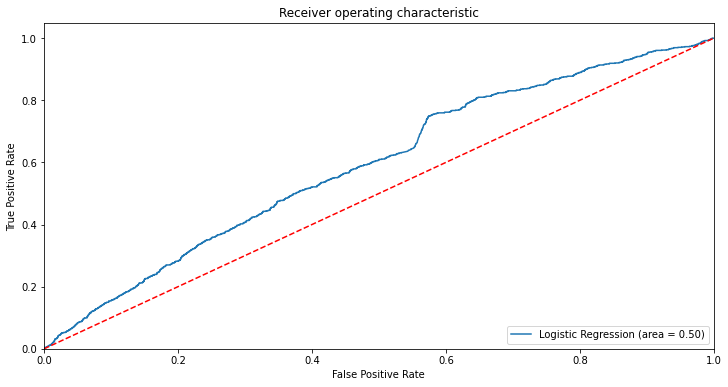

In [ ]:
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
logit_roc_auc = roc_auc_score(y_test, logistic_regression.predict(X_test))
fpr, tpr, thresholds = roc_curve(y_test, logistic_regression.predict_proba(X_test)[:,1])
plt.figure()
plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % logit_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show()

## Note
ROC curve is another tool for binary classifiers, dotted line represents purely random classifier, good classifier stays away from the dotted curve.

Text(0.5, 384.16, 'Predicted label')

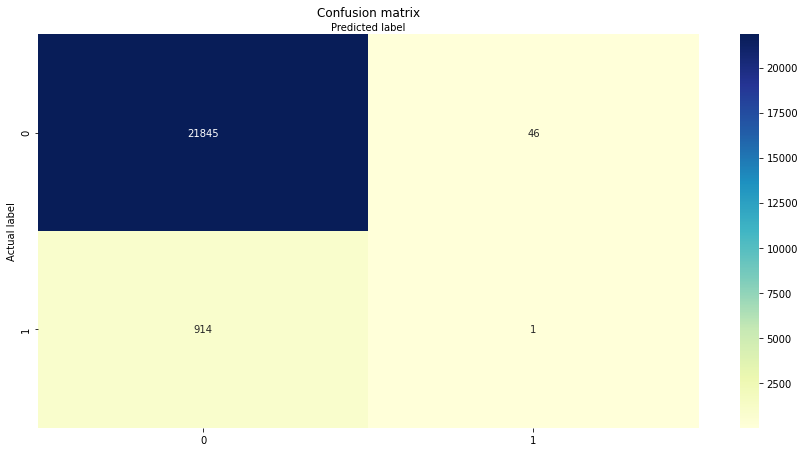

In [ ]:
class_names=[0,1] # name  of classes
fig, ax = plt.subplots()
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names)
plt.yticks(tick_marks, class_names)
# create heatmap
sns.heatmap(pd.DataFrame(confusion_matrix), annot=True, cmap="YlGnBu" ,fmt='g')
ax.xaxis.set_label_position("top")
plt.tight_layout()
plt.title('Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')

In [ ]:
from sklearn import metrics
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))
print("Precision:",metrics.precision_score(y_test, y_pred))
print("Recall:",metrics.recall_score(y_test, y_pred))

Accuracy: 0.9579058142594055
Precision: 0.02127659574468085
Recall: 0.001092896174863388


Precision and Recall are very bad for our model,our model is not predicting accurately

## Doing PCA Again

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.feature_selection import SelectFromModel
from sklearn.calibration import CalibratedClassifierCV
from sklearn.preprocessing import normalize
from sklearn.decomposition import PCA

In [ ]:
train_data_pca = train_data.copy()
test_data_pca = test_data.copy()

In [ ]:
test_id = test_data_pca.ID
test_data_pca = test_data_pca.drop(["ID"],axis=1)

X = train_data_pca.drop(["TARGET","ID"],axis=1)
y = train_data_pca.TARGET.values


In [ ]:
X.shape

(76020, 306)

In [ ]:
features = train_data_pca.columns[1:-1]

In [ ]:
pca = PCA(n_components=3)
x_train_projected = pca.fit_transform(normalize(train_data_pca[features], axis=0))
x_test_projected = pca.transform(normalize(test_data_pca[features], axis=0))
print(pca.explained_variance_ratio_)

[0.07779486 0.05431394 0.04160918]


In [ ]:
X.shape

(76020, 306)

In [ ]:
X.insert(1, 'PCAOne', x_train_projected[:, 0])
X.insert(1, 'PCATwo', x_train_projected[:, 1])
X.insert(1, 'PCAThree', x_train_projected[:, 2])

In [ ]:
X.shape

(76020, 309)

In [ ]:
test_data_pca.insert(1, 'PCAOne', x_test_projected[:, 0])
test_data_pca.insert(1, 'PCATwo', x_test_projected[:, 1])
test_data_pca.insert(1, 'PCAThree', x_test_projected[:, 2])

In [ ]:
clf = ExtraTreesClassifier(random_state=1729,bootstrap =True,class_weight = "balanced")
selector = clf.fit(normalize(X), y)

In [ ]:
train_data_pca.drop(["ID","TARGET"],axis=1, inplace=True)

In [ ]:
# clf.feature_importances_
fs = SelectFromModel(selector, prefit=True)

X = fs.transform(X)
test_data_pca = fs.transform(test_data_pca)

In [ ]:
print(X.shape,  test_data_pca.shape, y.shape)

(76020, 43) (75818, 43) (76020,)


In [ ]:
y_up= train_data["TARGET"]

In [ ]:
X_df= pd.DataFrame(X)

In [ ]:
print(type(X_df),type(y_up))

<class 'pandas.core.frame.DataFrame'> <class 'pandas.core.series.Series'>


In [ ]:
X_train,X_test, y_train, y_test = train_test_split(X_df, y_up, test_size=0.30, random_state=42)

In [ ]:
from sklearn.tree import DecisionTreeClassifier
classifier = DecisionTreeClassifier(max_depth=10,splitter='best',min_samples_leaf=20,ccp_alpha=0)
classifier.fit(X_train,y_train)

y_pred = classifier.predict(X_test)

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
# Confusion matrix 
confusion = confusion_matrix( y_test, y_pred )
print(confusion)
# classification_report
print(classification_report( y_test, y_pred))

print(accuracy_score(y_test,y_pred))

from sklearn import metrics
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))
print("Precision:",metrics.precision_score(y_test, y_pred))
print("Recall:",metrics.recall_score(y_test, y_pred))

[[21863    28]
 [  908     7]]
              precision    recall  f1-score   support

           0       0.96      1.00      0.98     21891
           1       0.20      0.01      0.01       915

    accuracy                           0.96     22806
   macro avg       0.58      0.50      0.50     22806
weighted avg       0.93      0.96      0.94     22806

0.9589581689029203
Accuracy: 0.9589581689029203
Precision: 0.2
Recall: 0.007650273224043716


After doing PCA and then modelling also not producing good results.

## Probability of every customer is unhappy

In [ ]:
import xgboost as xgb

m2_xgb = xgb.XGBClassifier(missing=np.nan, max_depth=6, 
n_estimators=350, learning_rate=0.025, nthread=4, subsample=0.95,
colsample_bytree=0.85, seed=4242)
metLearn = CalibratedClassifierCV(m2_xgb, method='isotonic', cv=10)
metLearn.fit(X,y)

CalibratedClassifierCV(base_estimator=XGBClassifier(base_score=0.5,
                                                    booster='gbtree',
                                                    colsample_bylevel=1,
                                                    colsample_bynode=1,
                                                    colsample_bytree=0.85,
                                                    gamma=0,
                                                    learning_rate=0.025,
                                                    max_delta_step=0,
                                                    max_depth=6,
                                                    min_child_weight=1,
                                                    missing=None,
                                                    n_estimators=350, n_jobs=1,
                                                    nthread=4,
                                                    objective='binary:logistic',
           

In [ ]:
probs = metLearn.predict_proba(test_data_pca)

In [ ]:
probs[:,0]

array([0.9548818 , 0.94188137, 0.9997219 , ..., 0.99709455, 0.93321899,
       1.        ])

In [ ]:
submission = pd.DataFrame({"ID":test_id, "TARGET": probs[:,1]})

In [ ]:
submission["TARGET"]

0        0.045118
1        0.058119
2        0.000278
3        0.010332
4        0.000278
           ...   
75813    0.119926
75814    0.026068
75815    0.002905
75816    0.066781
75817    0.000000
Name: TARGET, Length: 75818, dtype: float64

From the above ouput we can see that each customer probability to become a unhappy customer

## Model Analysis

In [ ]:
from sklearn import model_selection
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC

In [ ]:
# Model preparation
models = []
models.append(('LR', LogisticRegression()))
models.append(('LDA', LinearDiscriminantAnalysis()))
models.append(('KNN', KNeighborsClassifier()))
models.append(('RandomForest', RandomForestClassifier()))
models.append(('DecisionTree', DecisionTreeClassifier()))
models.append(('NaiveBayes', GaussianNB()))
models.append(('SVM', SVC()))

In [ ]:
0# evaluate each model in turn
def model_evaluation(X,Y,scoring):
  seed = 47
  results = []
  names = []
  for name, model in models:
    kfold = model_selection.KFold(n_splits=10, random_state=seed)
    cv_results = model_selection.cross_val_score(model, X, Y, cv=kfold, scoring=scoring)
    results.append(cv_results)
    names.append(name)
    msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
    print(msg)
  return results,names

In [ ]:
# Algorithm comparison by box plotting
def algo_plotting(results,names):
  fig = plt.figure()
  fig.suptitle('Algorithm Comparison')
  ax = fig.add_subplot(111)
  plt.boxplot(results)
  ax.set_xticklabels(names)
  plt.show()

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:296: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning


LR: 0.960431 (0.002873)


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:296: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning


LDA: 0.960129 (0.002660)


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:296: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning


KNN: 0.960431 (0.002873)


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:296: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning


CART: 0.912339 (0.021343)


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:296: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning


NB: 0.960431 (0.002873)


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:296: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning


SVM: 0.960431 (0.002873)


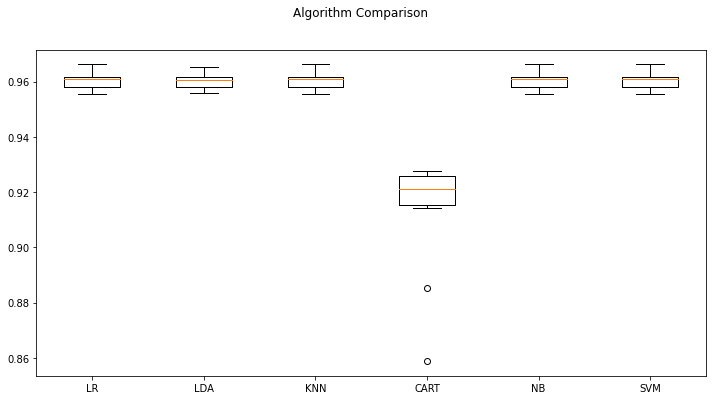

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:296: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning


LR: 0.960431 (0.002873)


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:296: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning


LDA: 0.960076 (0.002604)


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:296: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning


KNN: 0.960431 (0.002873)


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:296: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning


CART: 0.915088 (0.024078)


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:296: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning


NB: 0.960431 (0.002873)


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:296: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning


SVM: 0.960431 (0.002873)


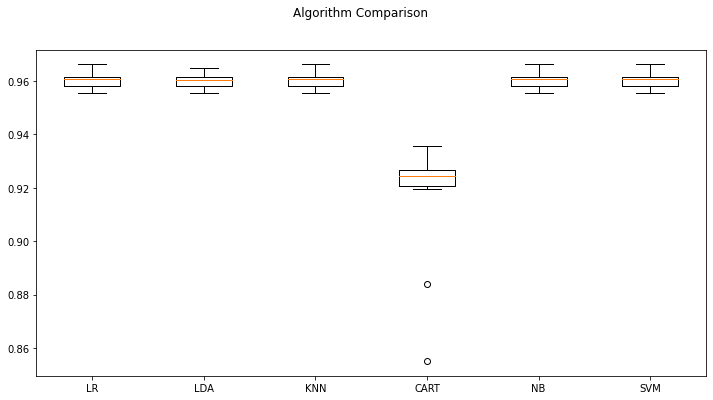

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:296: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning


LR: 0.960431 (0.002873)


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:296: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning


LDA: 0.960024 (0.002798)


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:296: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning


KNN: 0.960431 (0.002873)


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:296: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning


CART: 0.911510 (0.028419)


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:296: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning


NB: 0.960431 (0.002873)


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:296: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning


SVM: 0.960431 (0.002873)


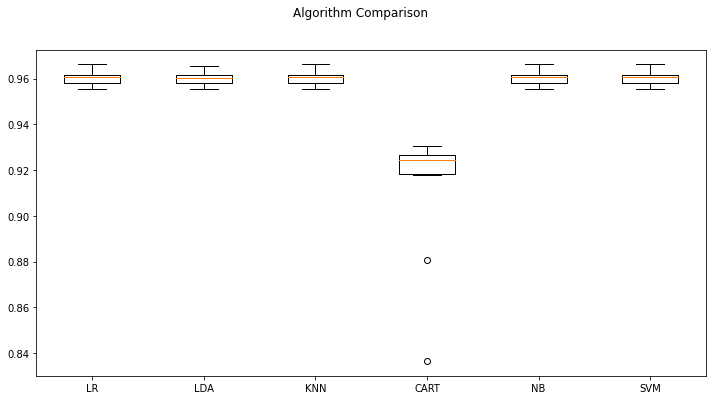

In [ ]:
for data in data_transformed:
  if 'ID' not in data:
    data.insert(1,'ID',train_data['ID'])
  results,names = model_evaluation(data,train_data["TARGET"])
  algo_plotting(results,names)

In [ ]:
scoring = ['accuracy', 'precision','recall','roc_auc']

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:296: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning


LR: 0.960431 (0.002873)


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:296: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning


LDA: 0.960129 (0.002660)


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:296: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning


KNN: 0.960431 (0.002873)


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:296: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning


DecisionTree: 0.912760 (0.021104)


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:296: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning


NaiveBayes: 0.960431 (0.002873)


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:296: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning


SVM: 0.960431 (0.002873)


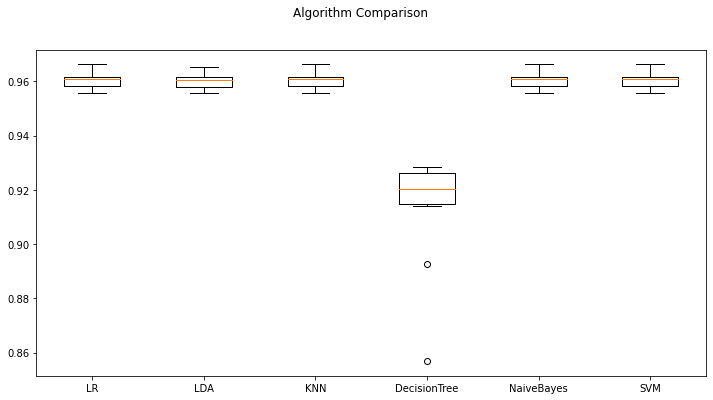

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:296: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set

LR: 0.000000 (0.000000)
LDA: 0.345769 (0.235524)


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:296: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set

KNN: 0.000000 (0.000000)
DecisionTree: 0.115460 (0.024147)


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:296: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set

NaiveBayes: 0.000000 (0.000000)


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined a

SVM: 0.000000 (0.000000)


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


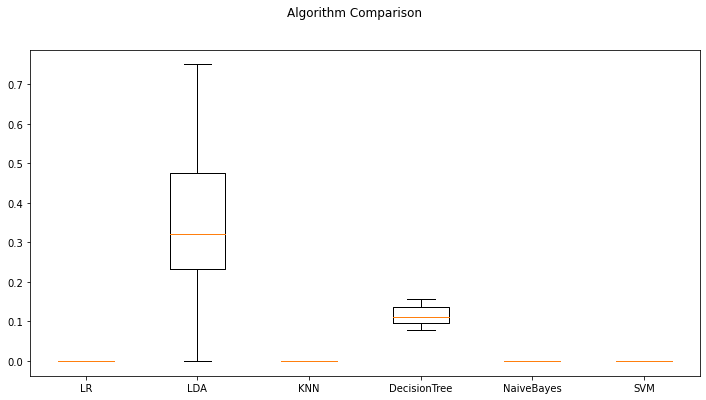

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:296: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning


LR: 0.000000 (0.000000)


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:296: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning


LDA: 0.006293 (0.004023)


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:296: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning


KNN: 0.000000 (0.000000)


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:296: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning


DecisionTree: 0.173974 (0.052782)


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:296: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning


NaiveBayes: 0.000000 (0.000000)


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:296: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning


SVM: 0.000000 (0.000000)


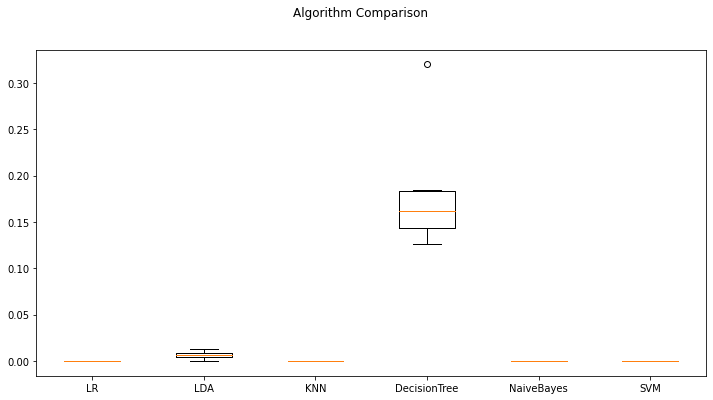

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:296: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning


LR: 0.500677 (0.016243)


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:296: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning


LDA: 0.731758 (0.017481)


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:296: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning


KNN: 0.497273 (0.009024)


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:296: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning


DecisionTree: 0.558329 (0.019258)


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:296: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning


NaiveBayes: 0.501850 (0.018644)


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:296: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning


SVM: 0.498722 (0.015124)


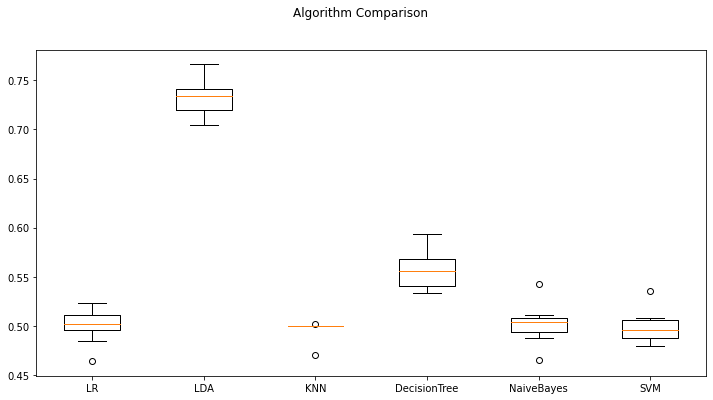

In [ ]:
for score in scoring:
  if 'ID' not in data_transformed[0]:
    data_transformed[0].insert(1,'ID',train_data['ID'])
  results,names = model_evaluation(data_transformed[0],train_data["TARGET"],score)
  algo_plotting(results,names)

In [ ]:
X = upsampled_data[0].drop("TARGET",axis=1)
y = upsampled_data[0]["TARGET"]

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2,random_state=43)

In [ ]:
# Default logistic regression
model_LR= LogisticRegression()
model_LR.fit(X_train,y_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [ ]:
y_prob = model_LR.predict_proba(X_test)[:,1] # This will give you positive class prediction probabilities  
y_pred = np.where(y_prob > 0.5, 1, 0) # This will threshold the probabilities to give class predictions.
model_LR.score(X_test, y_pred)

1.0

In [ ]:
from sklearn import metrics

In [ ]:
confusion_matrix=metrics.confusion_matrix(y_test,y_pred)
confusion_matrix

array([[14531,     0],
       [14674,     0]])

In [ ]:
auc_roc=metrics.roc_auc_score(y_test,y_pred)
auc_roc

0.5

In [ ]:
from sklearn.metrics import roc_curve, auc
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_prob)
roc_auc = auc(false_positive_rate, true_positive_rate)
roc_auc

0.6068978901981745

Text(0.5, 0, 'False Positive Rate')

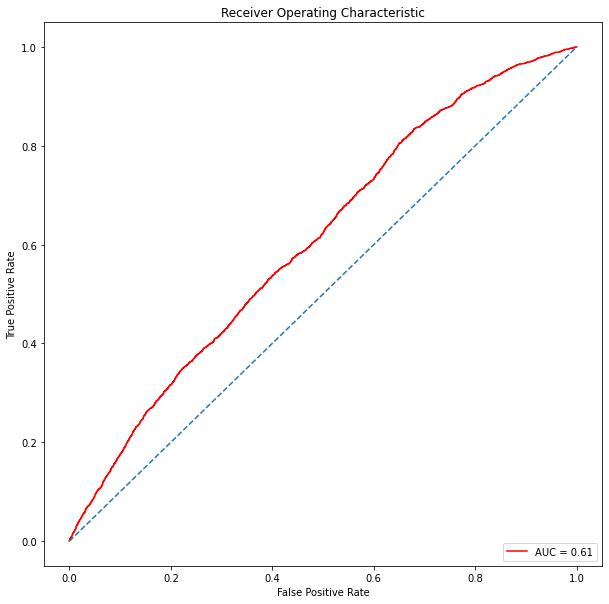

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(10,10))
plt.title('Receiver Operating Characteristic')
plt.plot(false_positive_rate,true_positive_rate, color='red',label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],linestyle='--')
plt.axis('tight')
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')

## Hyper parameter tuning

In [ ]:
# logistic regression tuned model
LR_model= LogisticRegression()

tuned_parameters = {'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000] ,
              'penalty':['l1','l2']
                   }

In [ ]:
from sklearn.model_selection import GridSearchCV

LR= GridSearchCV(LR_model, tuned_parameters,cv=10)

In [ ]:
LR.fit(X_train,y_train)

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Solver lbfgs supports only 'l2' or 'none' penalties, got l1 penalty.

  FitFailedWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Solver lbfgs supports only 'l2' or 'none' penalties, got l1 penalty.

  FitFailedWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Solver lbfgs supports only 'l2' or 'none' penalties, got l1 penalty.

  FitFailedWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/model_se

GridSearchCV(cv=10, error_score=nan,
             estimator=LogisticRegression(C=1.0, class_weight=None, dual=False,
                                          fit_intercept=True,
                                          intercept_scaling=1, l1_ratio=None,
                                          max_iter=100, multi_class='auto',
                                          n_jobs=None, penalty='l2',
                                          random_state=None, solver='lbfgs',
                                          tol=0.0001, verbose=0,
                                          warm_start=False),
             iid='deprecated', n_jobs=None,
             param_grid={'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000],
                         'penalty': ['l1', 'l2']},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

In [ ]:
print(LR.best_params_)

{'C': 0.001, 'penalty': 'l2'}


In [ ]:
y_prob = LR.predict_proba(X_test)[:,1] # This will give you positive class prediction probabilities  
y_pred = np.where(y_prob > 0.5, 1, 0) # This will threshold the probabilities to give class predictions.
LR.score(X_test, y_pred)

1.0

In [ ]:
confusion_matrix=metrics.confusion_matrix(y_test,y_pred)
confusion_matrix

array([[14531,     0],
       [14674,     0]])

In [ ]:
auc_roc=metrics.classification_report(y_test,y_pred)
auc_roc

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


'              precision    recall  f1-score   support\n\n           0       0.50      1.00      0.66     14531\n           1       0.00      0.00      0.00     14674\n\n    accuracy                           0.50     29205\n   macro avg       0.25      0.50      0.33     29205\nweighted avg       0.25      0.50      0.33     29205\n'

In [ ]:
auc_roc=metrics.roc_auc_score(y_test,y_pred)
auc_roc

0.5

In [ ]:
from sklearn.metrics import roc_curve, auc
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_prob)
roc_auc = auc(false_positive_rate, true_positive_rate)
roc_auc

0.6068978901981745

In [ ]:
print("Number of mislabeled points from %d points : %d"
      % (X_test.shape[0],(y_test!= y_pred).sum()))

Number of mislabeled points from 15204 points : 604


Even after hyper tuning the parameters , there is no improvement in the scores with the logistic regression model

## Feature Selection

In [ ]:
if 'ID' not in data_transformed[0]:
    data_transformed[0].insert(1,'ID',train_data['ID'])
x_pca = data_transformed[0]
y_pca = train_data["TARGET"]

In [ ]:
x_upsample = upsampled_data[0].drop("TARGET",axis=1)
y_upsample = upsampled_data[0]["TARGET"]

In [ ]:
x = datasets[0].drop("TARGET",axis=1)
y = datasets[0]["TARGET"]

In [ ]:
print(x_pca.shape,y_pca.shape,x_upsample.shape,y_upsample.shape,x.shape,y.shape)

(76020, 49) (76020,) (146024, 214) (146024,) (76020, 214) (76020,)


In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.30, random_state=44)
X_pca_train, X_pca_test, y_pca_train, y_pca_test = train_test_split(x_pca, y_pca, test_size=0.30, random_state=44)
X_upsample_train, X_upsample_test, y_upsample_train, y_upsample_test = train_test_split(x_upsample, y_upsample, test_size=0.30, random_state=44)

Using upsampled dataset

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import SelectFromModel

Using randomforest to find the important features by using select model which will select features having high importance than the mean importance of the dataset

In [ ]:
sel_ = SelectFromModel(RandomForestClassifier(n_estimators=100))
sel_.fit(X_train.fillna(0), y_train)

SelectFromModel(estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                                 class_weight=None,
                                                 criterion='gini',
                                                 max_depth=None,
                                                 max_features='auto',
                                                 max_leaf_nodes=None,
                                                 max_samples=None,
                                                 min_impurity_decrease=0.0,
                                                 min_impurity_split=None,
                                                 min_samples_leaf=1,
                                                 min_samples_split=2,
                                                 min_weight_fraction_leaf=0.0,
                                                 n_estimators=100, n_jobs=None,
                                                 oob_score=False,

In [ ]:
selected_features = X_train.columns[(sel_.get_support())]
len(selected_features)

23

In [ ]:
X_train_new = X_train[selected_features]

## Model analysis using specific features

In [ ]:
from sklearn import metrics
from sklearn.metrics import classification_report,confusion_matrix
from sklearn.model_selection import cross_val_score 
from sklearn.metrics import f1_score,roc_curve,roc_auc_score,precision_score,recall_score,accuracy_score

In [ ]:
# utility function that will plot scores of different models
def plotModelScores():
  dfm = pd.DataFrame(ModelList)
  f = dfm.loc[dfm['class'] == 1]
  f = f.set_index('ModelName')
  f.pop('class')
  R = dfm.loc[dfm['class'] == 0]
  R = R.set_index('ModelName')
  R.pop('class')
 
  plt.figure(figsize = (15,5))
  sns.heatmap(R.iloc[:-1, :], annot=True, cmap=sns.diverging_palette(20, 220, n=200),linewidth=2)
  plt.title('Class= 0')
  plt.show()
  plt.figure(figsize = (15,5))
  sns.heatmap(f.iloc[:-1, :], annot=True, cmap=sns.diverging_palette(20, 220, n=200),linewidth=2)
  plt.title('Class=1')
  plt.show()

In [ ]:
'''def plot_roc_curve(y_test,y_prob):
  fpr, tpr, thresholds = metrics.roc_curve(y_test, y_prob)
  plt.plot(fpr, tpr)
  plt.xlim([0.0, 1.0])
  plt.ylim([0.0, 1.0])
  plt.rcParams['font.size'] = 12
  plt.title('ROC curve for Santander customer satisfaction classifier')
  plt.xlabel('False Positive Rate (1 - Specificity)')
  plt.ylabel('True Positive Rate (Sensitivity)')
  plt.grid(True)

  plt.figure(figsize=(10,10))
  plt.title('Receiver Operating Characteristic')
  plt.plot(fpr,tpr, color='red',label = 'AUC = %0.2f' % roc_auc)
  plt.legend(loc = 'lower right')
  plt.plot([0, 1], [0, 1],linestyle='--')
  plt.axis('tight')
  plt.ylabel('True Positive Rate')
  plt.xlabel('False Positive Rate')'''
def plot_roc_curve(y_test, prob_dict):
  sns.set_style('whitegrid')
  plt.figure()
  i=0
  fig, ax = plt.subplots(4,2,figsize=(16,30))
  for key,prob in prob_dict.items():
    fpr, tpr, thresholds = metrics.roc_curve( y_test, prob,
                                                  drop_intermediate = False )
    roc_auc = metrics.roc_auc_score( y_test, prob)
    i+= 1
    plt.subplot(4,2,i)
    plt.plot( fpr, tpr, color='red',label='ROC curve (area = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1], linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.axis('tight')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(key)
  plt.show()

In [ ]:
def model_comparison_plot(model_metrics):
  plt.figure(figsize = (12,4))
  sns.heatmap(model_metrics, annot=True, cmap=sns.light_palette((210, 90, 60), input="husl"),linewidth=2)
  plt.title('Metrics comparison for diff models')
  plt.show()

In [ ]:
def model_analysis(title,x_train,y_train,x_test,y_test):
  df_scores=pd.DataFrame()
  pred_dict={}
  for name,model in models:
    model.fit(x_train,y_train)
    y_pred = model.predict(x_test)
    #y_pred_prob = model.predict_proba(x_test)
    pred_dict[name] = y_pred
    #print("Classification model %s metrics :"%(name))
    confusion = confusion_matrix(y_test,y_pred)
    TP = confusion[1, 1]
    TN = confusion[0, 0]
    FP = confusion[0, 1]
    FN = confusion[1, 0]
    #print("Confusion matrix : \n",confusion)
    #print(classification_report(y_test,y_pred))
    accuracy = metrics.accuracy_score(y_test, y_pred)
    #print(" %s accuracy : " %(name),accuracy)
    error = 1-accuracy
    #print(" %s Error : "%(name), error)
    sensitivity = TP / float(FN + TP)
    #print("Sensitivity or recall score : ",sensitivity)
    specificity = TN / (TN + FP)
    #print("Specificity : ",specificity)
    False_positive_rate = 1-specificity
    #print("False positive rate : ", False_positive_rate)
    precision = TP / float(TP + FP)
    #print("Precision : ",precision)
    bal_acc = metrics.balanced_accuracy_score(y_test, y_pred)
     # Accuracy that a dumb model will predict is Null accuracy
    Null_accuracy = max(y_test.mean(), (1 - y_test.mean()))
    f1 = metrics.f1_score(y_test,y_pred)
    auc_score = metrics.roc_auc_score(y_test,y_pred)
    #print("Null accuracy :" , Null_accuracy)
    clf_score = pd.DataFrame(
        {name: [accuracy, bal_acc, Null_accuracy,precision,sensitivity,f1,error,specificity,auc_score]},
        index=['Accuracy', 'Balanced accuracy','Null_accuracy','precision','recall','f1 score','error','specificity','auc_score']
    )
   
    df_scores = pd.concat([df_scores, clf_score], axis=1).round(decimals=3)
    # commenting cross_val_score as it is taking more time
    #print("cross validation score: ",cross_val_score(model, x_train, y_train, cv=10, scoring='roc_auc').mean())
    #print("F1 score: " ,metrics.f1_score(y_test,y_pred))
    #print("Roc_auc score : ",metrics.roc_auc_score(y_test,y_pred))
    #print("Roc curve for %s"%(name))
    #y_prob = model.predict_proba(x_test)
  print("Roc_curve for all models")
  plot_roc_curve(y_test,pred_dict)
  print(title,end='\n\n')
  print(df_scores.to_markdown(),end='\n\n')
  model_comparison_plot(df_scores)
  return df_scores

In [ ]:
# prints sensitivity and specificity based on the given threshold
def evaluate_threshold(threshold):
    print('Sensitivity:', tpr[thresholds > threshold][-1])
    print('Specificity:', 1 - fpr[thresholds > threshold][-1])

In [ ]:
df_scores=pd.DataFrame()

In [ ]:
y_train

26094    0
65413    0
50666    0
31384    0
47950    0
        ..
53123    0
49723    0
25773    0
69027    0
14100    0
Name: TARGET, Length: 53214, dtype: int64

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:27: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:27: RuntimeWarning: invalid value encountered in true_divide


Roc_curve for all models


<Figure size 432x288 with 0 Axes>

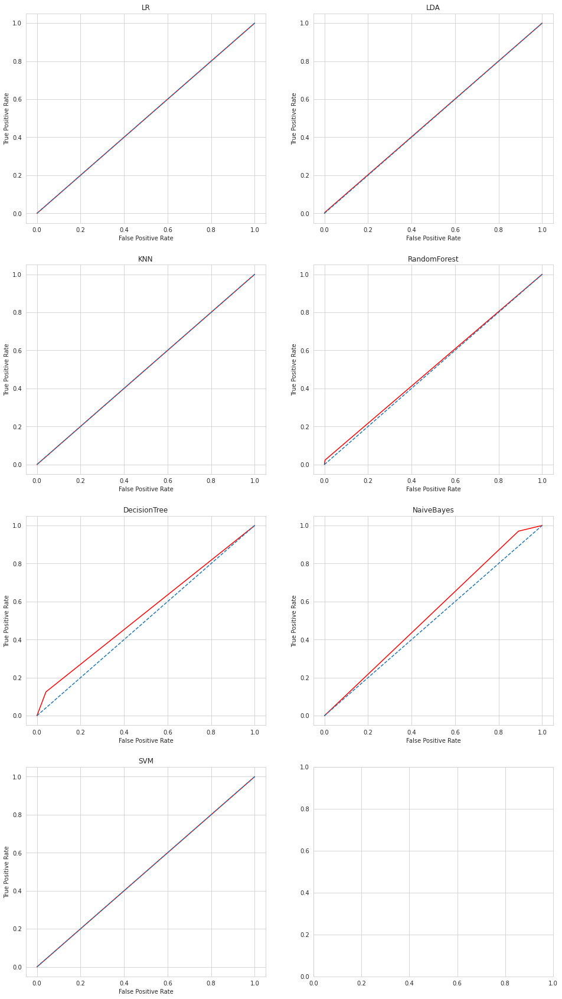

models with original data and selected features

|                   |      LR |   LDA |   KNN |   RandomForest |   DecisionTree |   NaiveBayes |     SVM |
|:------------------|--------:|------:|------:|---------------:|---------------:|-------------:|--------:|
| Accuracy          |   0.961 | 0.959 | 0.96  |          0.959 |          0.926 |        0.143 |   0.961 |
| Balanced accuracy |   0.5   | 0.502 | 0.5   |          0.51  |          0.542 |        0.539 |   0.5   |
| Null_accuracy     |   0.961 | 0.961 | 0.961 |          0.961 |          0.961 |        0.961 |   0.961 |
| precision         | nan     | 0.094 | 0.043 |          0.266 |          0.111 |        0.043 | nan     |
| recall            |   0     | 0.006 | 0.001 |          0.023 |          0.126 |        0.97  |   0     |
| f1 score          |   0     | 0.01  | 0.002 |          0.043 |          0.118 |        0.082 |   0     |
| error             |   0.039 | 0.041 | 0.04  |          0.041 |          0.074 |        0.857 

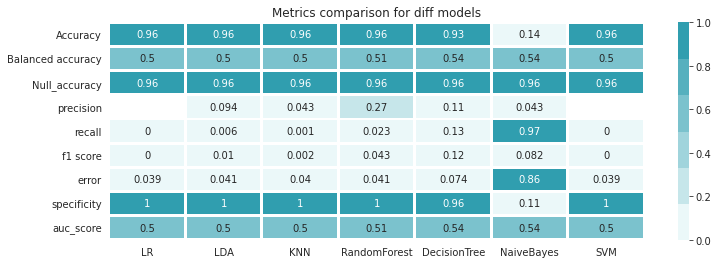

                      LR    LDA    KNN  ...  DecisionTree  NaiveBayes    SVM
Accuracy           0.961  0.959  0.960  ...         0.926       0.143  0.961
Balanced accuracy  0.500  0.502  0.500  ...         0.542       0.539  0.500
Null_accuracy      0.961  0.961  0.961  ...         0.961       0.961  0.961
precision            NaN  0.094  0.043  ...         0.111       0.043    NaN
recall             0.000  0.006  0.001  ...         0.126       0.970  0.000
f1 score           0.000  0.010  0.002  ...         0.118       0.082  0.000
error              0.039  0.041  0.040  ...         0.074       0.857  0.039
specificity        1.000  0.998  0.999  ...         0.959       0.109  1.000
auc_score          0.500  0.502  0.500  ...         0.542       0.539  0.500

[9 rows x 7 columns]


In [ ]:
print(model_analysis("models with original data and selected features",X_train[selected_features],y_train,X_test[selected_features],y_test))

If we observe the results, even selected features with original data we are getting good accuracy but very poor precision and recall scores almost for every model

In [ ]:
scalar = StandardScaler()

Model with scaled and upsampled data with selected features

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:27: RuntimeWarning: invalid value encountered in true_divide


Roc_curve for all models


<Figure size 432x288 with 0 Axes>

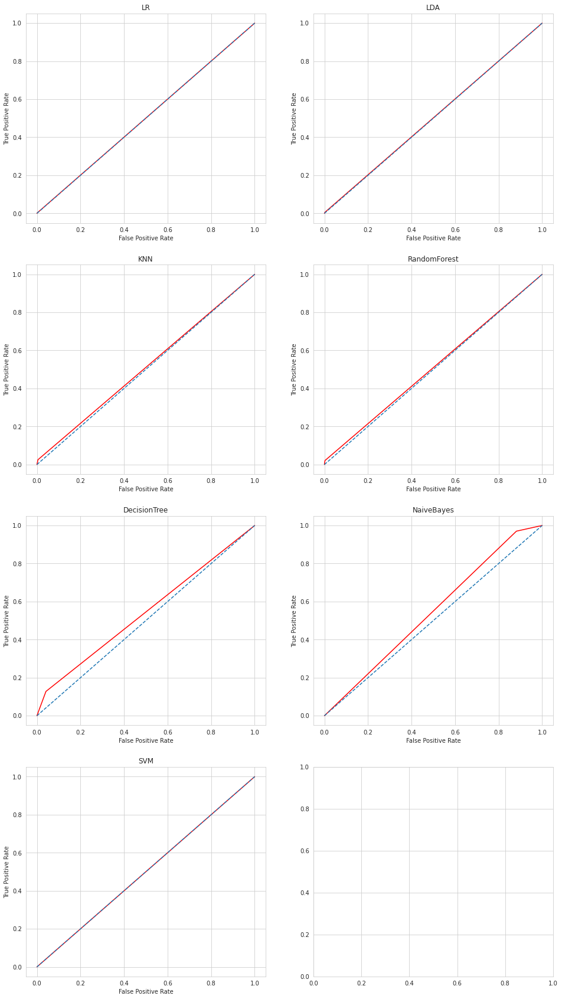

Model with upsampled data and selected features

|                   |    LR |   LDA |   KNN |   RandomForest |   DecisionTree |   NaiveBayes |     SVM |
|:------------------|------:|------:|------:|---------------:|---------------:|-------------:|--------:|
| Accuracy          | 0.96  | 0.959 | 0.957 |          0.959 |          0.926 |        0.152 |   0.961 |
| Balanced accuracy | 0.501 | 0.502 | 0.51  |          0.509 |          0.543 |        0.544 |   0.5   |
| Null_accuracy     | 0.961 | 0.961 | 0.961 |          0.961 |          0.961 |        0.961 |   0.961 |
| precision         | 0.333 | 0.094 | 0.177 |          0.247 |          0.112 |        0.043 | nan     |
| recall            | 0.001 | 0.006 | 0.026 |          0.021 |          0.128 |        0.97  |   0     |
| f1 score          | 0.002 | 0.01  | 0.045 |          0.039 |          0.12  |        0.083 |   0     |
| error             | 0.04  | 0.041 | 0.043 |          0.041 |          0.074 |        0.848 |   0.039 |
| spec

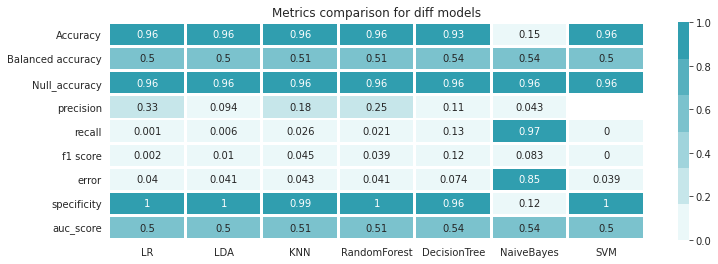

                      LR    LDA    KNN  ...  DecisionTree  NaiveBayes    SVM
Accuracy           0.960  0.959  0.957  ...         0.926       0.152  0.961
Balanced accuracy  0.501  0.502  0.510  ...         0.543       0.544  0.500
Null_accuracy      0.961  0.961  0.961  ...         0.961       0.961  0.961
precision          0.333  0.094  0.177  ...         0.112       0.043    NaN
recall             0.001  0.006  0.026  ...         0.128       0.970  0.000
f1 score           0.002  0.010  0.045  ...         0.120       0.083  0.000
error              0.040  0.041  0.043  ...         0.074       0.848  0.039
specificity        1.000  0.998  0.995  ...         0.959       0.118  1.000
auc_score          0.501  0.502  0.510  ...         0.543       0.544  0.500

[9 rows x 7 columns]


In [ ]:
print(model_analysis("Model with upsampled data and selected features",scalar.fit_transform(X_train[selected_features]),y_train,scalar.transform(X_test[selected_features]),y_test))

If we observe the results, with scaled data,selected features with original data we are getting good accuracy and little important in precision and recall scores almost for every model compared to models without the scaled data

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


Roc_curve for all models


<Figure size 432x288 with 0 Axes>

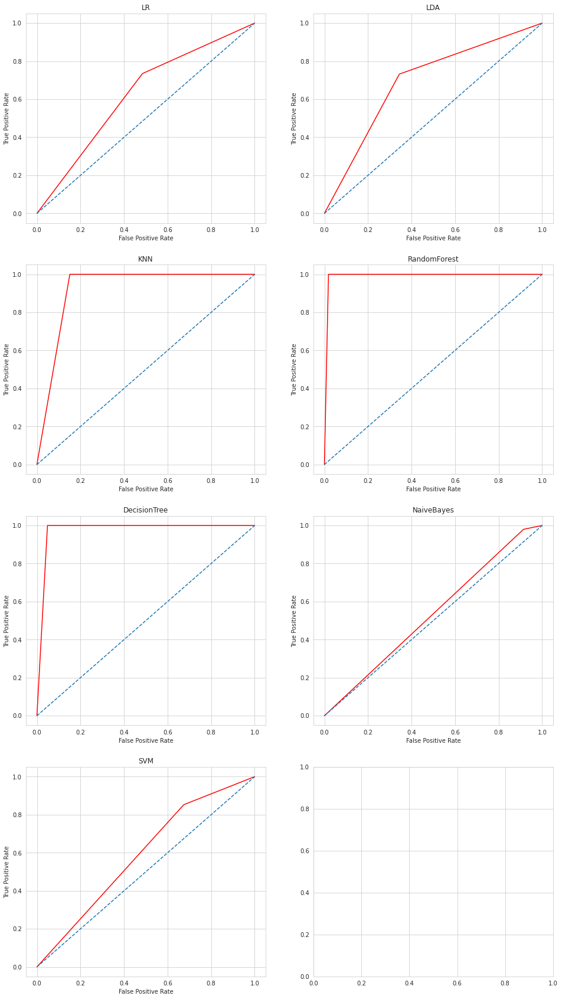

Model with upsampled data and selected features

|                   |    LR |   LDA |   KNN |   RandomForest |   DecisionTree |   NaiveBayes |   SVM |
|:------------------|------:|------:|------:|---------------:|---------------:|-------------:|------:|
| Accuracy          | 0.625 | 0.694 | 0.924 |          0.991 |          0.976 |        0.533 | 0.589 |
| Balanced accuracy | 0.625 | 0.694 | 0.924 |          0.991 |          0.976 |        0.533 | 0.589 |
| Null_accuracy     | 0.5   | 0.5   | 0.5   |          0.5   |          0.5   |        0.5   | 0.5   |
| precision         | 0.602 | 0.68  | 0.869 |          0.982 |          0.954 |        0.517 | 0.558 |
| recall            | 0.735 | 0.732 | 1     |          1     |          1     |        0.98  | 0.853 |
| f1 score          | 0.662 | 0.705 | 0.93  |          0.991 |          0.976 |        0.677 | 0.675 |
| error             | 0.375 | 0.306 | 0.076 |          0.009 |          0.024 |        0.467 | 0.411 |
| specificity       | 0.

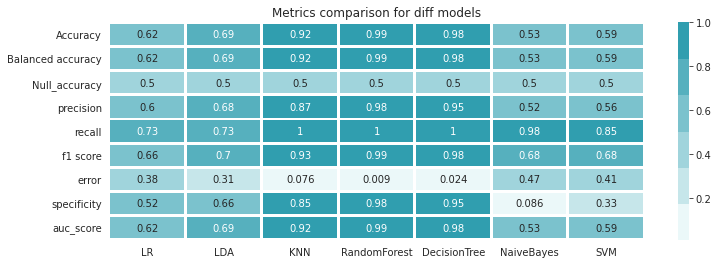

                      LR    LDA    KNN  ...  DecisionTree  NaiveBayes    SVM
Accuracy           0.625  0.694  0.924  ...         0.976       0.533  0.589
Balanced accuracy  0.625  0.694  0.924  ...         0.976       0.533  0.589
Null_accuracy      0.500  0.500  0.500  ...         0.500       0.500  0.500
precision          0.602  0.680  0.869  ...         0.954       0.517  0.558
recall             0.735  0.732  1.000  ...         1.000       0.980  0.853
f1 score           0.662  0.705  0.930  ...         0.976       0.677  0.675
error              0.375  0.306  0.076  ...         0.024       0.467  0.411
specificity        0.515  0.656  0.849  ...         0.951       0.086  0.326
auc_score          0.625  0.694  0.924  ...         0.976       0.533  0.589

[9 rows x 7 columns]


In [ ]:
print(model_analysis("Model with upsampled data and selected features",X_upsample_train[selected_features],y_upsample_train,X_upsample_test[selected_features],y_upsample_test))

If we observe above model scores with upsampled data and selected features, random forest, KNN and decision tree models are performing well across all metrics.

In [ ]:
classifier_wo.score

<bound method ClassifierMixin.score of LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)>

## Model analysis with full data 

Data with removing constant,approx constants and duplicate columns from the original data

Roc_curve for all models


<Figure size 432x288 with 0 Axes>

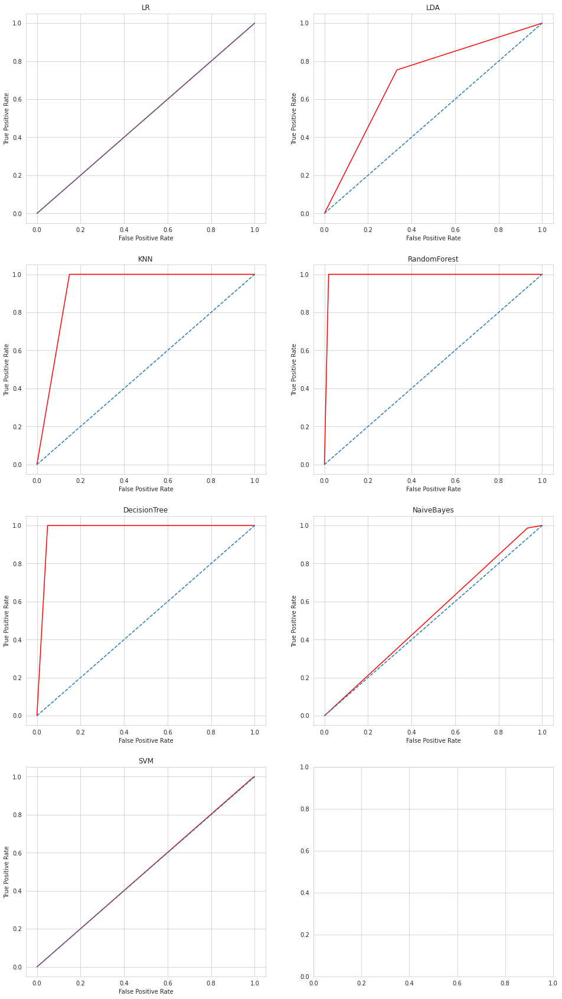

Model with upsampled data

|                   |   LR |   LDA |   KNN |   RandomForest |   DecisionTree |   NaiveBayes |   SVM |
|:------------------|-----:|------:|------:|---------------:|---------------:|-------------:|------:|
| Accuracy          |  0.5 | 0.71  | 0.925 |          0.99  |          0.976 |        0.527 | 0.502 |
| Balanced accuracy |  0.5 | 0.71  | 0.925 |          0.99  |          0.976 |        0.527 | 0.502 |
| Null_accuracy     |  0.5 | 0.5   | 0.5   |          0.5   |          0.5   |        0.5   | 0.5   |
| precision         |  0   | 0.694 | 0.87  |          0.981 |          0.953 |        0.514 | 0.501 |
| recall            |  0   | 0.754 | 1     |          1     |          1     |        0.987 | 0.998 |
| f1 score          |  0   | 0.722 | 0.93  |          0.99  |          0.976 |        0.676 | 0.667 |
| error             |  0.5 | 0.29  | 0.075 |          0.01  |          0.024 |        0.473 | 0.498 |
| specificity       |  1   | 0.667 | 0.851 |          0

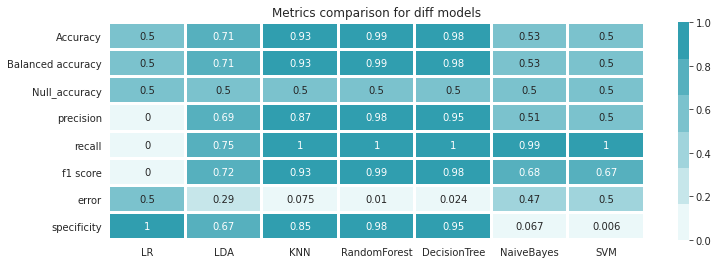

                    LR    LDA    KNN  ...  DecisionTree  NaiveBayes    SVM
Accuracy           0.5  0.710  0.925  ...         0.976       0.527  0.502
Balanced accuracy  0.5  0.710  0.925  ...         0.976       0.527  0.502
Null_accuracy      0.5  0.500  0.500  ...         0.500       0.500  0.500
precision          0.0  0.694  0.870  ...         0.953       0.514  0.501
recall             0.0  0.754  1.000  ...         1.000       0.987  0.998
f1 score           0.0  0.722  0.930  ...         0.976       0.676  0.667
error              0.5  0.290  0.075  ...         0.024       0.473  0.498
specificity        1.0  0.667  0.851  ...         0.951       0.067  0.006

[8 rows x 7 columns]


In [ ]:
print(model_analysis("Model with upsampled data",X_upsample_train,y_upsample_train,X_upsample_test,y_upsample_test))

Observing above model scores with full upsampled data, we can see almost all models are performing similar as model with specific features. RandomForest is performing well with good metrics

In [ ]:
print(model_analysis("Model with original data",X_train,y_train,X_test,y_test))

In [ ]:
print(model_analysis("Model with pca data",X_pca_train,y_pca_train,X_pca_test,y_pca_test))

Model analysis with data after removing low variance and high correlated features

In [ ]:
if 'ID' not in data_transformed[2]:
    data_transformed[2].insert(1,'ID',train_data['ID'])
x_pca = data_transformed[2]
y_pca = train_data["TARGET"]

In [ ]:
x_upsample = upsampled_data[2].drop("TARGET",axis=1)
y_upsample = upsampled_data[2]["TARGET"]

In [ ]:
x = datasets[2].drop("TARGET",axis=1)
y = datasets[2]["TARGET"]

In [ ]:
from sklearn.model_selection import train_test_split
X_train_2, X_test_2, y_train_2, y_test_2 = train_test_split(x, y, test_size=0.30, random_state=44)
X_pca_train_2, X_pca_test_2, y_pca_train_2, y_pca_test_2 = train_test_split(x_pca, y_pca, test_size=0.30, random_state=44)
X_upsample_train_2, X_upsample_test_2, y_upsample_train_2, y_upsample_test_2 = train_test_split(x_upsample, y_upsample, test_size=0.30, random_state=44)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in true_divide


Roc_curve for all models


<Figure size 432x288 with 0 Axes>

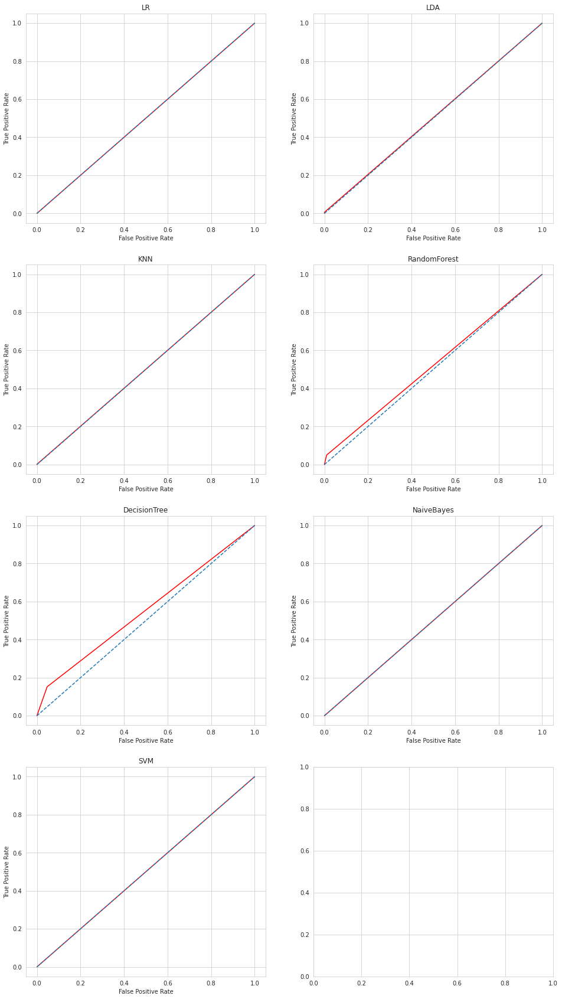

Model with pca data

|                   |      LR |   LDA |   KNN |   RandomForest |   DecisionTree |   NaiveBayes |     SVM |
|:------------------|--------:|------:|------:|---------------:|---------------:|-------------:|--------:|
| Accuracy          |   0.961 | 0.96  | 0.96  |          0.953 |          0.921 |        0.961 |   0.961 |
| Balanced accuracy |   0.5   | 0.503 | 0.501 |          0.52  |          0.553 |        0.5   |   0.5   |
| Null_accuracy     |   0.961 | 0.961 | 0.961 |          0.961 |          0.961 |        0.961 |   0.961 |
| precision         | nan     | 0.222 | 0.105 |          0.167 |          0.117 |      nan     | nan     |
| recall            |   0     | 0.007 | 0.002 |          0.05  |          0.152 |        0     |   0     |
| f1 score          |   0     | 0.013 | 0.004 |          0.077 |          0.133 |        0     |   0     |
| error             |   0.039 | 0.04  | 0.04  |          0.047 |          0.079 |        0.039 |   0.039 |
| specificity   

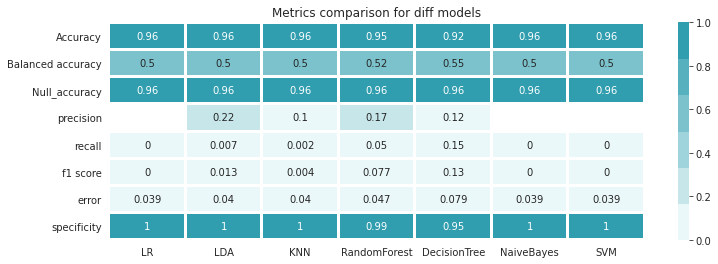

                      LR    LDA    KNN  ...  DecisionTree  NaiveBayes    SVM
Accuracy           0.961  0.960  0.960  ...         0.921       0.961  0.961
Balanced accuracy  0.500  0.503  0.501  ...         0.553       0.500  0.500
Null_accuracy      0.961  0.961  0.961  ...         0.961       0.961  0.961
precision            NaN  0.222  0.105  ...         0.117         NaN    NaN
recall             0.000  0.007  0.002  ...         0.152       0.000  0.000
f1 score           0.000  0.013  0.004  ...         0.133       0.000  0.000
error              0.039  0.040  0.040  ...         0.079       0.039  0.039
specificity        1.000  0.999  0.999  ...         0.953       1.000  1.000

[8 rows x 7 columns]


In [ ]:
print(model_analysis("Model with pca data",X_pca_train_2,y_pca_train_2,X_pca_test_2,y_pca_test_2))

Even with the pca applied to the data, we didn't see good performance in the models with respect to recall and precision scores.

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in true_divide


Roc_curve for all models


<Figure size 432x288 with 0 Axes>

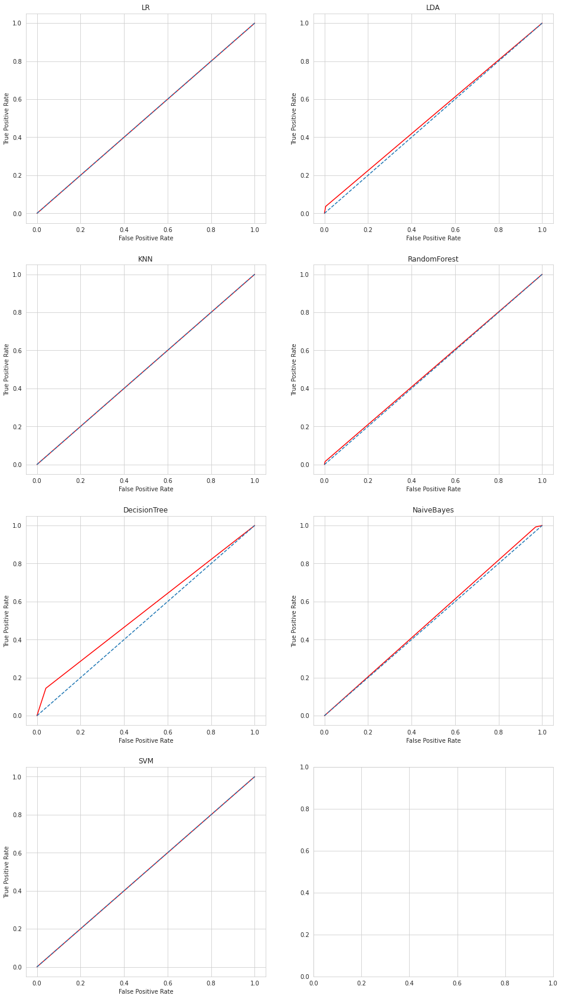

Model with normal data

|                   |      LR |   LDA |   KNN |   RandomForest |   DecisionTree |   NaiveBayes |     SVM |
|:------------------|--------:|------:|------:|---------------:|---------------:|-------------:|--------:|
| Accuracy          |   0.961 | 0.956 | 0.96  |          0.958 |          0.927 |        0.068 |   0.961 |
| Balanced accuracy |   0.5   | 0.515 | 0.5   |          0.506 |          0.552 |        0.511 |   0.5   |
| Null_accuracy     |   0.961 | 0.961 | 0.961 |          0.961 |          0.961 |        0.961 |   0.961 |
| precision         | nan     | 0.204 | 0.05  |          0.175 |          0.126 |        0.04  | nan     |
| recall            |   0     | 0.037 | 0.001 |          0.016 |          0.144 |        0.992 |   0     |
| f1 score          |   0     | 0.062 | 0.002 |          0.029 |          0.135 |        0.078 |   0     |
| error             |   0.039 | 0.044 | 0.04  |          0.042 |          0.073 |        0.932 |   0.039 |
| specificity

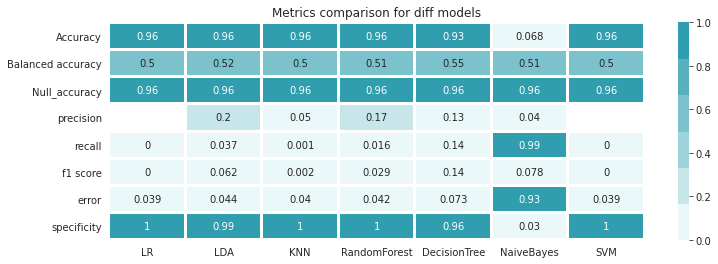

                      LR    LDA    KNN  ...  DecisionTree  NaiveBayes    SVM
Accuracy           0.961  0.956  0.960  ...         0.927       0.068  0.961
Balanced accuracy  0.500  0.515  0.500  ...         0.552       0.511  0.500
Null_accuracy      0.961  0.961  0.961  ...         0.961       0.961  0.961
precision            NaN  0.204  0.050  ...         0.126       0.040    NaN
recall             0.000  0.037  0.001  ...         0.144       0.992  0.000
f1 score           0.000  0.062  0.002  ...         0.135       0.078  0.000
error              0.039  0.044  0.040  ...         0.073       0.932  0.039
specificity        1.000  0.994  0.999  ...         0.959       0.030  1.000

[8 rows x 7 columns]


In [ ]:
print(model_analysis("Model with normal data",X_train_2,y_train_2,X_test_2,y_test_2))

After observing the above results, we can say that normal data without pca also giving the similar results as results with pca. We have very low precision and recall values. For us recall metric is very important as we don't want to miss one unhappy customer also.

Roc_curve for all models


<Figure size 432x288 with 0 Axes>

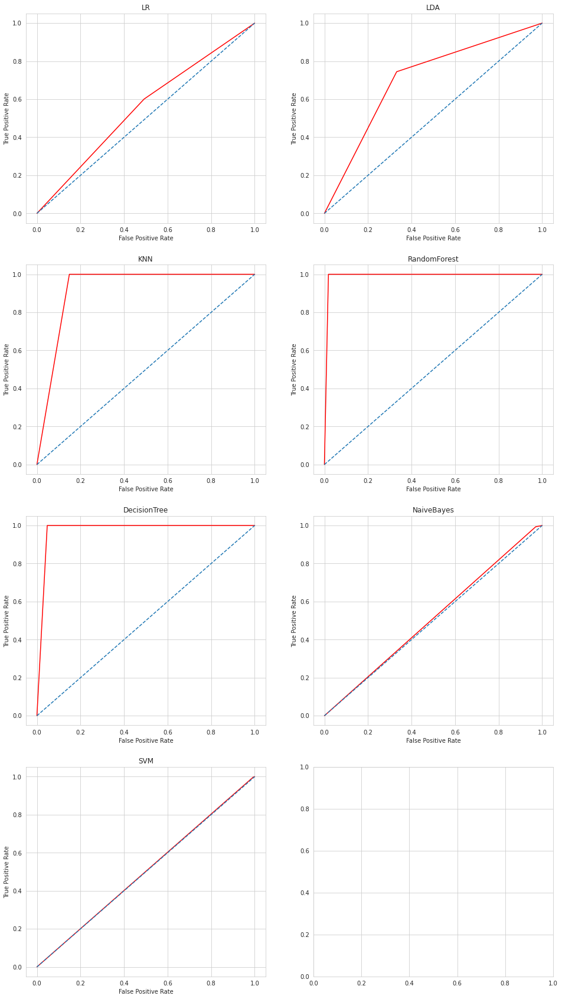

Model with upsampled data

|                   |    LR |   LDA |   KNN |   RandomForest |   DecisionTree |   NaiveBayes |   SVM |
|:------------------|------:|------:|------:|---------------:|---------------:|-------------:|------:|
| Accuracy          | 0.554 | 0.706 | 0.925 |          0.991 |          0.976 |        0.511 | 0.502 |
| Balanced accuracy | 0.554 | 0.706 | 0.925 |          0.991 |          0.976 |        0.511 | 0.502 |
| Null_accuracy     | 0.5   | 0.5   | 0.5   |          0.5   |          0.5   |        0.5   | 0.5   |
| precision         | 0.55  | 0.692 | 0.87  |          0.982 |          0.955 |        0.506 | 0.501 |
| recall            | 0.601 | 0.744 | 1     |          1     |          1     |        0.993 | 0.998 |
| f1 score          | 0.574 | 0.717 | 0.931 |          0.991 |          0.977 |        0.67  | 0.667 |
| error             | 0.446 | 0.294 | 0.075 |          0.009 |          0.024 |        0.489 | 0.498 |
| specificity       | 0.508 | 0.668 | 0.851 | 

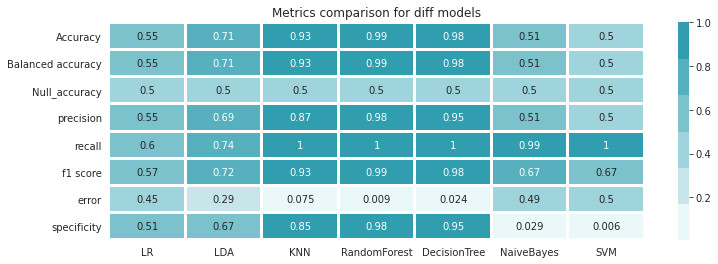

                      LR    LDA    KNN  ...  DecisionTree  NaiveBayes    SVM
Accuracy           0.554  0.706  0.925  ...         0.976       0.511  0.502
Balanced accuracy  0.554  0.706  0.925  ...         0.976       0.511  0.502
Null_accuracy      0.500  0.500  0.500  ...         0.500       0.500  0.500
precision          0.550  0.692  0.870  ...         0.955       0.506  0.501
recall             0.601  0.744  1.000  ...         1.000       0.993  0.998
f1 score           0.574  0.717  0.931  ...         0.977       0.670  0.667
error              0.446  0.294  0.075  ...         0.024       0.489  0.498
specificity        0.508  0.668  0.851  ...         0.953       0.029  0.006

[8 rows x 7 columns]


In [ ]:
print(model_analysis("Model with upsampled data",X_upsample_train_2,y_upsample_train_2,X_upsample_test_2,y_upsample_test_2))

From all the above results, we can say that upsampled data is giving good results with whole data using kNN, random forest and decision tree models

Sample model with upsampled data

In [ ]:
classifier_wo = LogisticRegression() 
classifier_wo.fit(X_upsample_train[selected_features],y_upsample_train)

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [ ]:
y_pred=classifier_wo.predict(X_upsample_test[selected_features])

print(confusion_matrix(y_upsample_test,y_pred))
print(classification_report(y_upsample_test,y_pred))

[[10458 11452]
 [ 6238 15660]]
              precision    recall  f1-score   support

           0       0.63      0.48      0.54     21910
           1       0.58      0.72      0.64     21898

    accuracy                           0.60     43808
   macro avg       0.60      0.60      0.59     43808
weighted avg       0.60      0.60      0.59     43808



In [ ]:
from sklearn.model_selection import train_test_split


The optimal number of PCA's is: 106


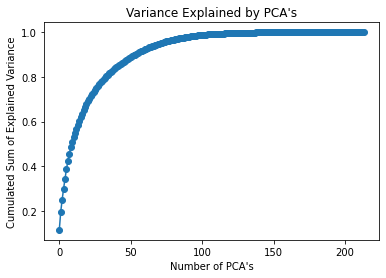

In [ ]:
for data in range(0,1):
  x=datasets[data].drop("TARGET",axis=1)
  y=datasets[data]["TARGET"]
  X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.30, random_state=44)
  pca_analysis_components(X_train)

## Hyper parameter tuning using randomsearch

In [ ]:
from sklearn.model_selection import RandomizedSearchCV

In [ ]:
hyper_tune_param_list=[]

In [ ]:
dual=[True,False]
penalty =['l1', 'l2', 'elasticnet', 'none']
solver = ['lbfgs','newton-cg','liblinear','sag','saga']
max_iter=[100,110,120,130,140]
C = [1.0,1.5,2.0,2.5]
class_weight=['balanced']
hyper_tune_param_list.append(dict(dual=dual,max_iter=max_iter,C=C,penalty=penalty,solver=solver,class_weight=class_weight))

In [ ]:
scalar = StandardScaler()

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
logModel = LogisticRegression(max_iter=10000,class_weight='balanced')

In [ ]:
logModel.fit(scalar.fit_transform(X_train_2), y_train_2)

LogisticRegression(C=1.0, class_weight='balanced', dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=10000, multi_class='auto', n_jobs=None,
                   penalty='l2', random_state=None, solver='lbfgs', tol=0.0001,
                   verbose=0, warm_start=False)

In [ ]:
y_pred = logModel.predict(scalar.transform(X_test_2))

In [ ]:
print(metrics.confusion_matrix(y_test_2,y_pred))

[[15115  6791]
 [  248   652]]


In [ ]:
clf_random = RandomizedSearchCV(logModel, param_distributions = hyper_tune_param_list[0], cv = 3, verbose=True, n_jobs=-1)

In [ ]:
best_clf_random = clf_random.fit(scalar.fit_transform(X_train_2),y_train_2)

Fitting 3 folds for each of 10 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:  5.6min finished
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:1505: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
/usr/local/lib/python3.6/dist-packages/sklearn/utils/optimize.py:212: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  "number of iterations.", ConvergenceWarning)


In [ ]:
best_clf_random.best_estimator_

LogisticRegression(C=2.0, class_weight='balanced', dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='auto', n_jobs=None,
                   penalty='none', random_state=None, solver='newton-cg',
                   tol=0.0001, verbose=0, warm_start=False)

In [ ]:
print(metrics.confusion_matrix(y_test_2,best_clf_random.best_estimator_.predict(scalar.transform(X_test_2))))

[[15135  6771]
 [  251   649]]


In [ ]:
random_forest = RandomForestClassifier(class_weight='balanced',random_state=42,n_jobs=4)

In [ ]:
random_forest.fit(scalar.fit_transform(X_train_2),y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight='balanced',
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=4,
                       oob_score=False, random_state=42, verbose=0,
                       warm_start=False)

In [ ]:
y_pred = random_forest.predict(scalar.transform(X_test_2))

In [ ]:
print(metrics.confusion_matrix(y_test_2,y_pred))

[[21845    61]
 [  883    17]]


In [ ]:
print(metrics.classification_report(y_test_2,y_pred))

              precision    recall  f1-score   support

           0       0.96      1.00      0.98     21906
           1       0.22      0.02      0.03       900

    accuracy                           0.96     22806
   macro avg       0.59      0.51      0.51     22806
weighted avg       0.93      0.96      0.94     22806



In [ ]:
hyper_tune_param_list.append({'n_estimators': [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)],
    'max_features': ['auto', 'sqrt'],
    'max_depth': [int(x) for x in np.linspace(10, 110, num = 11)],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'bootstrap': [True, False],
    'class_weight':['balanced','None']})

In [ ]:
hyper_tune_param_list

[{'C': [1.0, 1.5, 2.0, 2.5],
  'dual': [True, False],
  'max_iter': [100, 110, 120, 130, 140],
  'penalty': ['l1', 'l2', 'elasticnet', 'none'],
  'solver': ['lbfgs', 'newton-cg', 'liblinear', 'sag', 'saga']},
 {'bootstrap': [True, False],
  'class_weight': ['balanced', 'None'],
  'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110],
  'max_features': ['auto', 'sqrt'],
  'min_samples_leaf': [1, 2, 4],
  'min_samples_split': [2, 5, 10],
  'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000]}]

In [ ]:
rf_model_random = RandomizedSearchCV(random_forest, param_distributions = hyper_tune_param_list[1], cv = 3, verbose=True, n_jobs=-1)

In [ ]:
best_rf_random = rf_model_random.fit(scalar.fit_transform(X_train_2),y_train_2)

Fitting 3 folds for each of 10 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
/usr/local/lib/python3.6/dist-packages/joblib/externals/loky/process_executor.py:691: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  "timeout or by a memory leak.", UserWarning
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:  9.3min finished


In [ ]:
print(metrics.confusion_matrix(y_test_2,best_rf_random.best_estimator_.predict(scalar.transform(X_test_2))))

[[21601   305]
 [  824    76]]


In [ ]:
print(metrics.classification_report(y_test_2,best_rf_random.best_estimator_.predict(scalar.transform(X_test_2))))

              precision    recall  f1-score   support

           0       0.96      0.99      0.97     21906
           1       0.20      0.08      0.12       900

    accuracy                           0.95     22806
   macro avg       0.58      0.54      0.55     22806
weighted avg       0.93      0.95      0.94     22806



In [ ]:
best_rf_random.best_params_

{'bootstrap': True,
 'class_weight': 'balanced',
 'max_depth': 50,
 'max_features': 'auto',
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'n_estimators': 1000}

In [ ]:
best_rf_random.best_score_

0.9546172059984214

In [ ]:
y_pred = best_rf_random.best_estimator_.predict(scalar.transform(test_data_hv_co))

In [ ]:
np.count_nonzero(y_pred==0)/len(y_pred)

0.9816138647814503

In [ ]:
np.count_nonzero(y_pred==1)/len(y_pred)

0.018386135218549683

## Model analysis with hyper tune parameters and scaled data

In [ ]:
# Model preparation
hyper_models = []
hyper_models.append(('LR', LogisticRegression(class_weight='balanced')))
hyper_models.append(('LDA', LinearDiscriminantAnalysis(solver='lsqr')))
hyper_models.append(('KNN', KNeighborsClassifier(weights='distance',metric='euclidean')))
hyper_models.append(('RandomForest', RandomForestClassifier(class_weight='balanced',n_estimators = 1000,max_features = 'log2')))
hyper_models.append(('DecisionTree', DecisionTreeClassifier(class_weight='balanced',max_features= 'log2')))
hyper_models.append(('NaiveBayes', GaussianNB()))
hyper_models.append(('SVM', SVC()))

In [ ]:
models = hyper_models


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:27: RuntimeWarning: invalid value encountered in true_divide


Roc_curve for all models


<Figure size 432x288 with 0 Axes>

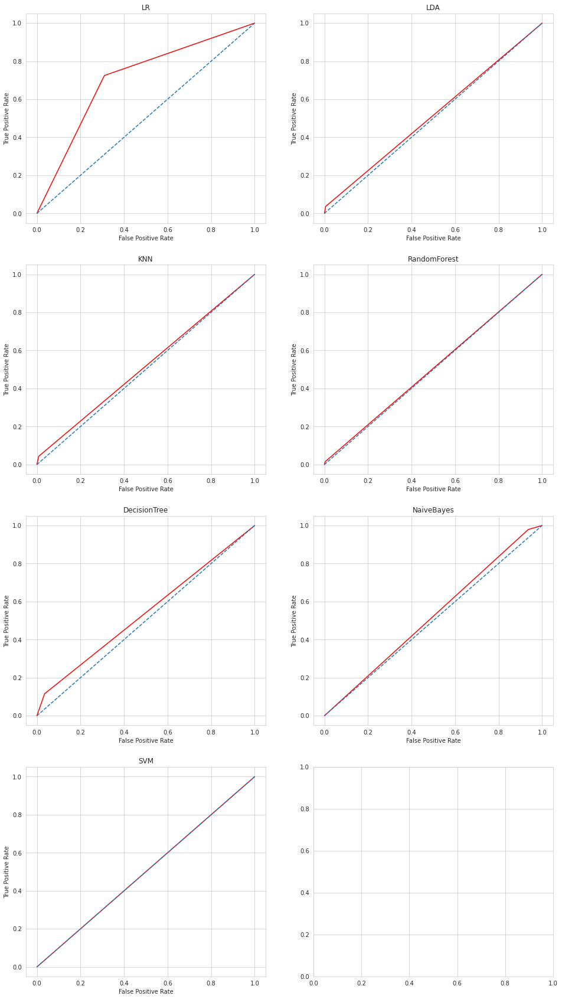

Model with scaled data

|                   |    LR |   LDA |   KNN |   RandomForest |   DecisionTree |   NaiveBayes |     SVM |
|:------------------|------:|------:|------:|---------------:|---------------:|-------------:|--------:|
| Accuracy          | 0.692 | 0.956 | 0.955 |          0.958 |          0.931 |        0.1   |   0.961 |
| Balanced accuracy | 0.707 | 0.515 | 0.518 |          0.506 |          0.54  |        0.521 |   0.5   |
| Null_accuracy     | 0.961 | 0.961 | 0.961 |          0.961 |          0.961 |        0.961 |   0.961 |
| precision         | 0.088 | 0.201 | 0.181 |          0.169 |          0.119 |        0.041 | nan     |
| recall            | 0.724 | 0.037 | 0.043 |          0.014 |          0.116 |        0.979 |   0     |
| f1 score          | 0.156 | 0.062 | 0.07  |          0.027 |          0.117 |        0.079 |   0     |
| error             | 0.308 | 0.044 | 0.045 |          0.042 |          0.069 |        0.9   |   0.039 |
| specificity       | 0.69  | 0

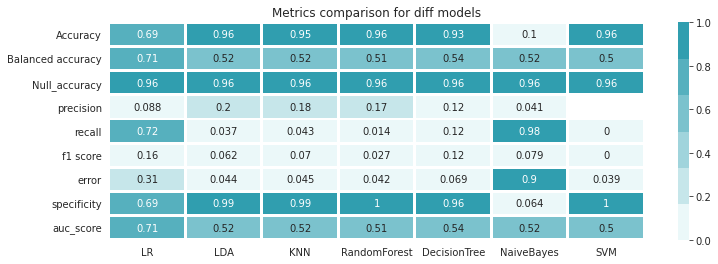

                      LR    LDA    KNN  ...  DecisionTree  NaiveBayes    SVM
Accuracy           0.692  0.956  0.955  ...         0.931       0.100  0.961
Balanced accuracy  0.707  0.515  0.518  ...         0.540       0.521  0.500
Null_accuracy      0.961  0.961  0.961  ...         0.961       0.961  0.961
precision          0.088  0.201  0.181  ...         0.119       0.041    NaN
recall             0.724  0.037  0.043  ...         0.116       0.979  0.000
f1 score           0.156  0.062  0.070  ...         0.117       0.079  0.000
error              0.308  0.044  0.045  ...         0.069       0.900  0.039
specificity        0.690  0.994  0.992  ...         0.965       0.064  1.000
auc_score          0.707  0.515  0.518  ...         0.540       0.521  0.500

[9 rows x 7 columns]


In [ ]:
print(model_analysis("Model with scaled data",scalar.fit_transform(X_train_2),y_train_2,scalar.transform(X_test_2),y_test_2))